# <CENTER> **EDA: MolPredict. Exploring Chemistry**

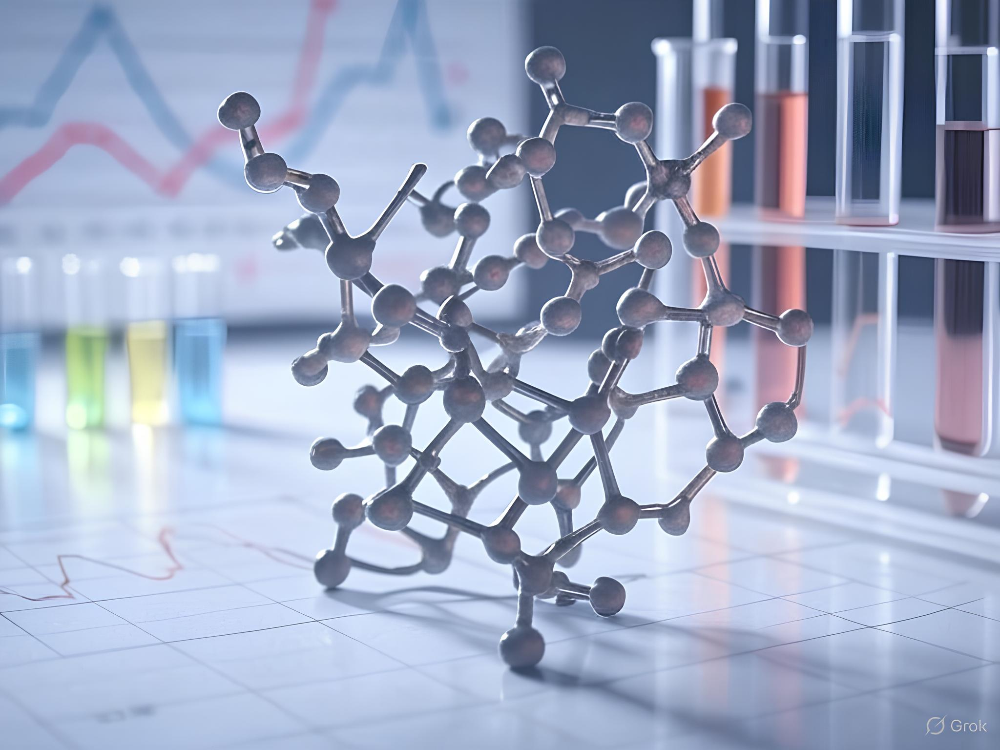

---

#### **Описание:**

Процесс создания нового лекарственного препарата является сложным и многоэтапным. Необходимо определить его химическую формулу, синтезировать соединение, провести первичные биологические испытания и организовать тестирование. Все эти этапы требуют значительного времени, однако современные методы машинного обучения способны существенно ускорить данный процесс.

Так, например, с помощью различных моделей можно спрогнозировать эффективность соединений и подобрать наиболее подходящие сочетания параметров для разработки лекарственных средств.

Тем не менее, для достижения качественного результата в подобного рода задачах важно наладить эффективное взаимодействие между химиками и специалистами по машинному обучению, что зачастую оказывается непростой задачей.

Химиками были предоставлены конфиденциальные данные о $1000$ химических соединений с указанием их эффективности против вируса гриппа. Параметры, характеризующие эффективность, обозначаются как $IC50$, $CC50$ и $SI$.

---


#### **Постановка задачи:**

На основании предоставленных данных от химиков необходимо построить прогноз, позволяющий подобрать наиболее эффективное сочетание параметров для создания лекарственных препаратов.

Для этого требуется:

Проанализировать текущие параметры с использованием различных методов.
Научиться предсказывать их эффективность.
Как и в любой задаче машинного обучения, здесь нет однозначного ответа на вопрос, какая модель обеспечит наилучший результат. Поэтому необходимо протестировать различные подходы, проанализировать возможные результаты, сравнить качество построенных моделей и сделать обоснованные выводы.

Необходимо создать несколько максимально эффективных моделей для решения следующих задач:

* Регрессия для $IC50$;

* Регрессия для $CC50$;

* Регрессия для $SI$;

* Классификация: превышает ли значение $IC50$ медианное значение выборки;

* Классификация: превышает ли значение $CC50$ медианное значение выборки;

* Классификация: превышает ли значение $SI$ медианное значение выборки;

* Классификация: превышает ли значение $SI$ значение $8$.

---


#### **Основные цели:**

* Сформировать набор данных на основе предоставленных источников информации;

* Исследовать предоставленные данные и выявить закономерности;

* Спроектировать новые признаки с помощью *Feature Engineering* и выявить наиболее значимые при построении модели;

* Произвести первичный отбор признаков на основании корреляционного анализа и дисперсии. 

---


#### **Этапы работы над проектом:**

Проект будет состоять из шести частей:

`1.` *Базовый анализ и знакомство с данными*;

`2.` *Очистка данных*;

`3.` *Разведывательный анализ данных (EDA)*;

`4.` *Feature engineering (Создание новых признаков)*;

`5.` *Отбор признаков*;

`6.` *Вывод*.

---

**Импортируем необходимые библиотеки:**

In [1]:
# Для работы с данными
import numpy as np
import pandas as pd
from sklearn import feature_selection
from sklearn import preprocessing
from scipy import stats
import joblib


# Для построения графиков
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly import subplots
from plotly.figure_factory import create_distplot
import plotly.figure_factory as ff
import plotly.io as pio
from statsmodels.graphics.gofplots import qqplot


# Для работы с моделями
from sklearn import pipeline
from sklearn import base

**Загрузка данных:**

In [2]:
# Загружаем 'DataFrame'
molecule_data = pd.read_excel('data/Данные_для_курсовои_Классическое_МО.xlsx')

# Создаём копию оригинального 'DataFrame'
molecule_df = molecule_data.copy()

# Выводим размерность
print(f'Размер данных: {molecule_df.shape}')

Размер данных: (1001, 214)


=============================================================================================================================================

## <CENTER> **`1.` Базовый анализ и знакомство с данными**

На данном этапе изучим информацию предоставленных данных.

#### $1.1$

**Выведем информацию по таблицам.**

Создаём функцию:

In [3]:
# Создадим функцию для вывода информации по датасету
def check_data_inf(data, data_name = None, length1 = None, length2 = None):
    
    # Выводим размеры таблицы
    print(f'Данные таблицы "{data_name}" имеют следующую размерность:\n')
    print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(data.shape[0], data.shape[1]))
    print('-' * length1)

    # Выведем первые пять строк 
    display(data)
    print('-' * length2)

Выводим результат:

In [4]:
# Выводим информацию по полученным таблицам при помощи функции 'check_data_inf'
check_data_inf(
    data = molecule_df,
    data_name = 'molecule_df',
    length1 = 40,
    length2 = 150
)

Данные таблицы "molecule_df" имеют следующую размерность:

Количество строк: 1001;
Количество признаков (столбцов): 214.
----------------------------------------


,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,0,6.239374,175.482382,28.125000,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,...,0,0,0,0,0,0,0,0,3,0
1,1,0.771831,5.402819,7.000000,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,...,0,0,0,0,0,0,0,0,3,0
2,2,223.808778,161.142320,0.720000,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,...,0,0,0,0,0,0,0,0,3,0
3,3,1.705624,107.855654,63.235294,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,...,0,0,0,0,0,0,0,0,4,0
4,4,107.131532,139.270991,1.300000,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,996,31.000104,34.999650,1.129017,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,...,0,0,0,0,0,0,0,0,0,0
997,997,31.999934,33.999415,1.062484,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,...,0,0,0,0,0,0,0,0,0,0
998,998,30.999883,33.999458,1.096761,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,...,1,0,0,0,0,0,0,0,0,0
999,999,31.998959,32.999644,1.031272,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,...,0,0,0,0,0,0,0,0,0,0


------------------------------------------------------------------------------------------------------------------------------------------------------


#### **Основные характеристики (признаки):**

Большинство из представленных признаков - это химические дескрипторы, описывающие свойства молекул (молекулярная масса, топология, функциональные группы, гидрофобность и т.д.). 

--

**Типы дескрипторов:**

1. **Общие молекулярные свойства:**

   * `MolWt`: Молекулярная масса (в дальтонах).
   
   * `HeavyAtomMolWt`: Масса тяжелых атомов (без учета водорода).
   
   * `ExactMolWt`: Точная молекулярная масса.
   
   * `NumValenceElectrons`: Число валентных электронов.
   
   * `NumRadicalElectrons`: Число радикальных электронов (обычно 0, если молекула стабильна).

2. **Топологические и структурные дескрипторы:**

   * `MaxAbsEStateIndex`, `MaxEStateIndex`, `MinAbsEStateIndex`, `MinEStateIndex`: Индексы E-State (Electrotopological State), описывающие распределение электронов в молекуле.
   
   * `Chi0`, `Chi0n`, `Chi0v`, `Chi1`, ..., `Chi4v`: Индексы связности (Chi indices), описывающие топологию молекулы.
   
   * `Kappa1`, `Kappa2`, `Kappa3`: Индексы формы молекулы (Kappa shape indices).
   
   * `BalabanJ`, `BertzCT`: Индексы, связанные с топологической сложностью молекулы.

3. **Свойства поверхности:**

   * `PEOE_VSA1`, ..., `PEOE_VSA14`: Площади поверхности с определенными частичными зарядами (Partial Equalization of Orbital Electronegativities VSA).

   * `SMR_VSA1`, ..., `SMR_VSA9`: Площади поверхности, связанные с молекулярной рефракцией.

   * `SlogP_VSA1`, ..., `SlogP_VSA9`: Площади поверхности, связанные с гидрофобностью (логарифм коэффициента распределения октанол/вода).

   * `TPSA`: Полярная площадь поверхности (Topological Polar Surface Area), связана с проницаемостью молекулы через мембраны.

   * `LabuteASA`: Приблизительная площадь поверхности молекулы (по методу Labute).

4. **Функциональные группы (fr_*):**

   * Столбцы (`fr_amide`, `fr_benzene`, `fr_nitro`, и т.д.) показывают количество определенных функциональных групп в молекуле.

     * `fr_amide`: Количество амидных групп.
     * `fr_benzene`: Количество бензольных колец.
     * `fr_nitro`: Количество нитрогрупп.
     * `fr_Al_OH`: Количество алифатических гидроксильных групп.
     * `fr_ester`, `fr_ether`, `fr_ketone`: Количество эфиров, простых эфиров, кетонов и т.д.

5. **Физико-химические свойства:**

   * `MolLogP`: Логарифм коэффициента распределения (гидрофобность).

   * `MolMR`: Молекулярная рефракция (связана с поляризуемостью молекулы).

   * `qed`: Quantitative Estimate of Drug-likeness (оценка "похожести на лекарство").

   * `SPS`: Сложность молекулы (Spacial Score).

6. **Счетчики атомов и связей:**

   * `HeavyAtomCount`: Количество тяжелых атомов.

   * `NHOHCount`: Количество гидроксильных групп или NH-групп.

   * `NOCount`: Количество атомов азота и кислорода.

   * `NumHAcceptors`, `NumHDonors`: Число акцепторов и доноров водородных связей.

   * `NumRotatableBonds`: Число вращаемых связей (гибкость молекулы).

7. **Кольца и циклические структуры:**

   * `NumAliphaticCarbocycles`, `NumAliphaticHeterocycles`: Количество алифатических карбоциклов и гетероциклов.

   * `NumAromaticRings`: Количество ароматических колец.

   * `RingCount`: Общее число колец в молекуле.

8. **Другие дескрипторы:**

   * `FpDensityMorgan1`, `FpDensityMorgan2`, `FpDensityMorgan3`: Плотность молекулярных отпечатков (Morgan fingerprints), используемых для оценки сходства молекул.

   * `BCUT2D_*`: BCUT-дескрипторы, связанные с топологией и зарядами.

   * `FractionCSP3`: Доля sp³-гибридизованных углеродов (показывает "трехмерность" молекулы).

--

**Целевые переменные:**

* `IC50, mM`: Полумаксимальная ингибирующая концентрация (в миллимолярных единицах). Это мера эффективности соединения в подавлении биологической активности (например, вируса или фермента).

* `CC50, mM`: Полумаксимальная цитотоксическая концентрация. Показывает, при какой концентрации соединение становится токсичным для клеток.

* `SI`: Индекс селективности (`SI = CC50 / IC50`). Чем выше SI, тем более селективно соединение (эффективно против мишени, но менее токсично для клеток).

---

#### $1.2$

Выведем информацию по признакам:

In [5]:
# Вывод таблицы 'df'
print('Информация датасета "df":\n')
display(molecule_df.info())
print('-' * 45)

Информация датасета "df":

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1001 entries, 0 to 1000
Columns: 214 entries, Unnamed: 0 to fr_urea
dtypes: float64(107), int64(107)
memory usage: 1.6 MB


None

---------------------------------------------


Так как данные имеют слишком большую размерность, вывести всю информацию не получится.

#### $1.3$

**Подсчитаем количество типов данных по признакам.**

Создаём функцию для подсчёта:

In [6]:
# Создаём функцию для рассчёта количества типов по признакам
def check_features_dtypes(data, data_name = None, length1 = None, length2 = None):
    
    # Подсчет количества признаков типа 'object', 'int64' и 'float64'      
    object_columns_count = data.select_dtypes(include = ['object']).shape[1]
    int64_columns_count = data.select_dtypes(include = ['int64']).shape[1]
    float64_columns_count = data.select_dtypes(include = ['float64']).shape[1]
    bool_columns_count = data.select_dtypes(include = ['bool']).shape[1]


    # Вывод результата
    print(f'В таблице "{data_name}" представлены признаки следующих типов:')
    print('-' * length1)
    print()

    print(f"Количество признаков типа 'object': {object_columns_count}")
    print(f"Количество признаков типа 'int64': {int64_columns_count}")
    print(f"Количество признаков типа 'float64': {float64_columns_count}")
    print(f"Количество признаков типа 'bool': {bool_columns_count}")
    print('-' * length2)

Выводим результат:

In [7]:
# Выводим данные таблицы 'molecule_df'
check_features_dtypes(
    data = molecule_df,
    data_name = 'molecule_df',
    length1 = 55,
    length2 = 40
)

В таблице "molecule_df" представлены признаки следующих типов:
-------------------------------------------------------

Количество признаков типа 'object': 0
Количество признаков типа 'int64': 107
Количество признаков типа 'float64': 107
Количество признаков типа 'bool': 0
----------------------------------------


#### $1.4$

Выведем описательные характеристики по признакам:

In [8]:
# Вывод таблицы
print('Описательные характеристики датасета "molecule_df":\n')
display(molecule_df.describe())
print('-' * 150)

Описательные характеристики датасета "molecule_df":



,Unnamed: 0,"IC50, mM","CC50, mM",SI,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
count,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,...,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.0,1001.000000,1001.000000,1001.000000
mean,500.000000,222.805156,589.110728,72.508823,10.831637,10.831637,0.180681,-0.967237,0.580412,29.487989,...,0.053946,0.011988,0.008991,0.000999,0.000999,0.051948,0.0,0.069930,0.204795,0.006993
std,289.108111,402.169734,642.867508,684.482739,3.307505,3.307505,0.168710,1.588036,0.212230,12.742749,...,0.259011,0.108886,0.094441,0.031607,0.031607,0.222033,0.0,0.255157,1.215326,0.083373
min,0.000000,0.003517,0.700808,0.011489,2.321942,2.321942,0.000039,-6.992796,0.059567,9.416667,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,250.000000,12.515396,99.999036,1.433333,9.252350,9.252350,0.051073,-1.334487,0.442842,18.486486,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
50%,500.000000,46.585183,411.039342,3.846154,12.179236,12.179236,0.124606,-0.419485,0.634981,29.290323,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
75%,750.000000,224.975928,894.089176,16.566667,13.167843,13.167843,0.291020,0.061754,0.742483,38.750000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
max,1000.000000,4128.529377,4538.976189,15620.600000,15.933463,15.933463,1.374614,1.374614,0.947265,60.272727,...,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,20.000000,1.000000


------------------------------------------------------------------------------------------------------------------------------------------------------


=============================================================================================================================================

## <CENTER> **`2.` Очистка данных**

На данном этапе выявим и очистим данные от пропусков, дубликатов и выбрасов.

#### $2.1$

**Проверим данные на наличие пропусков.**

Создаём $2$ функции для рассчёта пропусков и построения тепловой карты:

In [9]:
# Создаём функцию для подсчёта суммарного количества пропусков
def missing_values_count(data, data_name = None, length = None):
    
    # Выводим суммарное количество пропусков
    print('Суммарное количество пропусков в таблице "{}": {} \n'.format(data_name, data.isnull().sum().sum()))

    # Выводим признаки с сумрным количеством пропусков
    print('Информация по количествам пропусков: \n\n{} \n'.format(data.isnull().sum()))
    print('-' * length)




# Построим тепловую карту пропусков
# Создаём функцию отображения пропущенных значений на тепловой карте
def missing_values_heatmap(data):
    
    # Рассчитываем количество пропусков
    cols_null_persent = data.isnull().mean() * 100
    cols_with_null = cols_null_persent[cols_null_persent > 0].sort_values(ascending = False)
    print(f'Информация по количествам пропусков в процентах:\n\n{cols_with_null}')
    print('-' * 50)
    
    # Задаём параметры графика
    colors = sns.color_palette('coolwarm')
    fig = plt.figure(figsize = (30, 13))
    cols = cols_with_null.index
    
    # Строим тепловую карту
    ax = sns.heatmap(
        data = data[cols].isnull(),
        cmap = sns.color_palette(colors)
    )
    
    # Задаём название графика
    plt.title('Тепловая карта пропущенных значений', fontsize = 20)
    
    # Выводим график
    plt.show()
    print('-' * 150)
    
    return ax

Выводим результаты выборки:

Суммарное количество пропусков в таблице "molecule_df": 36 

Информация по количествам пропусков: 

Unnamed: 0           0
IC50, mM             0
CC50, mM             0
SI                   0
MaxAbsEStateIndex    0
                    ..
fr_thiazole          0
fr_thiocyan          0
fr_thiophene         0
fr_unbrch_alkane     0
fr_urea              0
Length: 214, dtype: int64 

--------------------------------------------------


Информация по количествам пропусков в процентах:

MaxPartialCharge       0.2997
MinPartialCharge       0.2997
MaxAbsPartialCharge    0.2997
MinAbsPartialCharge    0.2997
BCUT2D_MWHI            0.2997
BCUT2D_MWLOW           0.2997
BCUT2D_CHGHI           0.2997
BCUT2D_CHGLO           0.2997
BCUT2D_LOGPHI          0.2997
BCUT2D_LOGPLOW         0.2997
BCUT2D_MRHI            0.2997
BCUT2D_MRLOW           0.2997
dtype: float64
--------------------------------------------------


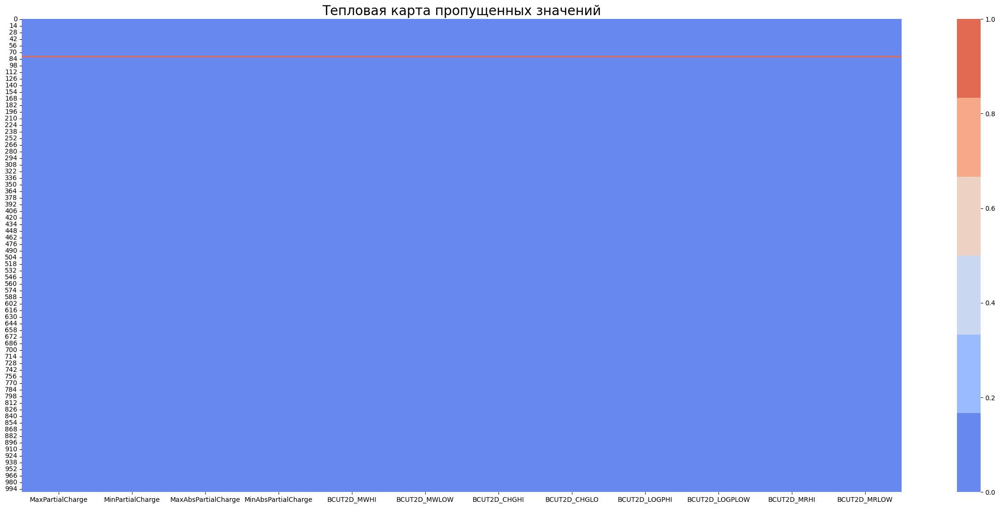

------------------------------------------------------------------------------------------------------------------------------------------------------


<Axes: title={'center': 'Тепловая карта пропущенных значений'}>

In [10]:
# Выводим количество пропусков
missing_values_count(
    data = molecule_df,
    data_name = 'molecule_df',
    length = 50
)

print('\n')

# Выводим тепловую карту
missing_values_heatmap(data = molecule_df)

**Вывод:**

Из полученной информации видно, что пропуски имеют следующие признаки:

`MaxPartialCharge`_______ $0.2997$;

`MinPartialCharge`_______ $0.2997$;

`MaxAbsPartialCharge`____ $0.2997$;

`MinAbsPartialCharge`____ $0.2997$;

`BCUT2D_MWHI`____________ $0.2997$;

`BCUT2D_MWLOW`___________ $0.2997$;

`BCUT2D_CHGHI`___________ $0.2997$;

`BCUT2D_CHGLO`___________ $0.2997$;

`BCUT2D_LOGPHI`__________ $0.2997$;

`BCUT2D_LOGPLOW`_________ $0.2997$;

`BCUT2D_MRHI`____________ $0.2997$;

`BCUT2D_MRLOW`___________ $0.2997$.

Так же видно, что общее количество пропущенных значений не превышает $0.3$%.

Заменим пропуски медианным значением:

In [11]:
# Обработка пропусков: замена пропусков медианным значением для каждого столбца
for column in molecule_df.columns:
    if molecule_df[column].isnull().sum() > 0:
        molecule_df[column] = molecule_df[column].fillna(molecule_df[column].median())
        
        
        
# Выводим количество пропусков после обработки
missing_values_count(
    data = molecule_df,
    data_name = 'molecule_df',
    length = 50
)

Суммарное количество пропусков в таблице "molecule_df": 0 

Информация по количествам пропусков: 

Unnamed: 0           0
IC50, mM             0
CC50, mM             0
SI                   0
MaxAbsEStateIndex    0
                    ..
fr_thiazole          0
fr_thiocyan          0
fr_thiophene         0
fr_unbrch_alkane     0
fr_urea              0
Length: 214, dtype: int64 

--------------------------------------------------


#### $2.2$

**Проверяем данные на наличие дубликатов:**

In [12]:
# Создаём список признаков
dupl_columns = list(molecule_df.columns)


# Создаём маску дубликатов с помощью метода duplicated() и произведём фильтрацию
mask = molecule_df.duplicated(subset = dupl_columns)
train_duplicates = molecule_df[mask]
print(f'Число найденных дубликатов: {train_duplicates.shape[0]}')

Число найденных дубликатов: 0


#### $2.3$

**Проверяем данные на наличие выбросов.**

Создадим сфункцию для построения коробчатых диаграмм с выбросами:

In [13]:
# Создаём функцию для построения визуализации
def boxplot_outliers(data, features, palette = None, color = None, title1 = None, title2 = None, orient = None):
    
    """
    
    Функция для построения графиков выбросов:
    
    data - данные;
    features - список признаков;
    palette - цветовая палитра (если на графике несколько диаграмм);
    color - цвет графиков;
    title1 - заголовок графика;
    title2 - заголовок на самом графике;
    orient - расположение графика (v - вертикальное, h - горизонтальное).
    
    """
    
    # Создаём заголовок для графика
    print(title1)
    print('-' * 150)

    # Зададим размер графика
    plt.rcParams['figure.figsize'] = (30, 15)
    
    # Настройка выбросов
    flierprops = dict(
        marker = 'o', 
        color = '#D32F2F', 
        markersize = 5, 
        markerfacecolor = '#D32F2F'
    )

    # Создаём график
    sns.boxplot(
        data = data.loc[:, features],                   # данные
        color = color,                                  # цвет короба
        palette = palette,                              # цветовая палитра
        linewidth = 1.5,                                # толщина линий
        fliersize = 5,                                  # размер выбросов
        width = 0.5,                                    # ширина ящиков
        flierprops = flierprops,                        # настройки выбросов
        medianprops = dict(color = 'red', linewidth = 2),
        whiskerprops = dict(color = 'green', linewidth = 2),
        orient = orient
    )

    # Задаём настройки графика
    plt.title(title2, fontsize = 20)
    plt.xlabel('Признак', fontsize = 15)
    plt.ylabel('Значение', fontsize = 15)
    plt.xticks(fontsize = 15)                           # размер шрифта для подписей по оси X
    plt.yticks(fontsize = 15)                           # размер шрифта для подписей по оси Y
    plt.grid(True, linestyle = '--', linewidth = 0.5)   # сетка
    plt.tight_layout()                                  # автоматическая подгонка графика
    plt.show()                                          # вывод графика на экран
    
    #print('-' * 150)

Создадим список признаков с возможными выбросами:

In [14]:
# Создание списка признаков типа 'int64' и 'float64'
numeric_columns = molecule_df.select_dtypes(include = ['int64', 'float64']).columns.tolist()

Создадим функцию для поиска выбросов:

In [15]:
# Функция для поиска выбросов через IQR
def detect_outliers_iqr(data, features):
    
    # Создаём словарь, ключами которого будут индексы признаков,
    # а значениями - их количество
    outliers_dict = {}
    
    
    # Пройдёмся циклом for по признакам
    for feature in features:
        
        Q1 = data[feature].quantile(0.25)         # первый квартиль
        Q3 = data[feature].quantile(0.75)         # третий квартиль
        IQR = Q3 - Q1                             # межквартильный размах
        
        # Границы (нижняя и верхняя) для определения выбросов
        lower_bound = Q1 - 1.5 * IQR    
        upper_bound = Q3 + 1.5 * IQR   
        
        # Поиск выбросов
        outliers_dict[feature] = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)][feature]  
        
    return outliers_dict

Организуем поиск выбросов:

In [16]:
# Создаём переменную, в котором будем хранить признаки с количеством выбросов
outliers = detect_outliers_iqr(
    data = molecule_df,
    features = numeric_columns
)



# Создаём заглавие
print('\nИнформация по выбросам в данных:')
print('-' * 35)
print('\n\n\n')

# Вывод выбросов
for feature, values in outliers.items():
    if len(values) > 0:
        print('Признак: "{}"'.format(feature))
        print('Количество выбросов: {}'.format(len(values)))
        print('-' * 70)
        print()


Информация по выбросам в данных:
-----------------------------------




Признак: "IC50, mM"
Количество выбросов: 147
----------------------------------------------------------------------

Признак: "CC50, mM"
Количество выбросов: 39
----------------------------------------------------------------------

Признак: "SI"
Количество выбросов: 125
----------------------------------------------------------------------

Признак: "MaxAbsEStateIndex"
Количество выбросов: 19
----------------------------------------------------------------------

Признак: "MaxEStateIndex"
Количество выбросов: 19
----------------------------------------------------------------------

Признак: "MinAbsEStateIndex"
Количество выбросов: 21
----------------------------------------------------------------------

Признак: "MinEStateIndex"
Количество выбросов: 128
----------------------------------------------------------------------

Признак: "MolWt"
Количество выбросов: 46
----------------------------------------------

Как видно, в данных достаточно большое количество признаков имеют выбросы. Поэтому для визуализации отберём только признаки с общим количеством выбросов больше $100$. 

Построим визуализации выбранных признаков с выбросами:



Коробчатая диаграмма для выбранных признаков: ['IC50, mM', 'SI', 'MinEStateIndex', 'BCUT2D_MRHI', 'Ipc']
------------------------------------------------------------------------------------------------------------------------------------------------------


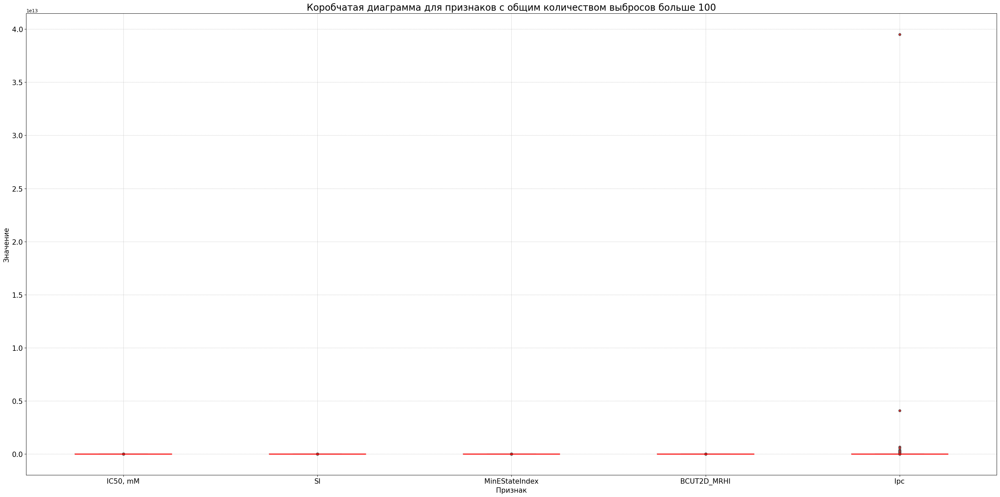



Коробчатая диаграмма для выбранных признаков: ['PEOE_VSA11', 'PEOE_VSA13', 'PEOE_VSA4', 'PEOE_VSA5', 'SMR_VSA9']
------------------------------------------------------------------------------------------------------------------------------------------------------


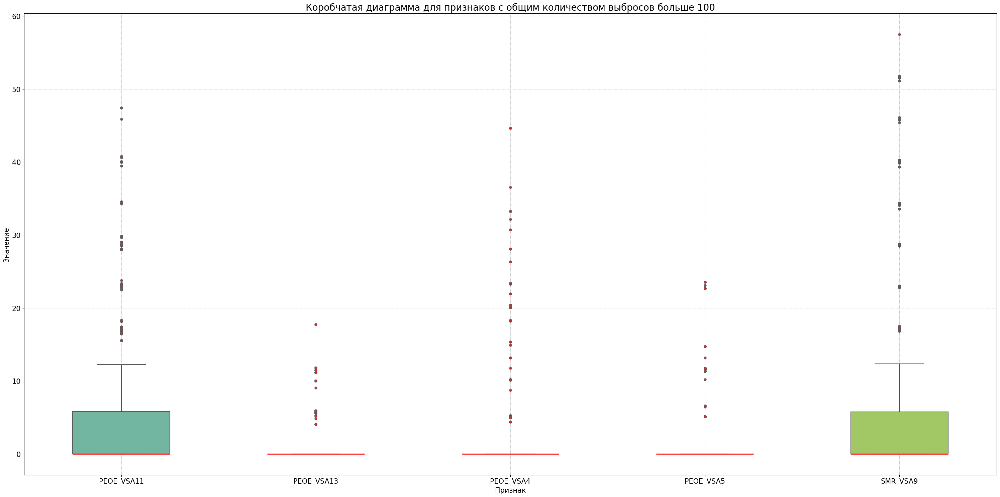



Коробчатая диаграмма для выбранных признаков: ['SlogP_VSA10', 'SlogP_VSA11', 'SlogP_VSA8', 'VSA_EState10', 'VSA_EState9']
------------------------------------------------------------------------------------------------------------------------------------------------------


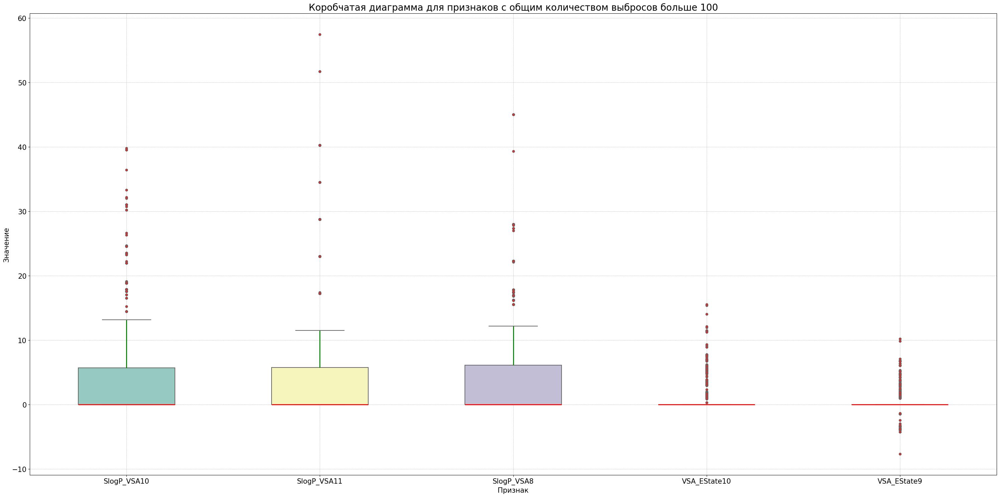



Коробчатая диаграмма для выбранных признаков: ['fr_Al_OH', 'fr_Al_OH_noTert', 'fr_Imine', 'fr_NH2', 'fr_alkyl_halide']
------------------------------------------------------------------------------------------------------------------------------------------------------


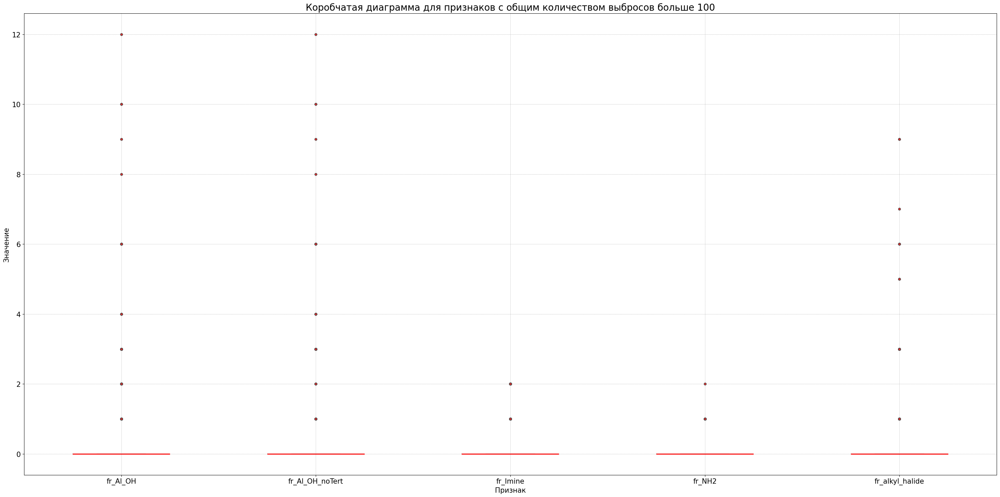



Коробчатая диаграмма для выбранных признаков: ['fr_allylic_oxid', 'fr_amide', 'fr_aniline', 'fr_aryl_methyl', 'fr_ester']
------------------------------------------------------------------------------------------------------------------------------------------------------


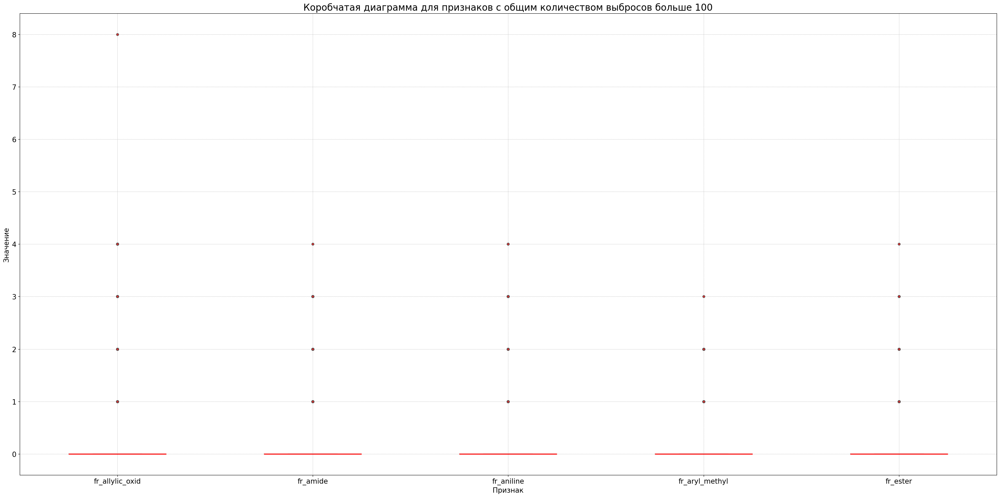



Коробчатая диаграмма для выбранных признаков: ['fr_halogen', 'fr_ketone', 'fr_methoxy', 'fr_para_hydroxylation']
------------------------------------------------------------------------------------------------------------------------------------------------------


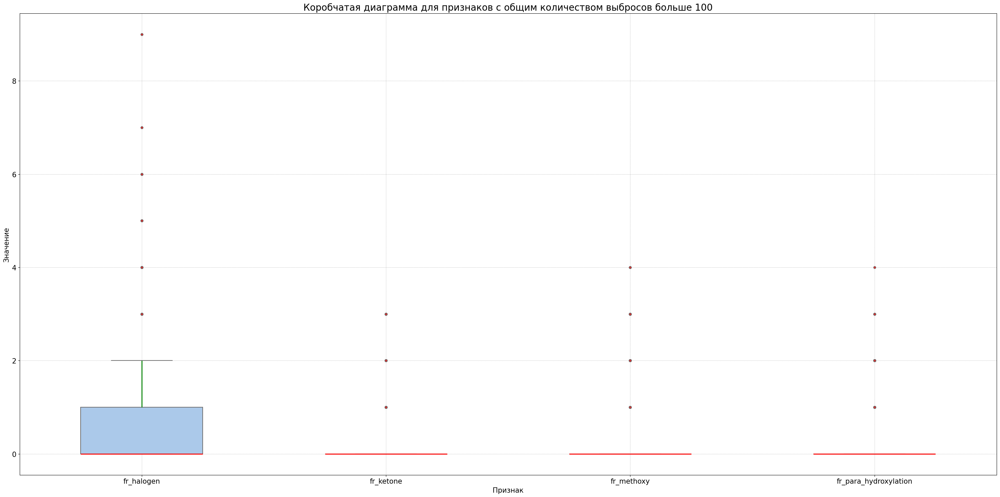

------------------------------------------------------------------------------------------------------------------------------------------------------


In [17]:
# Выбираем признаки с числом выбросов больше 100
outliers_features_list1 = ['IC50, mM', 'SI', 'MinEStateIndex', 'BCUT2D_MRHI', 'Ipc']
outliers_features_list2 = ['PEOE_VSA11', 'PEOE_VSA13', 'PEOE_VSA4', 'PEOE_VSA5', 'SMR_VSA9']
outliers_features_list3 = ['SlogP_VSA10', 'SlogP_VSA11', 'SlogP_VSA8', 'VSA_EState10', 'VSA_EState9']
outliers_features_list4 = ['fr_Al_OH', 'fr_Al_OH_noTert', 'fr_Imine', 'fr_NH2', 'fr_alkyl_halide']
outliers_features_list5 = ['fr_allylic_oxid', 'fr_amide', 'fr_aniline', 'fr_aryl_methyl', 'fr_ester']
outliers_features_list6 = ['fr_halogen', 'fr_ketone', 'fr_methoxy', 'fr_para_hydroxylation']

# Создаём общий список признаков
outliers_features_list = [
    outliers_features_list1, outliers_features_list2,
    outliers_features_list3, outliers_features_list4,
    outliers_features_list5, outliers_features_list6
]

# Создаём список цветовых палитр
colors_list = ['Set1', 'Set2', 'Set3', 'deep', 'muted', 'pastel']



# Припомощи цикла for создадим 6 графиков
for features_list, colors in zip(outliers_features_list, colors_list):
    
    print('\n')
    
    # Вызываем функцию
    boxplot_outliers(
        data = molecule_df,
        features = features_list,
        palette = colors,
        title1 = f'Коробчатая диаграмма для выбранных признаков: {features_list}',
        title2 = 'Коробчатая диаграмма для признаков с общим количеством выбросов больше 100',
        orient = 'v'
    )
    
    
print('-' * 150)

Дополнительно, построим диаграммы целевых переменных друг возле друга и ещё нескольких признаков под ними:


Распределение признаков с учетом выбросов
------------------------------------------------------------------------------------------------------------------------------------------------------


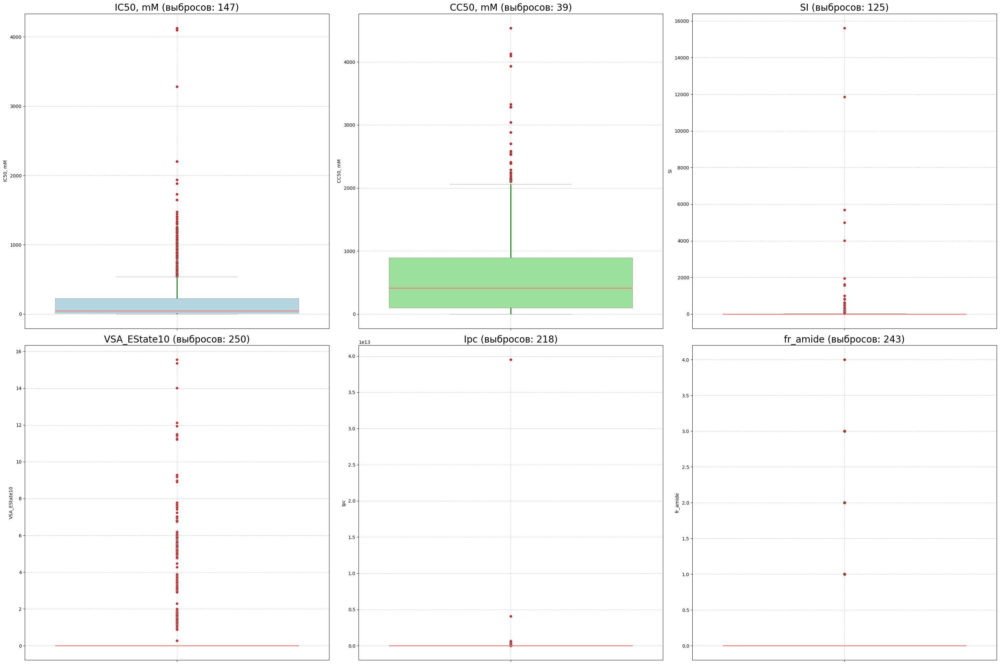

------------------------------------------------------------------------------------------------------------------------------------------------------


In [18]:
# Создаём список признаков, которые будем проверять на выбросы
outlier_cols = ['IC50, mM', 'CC50, mM', 'SI', 'VSA_EState10', 'Ipc', 'fr_amide']

# Задаём заглавие для графиков
print('\nРаспределение признаков с учетом выбросов')
print('-' * 150)



# Задаём размер графика
plt.figure(figsize = (30, 20))

# Строим коробчатые графики распределения признаков
for i, col in enumerate(outlier_cols, 1):
    
    # Создаём 6 графиков в двух рядах
    plt.subplot(2, 3, i)
    
    # Строим график распределения
    sns.boxplot(
        y = molecule_df[col], 
        color = ['lightblue', 'lightgreen', 'lightpink', 'lightyellow', 'lightgray', 'lightcoral'][i-1],
        linewidth = 0.5,
        fliersize = 5,
        flierprops = dict(marker = 'o', markerfacecolor = 'red', markersize = 5, linestyle = 'none'),
        medianprops = dict(color = 'lightcoral', linewidth = 2),
        whiskerprops = dict(color = 'green', linewidth = 2),
        orient = 'v'
    )
    
    # Задаём параметры графика
    plt.title(f'{col} (выбросов: {len(molecule_df[(molecule_df[col] < molecule_df[col].quantile(0.25) - 1.5*(molecule_df[col].quantile(0.75) - molecule_df[col].quantile(0.25))) | (molecule_df[col] > molecule_df[col].quantile(0.75) + 1.5*(molecule_df[col].quantile(0.75) - molecule_df[col].quantile(0.25)))][col])})', fontsize = 20)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    
    # Убираем лишние пробелы в названиях столбцов
    plt.tight_layout()



# Выводим графики
plt.show()
print('-' * 150)

**Вывод:**

Выбросы в целевых переменных и дескрипторах могут быть не ошибками, а отражением реальной вариации в химических соединениях (например, высокоэффективные или токсичные молекулы).

Структурные признаки (`fr_*`) часто имеют выбросы, так как они представляют счетчики функциональных групп, которые могут быть редкими (например, `fr_term_acetylene`: $1$ выброс).

#### $2.4$

Проведём корреляционный анализ целевых переменных:


Корреляционная матрица целевых признаков
------------------------------------------------------------------------------------------------------------------------------------------------------


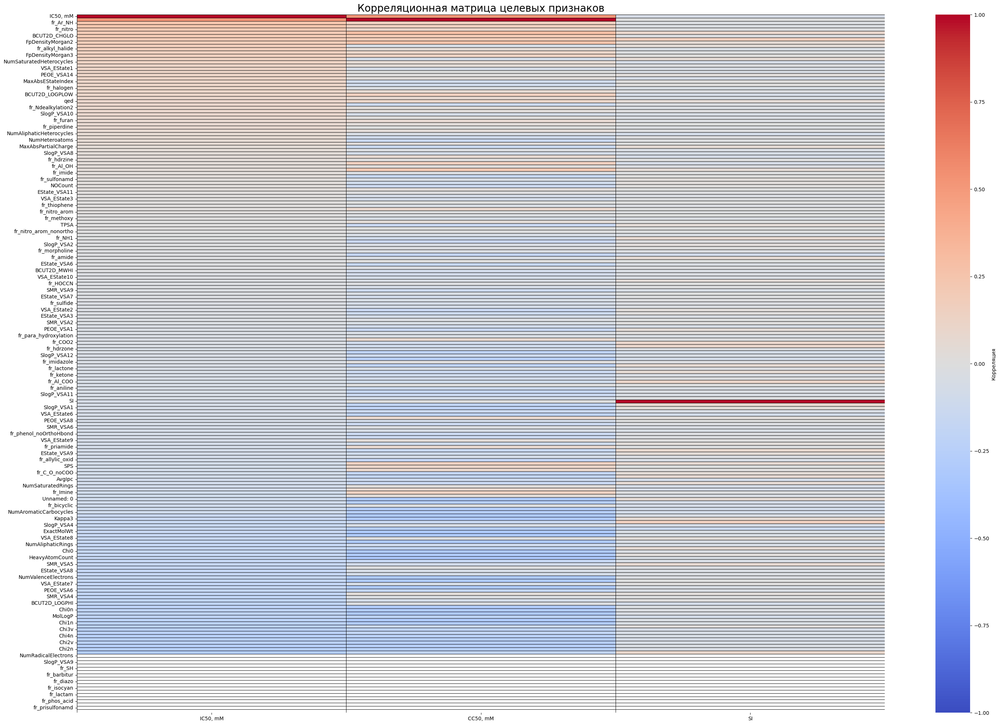

------------------------------------------------------------------------------------------------------------------------------------------------------


In [19]:
# Создаём список целевых переменных
target_cols = ['IC50, mM', 'CC50, mM', 'SI']

# Выбираем числовые признаки
numeric_cols = molecule_df.select_dtypes(include = ['int64', 'float64']).columns.tolist()

# Создаём матрицу корреляции
corr_matrix = molecule_df[numeric_cols].corr()



# Задаём заглавие для тепловой карты
print('\nКорреляционная матрица целевых признаков')
print('-' * 150)


# Задаём размер графика
plt.figure(figsize = (30, 20))

# Строим тепловую карту
sns.heatmap(
    corr_matrix[target_cols].sort_values(by = 'IC50, mM', ascending = False),
    annot = False,
    fmt = '.2f',
    vmin = -1,
    vmax = 1,
    cmap = 'coolwarm',
    linewidths = 0.5,
    linecolor = 'black',
    cbar_kws = {'label': 'Корреляция'}
)

# Задаём параметры графика
plt.title('Корреляционная матрица целевых признаков', fontsize = 20)

# Убираем лишние пробелы в названиях столбцов
plt.tight_layout()

# Выводим график
plt.show()
print('-' * 150)

**Вывод:**

По данной тепловой карте видно, что многие признаки (например, `FpDensityMorgan2`, `FpDensityMorgan3`, `MaxAbsEStateIndex`, `BCUT2D_LOP2LOW`, `MolLogP`, `Chiv3`) имеют умеренно сильную отрицательную корреляцию (в синем спектре) с `IC50, nM`. Значит: при увеличении значений этих признаков `IC50` уменьшается, что может говорить о влиянии химических структурных характеристик на активность соединений.

=============================================================================================================================================

## <CENTER> **`3.` Разведывательный анализ данных (EDA)**

В данной части проекта мы:

* изучаем сгенерированный набор данных;

* дополним наш анализ визуализациями, иллюстрирующими исследование.

#### $3.1$

**Сравнение `IC50, mM`, `CC50, mM`, `SI` в одной диаграмме.**

С помощью коробчатой диаграммы визуализируем распределение всех трех целевых переменных:

In [20]:
# Выбираем целевые переменные
target_cols = ['IC50, mM', 'CC50, mM', 'SI']

# Создаём новый 'DataFrame' с целевыми переменными
df_melted = molecule_df[target_cols].melt(
    var_name = 'Показатель', 
    value_name = 'Значение'
)

# Выводим информацию по полученным таблицам при помощи функции 'check_data_inf'
check_data_inf(
    data = df_melted,
    data_name = 'df_melted',
    length1 = 40,
    length2 = 80
)



# Выводим информацию по целевым переменным
print('Информация по целевым переменным:\n')
display(df_melted.info())
print('-' * 80)

# Выводим описательные характеристики целевых переменных
print('Описательные характеристики целевых переменных:\n')
display(df_melted.describe())
print('-' * 80)

# Выводим количество пропусков в целевых переменных
print('Количество пропусков в целевых переменных:\n')
display(df_melted.isnull().sum())
print('-' * 80)

# Выводим количество уникальных значений в целевых переменных
print('Количество уникальных значений в целевых переменных:\n')
display(df_melted.nunique())
print('-' * 80)

Данные таблицы "df_melted" имеют следующую размерность:

Количество строк: 3003;
Количество признаков (столбцов): 2.
----------------------------------------


,Показатель,Значение
0,"IC50, mM",6.239374
1,"IC50, mM",0.771831
2,"IC50, mM",223.808778
3,"IC50, mM",1.705624
4,"IC50, mM",107.131532
...,...,...
2998,SI,1.129017
2999,SI,1.062484
3000,SI,1.096761
3001,SI,1.031272


--------------------------------------------------------------------------------
Информация по целевым переменным:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3003 entries, 0 to 3002
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Показатель  3003 non-null   object 
 1   Значение    3003 non-null   float64
dtypes: float64(1), object(1)
memory usage: 47.1+ KB


None

--------------------------------------------------------------------------------
Описательные характеристики целевых переменных:



,Значение
count,3003.000000
mean,294.808236
std,628.252335
min,0.003517
25%,6.052017
50%,41.666667
75%,330.355621
max,15620.600000


--------------------------------------------------------------------------------
Количество пропусков в целевых переменных:



Показатель    0
Значение      0
dtype: int64

--------------------------------------------------------------------------------
Количество уникальных значений в целевых переменных:



Показатель       3
Значение      2486
dtype: int64

--------------------------------------------------------------------------------


Строим график распределения:


Коробчатая диаграмма распределение целевых переменных:
------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\User\AppData\Local\Temp\ipykernel_18808\2127243236.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


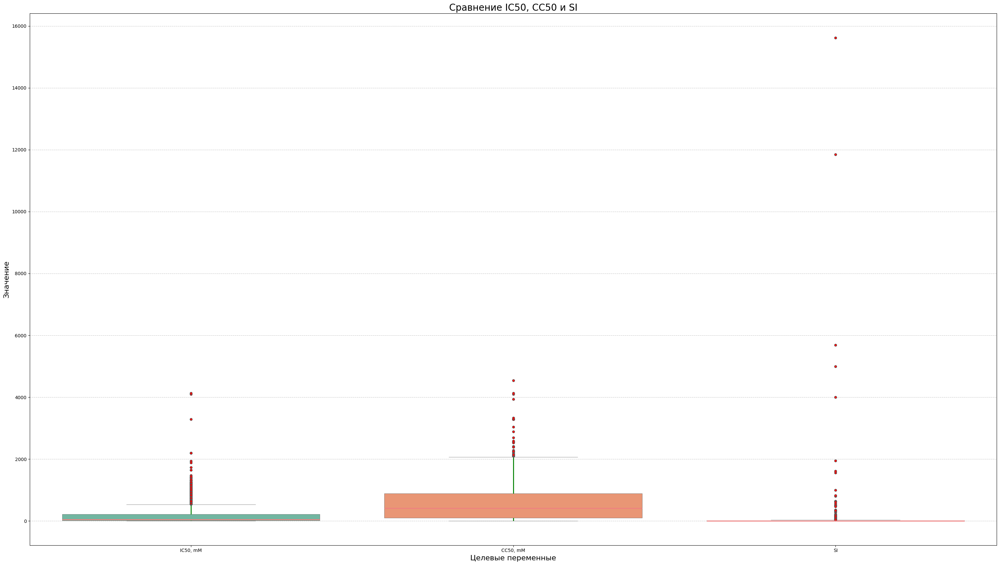

------------------------------------------------------------------------------------------------------------------------------------------------------


In [22]:
# Задаём заглавие для графика
print('\nКоробчатая диаграмма распределение целевых переменных:')
print('-' * 150)



# Задаём размер графика
plt.figure(figsize = (30, 17))

# Строим график распределения
sns.boxplot(
    data = df_melted, 
    x = 'Показатель', 
    y = 'Значение', 
    palette = 'Set2',
    linewidth = 0.5,
    fliersize = 5,
    flierprops = dict(marker = 'o', markerfacecolor = 'red', markersize = 5, linestyle = 'none'),
    medianprops = dict(color = 'lightcoral', linewidth = 2),
    whiskerprops = dict(color = 'green', linewidth = 2),
    orient = 'v'
)

plt.title('Сравнение IC50, CC50 и SI', fontsize = 20)
plt.ylabel('Значение', fontsize = 16)
plt.xlabel('Целевые переменные', fontsize = 16)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# Убираем лишние пробелы в названиях столбцов
plt.tight_layout()

# Выводим график
plt.show()
print('-' * 150)

**Вывод:**

Как и раньше было выявлено, все переменные содержат выбросы. У `IC50` и `CC50` медиана находится на относительно низком уровне, но распределения отличаются, что касается `SI`, то медиана визуально близка к нулю, что может указывать на высокую токсичность при низкой эффективности у ряда соединений.

#### $3.2$

**Анализ структурных признаков (fr_*).**

Построим столбчатую диаграмму распределения признаков `(fr_*)`:


График распределения ненулевых значений по "fr_*" признакам:
------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\User\AppData\Local\Temp\ipykernel_18808\2385139241.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize = 10)                          # размер шрифта для легенды


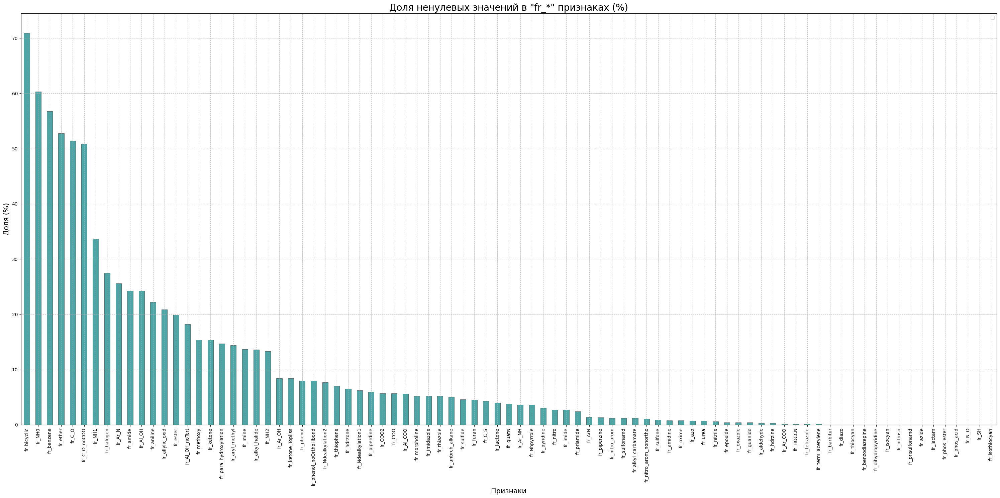

------------------------------------------------------------------------------------------------------------------------------------------------------


In [23]:
# Производим отбор признаков (fr_*)
fr_columns = [col for col in molecule_df.columns if col.startswith('fr_')]
fr_nonzero = (molecule_df[fr_columns] > 0).sum() / len(molecule_df) * 100



# Задаём заглавие для графика
print('\nГрафик распределения ненулевых значений по "fr_*" признакам:')
print('-' * 150)

# Задаём размер графика
plt.figure(figsize = (30, 15))

# Строим график распределения ненулевых значений
fr_nonzero.sort_values(ascending = False).plot(
    kind = 'bar',
    color = 'teal',
    alpha = 0.7,
    edgecolor = 'black',
    linewidth = 0.5
)

# Задаём параметры графика
plt.title('Доля ненулевых значений в "fr_*" признаках (%)', fontsize = 20)
plt.xlabel('Признаки', fontsize = 15)
plt.ylabel('Доля (%)', fontsize = 15)
plt.xticks(rotation = 90, fontsize = 10)           # размер шрифта для подписей по оси X
plt.yticks(fontsize = 10)                          # размер шрифта для подписей по оси Y
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend(fontsize = 10)                          # размер шрифта для легенды

# Убираем лишние пробелы в названиях столбцов
plt.tight_layout()                                  

# Выводим график
plt.show()   
print('-' * 150)                                      

**Вывод:**

По графику видно, что менее чем $10$ соединенеий содержат группы `fr_*` в количестве $50$% и более, так же большинство признаков `fr_*` содержат очень много нулевых значений.

#### $3.3$

**Парный график для ключевых признаков.**

Исследуем зависимости между ключевыми признаками при помощи парного графика:


Парный график для ключевых признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigne

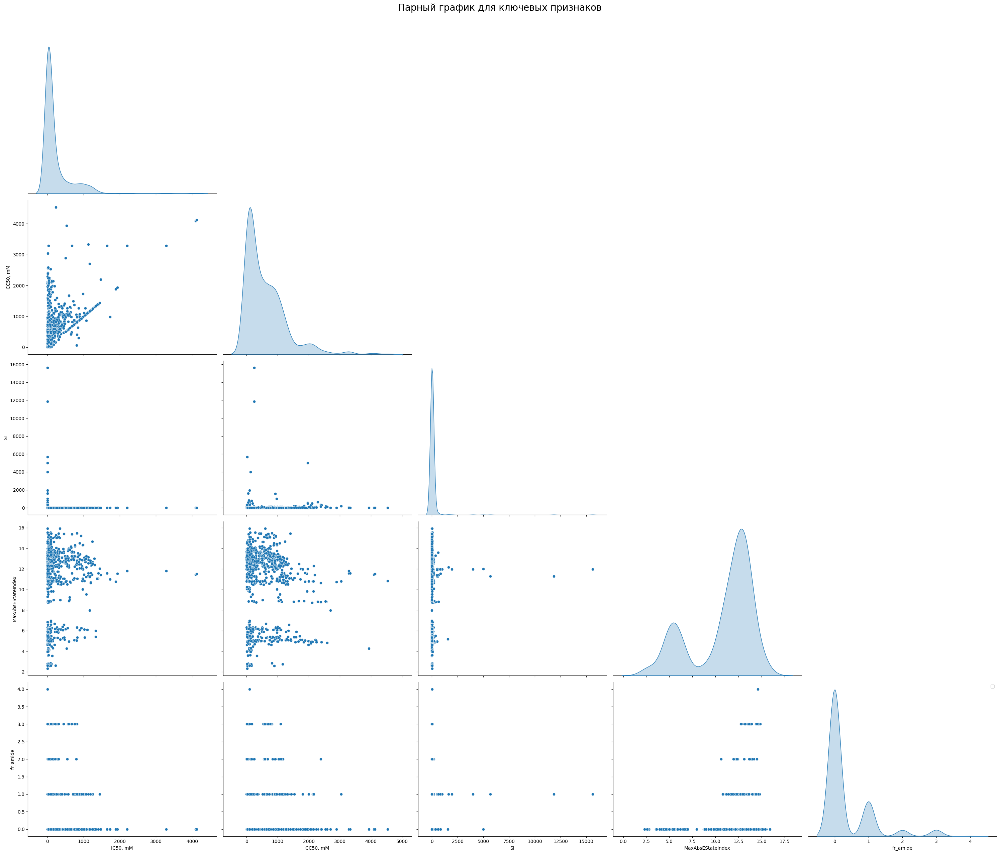

------------------------------------------------------------------------------------------------------------------------------------------------------


In [24]:
# Выделяем ключевые признаки
key_features = ['IC50, mM', 'CC50, mM', 'SI', 'MaxAbsEStateIndex', 'fr_amide']



# Задаём заглавие для графика
print('\nПарный график для ключевых признаков:')
print('-' * 150)

# Задаём размер графика
plt.rcParams['figure.figsize'] = (30, 30)

# Строим парный график
sns.pairplot(
    molecule_df[key_features],
    diag_kind = 'kde',
    corner = True,
    palette = 'husl',
    markers = ['o', 's', 'D'],
    height = 5,
    aspect = 1.2
)

# Задаём параметры графика
plt.suptitle('Парный график для ключевых признаков', fontsize = 20, y = 1.02)
plt.xlabel('Признаки', fontsize = 15)
plt.ylabel('Признаки', fontsize = 15)
plt.xticks(fontsize = 10)                          # размер шрифта для подписей по оси X
plt.yticks(fontsize = 10)                          # размер шрифта для подписей по оси Y
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend(fontsize = 10)                          # размер шрифта для легенды

# Убираем лишние пробелы в названиях столбцов
plt.tight_layout()

# Выводим график
plt.show()    
print('-' * 150)                             

**Вывод:**

Признаки `IC50`, `CC50`, и `SI` имеют пикообразные распределения с длинными хвостами, указывающими на наличие выбросов или редких значений. `MaxAbsEStateIndex` и `fr_amide` показывают более узкие распределения с меньшей вариацией. Так же наблюдается слабая линейная связь между `IC50` и `CC50`, что логично, так как оба показателя связаны с концентрацией. `SI` демонстрирует слабую корреляцию с `IC50` и `CC50`, что отражает его производную природу.

#### $3.4$

**Точечная диаграмма с цветовым кодированием.**

Визуализируем взаимосвязь между `IC50` и `CC50` с цветовым обозначением по `SI` чтобы понять, как соотносятся эффективность и токсичность соединений, а также выделить выбросы:


Точечная диаграмма (Matplotlib) взаимосвязи межжду "IC50" и "CC50" с цветовым обозначением "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


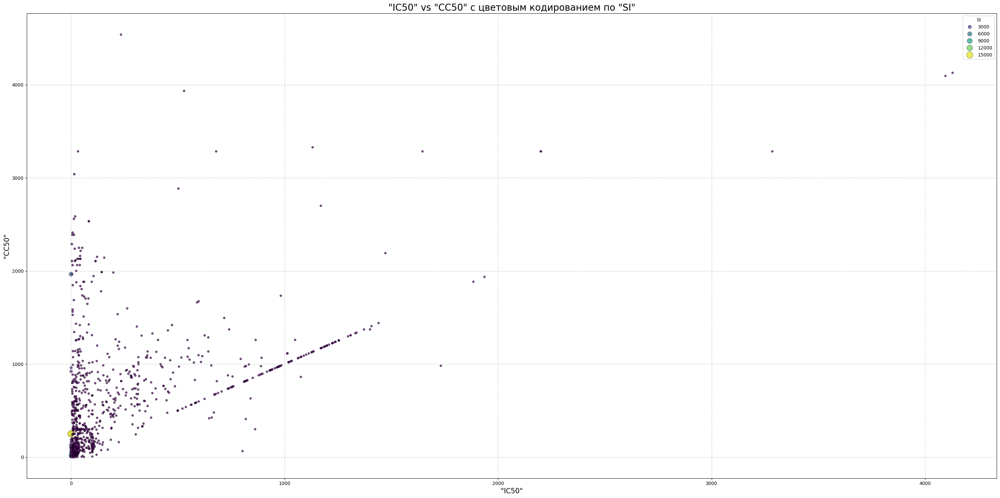

------------------------------------------------------------------------------------------------------------------------------------------------------



Точечная диаграмма (Plotly) взаимосвязи межжду "IC50" и "CC50" с цветовым обозначением "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


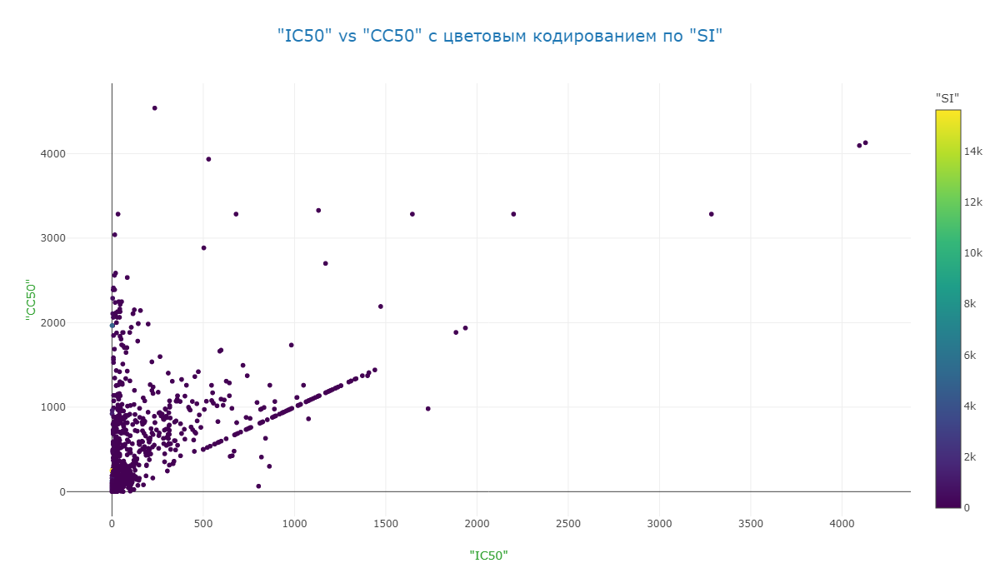

------------------------------------------------------------------------------------------------------------------------------------------------------


In [25]:
# Создаём заглавие для графика
print('\nТочечная диаграмма (Matplotlib) взаимосвязи межжду "IC50" и "CC50" с цветовым обозначением "SI":')
print('-' * 150)

# Задаём размер графика
plt.figure(figsize = (30, 15))

# Строим точечную диаграмму
sns.scatterplot(
    data = molecule_df,
    x = 'IC50, mM',
    y = 'CC50, mM',
    hue = 'SI',
    palette = 'viridis',
    size = 'SI',
    sizes = (20, 200),
    alpha = 0.7,
    edgecolor = 'black',
    linewidth = 0.5
)

# Задаём параметры графика
plt.title('"IC50" vs "CC50" с цветовым кодированием по "SI"', fontsize = 20)
plt.xlabel('"IC50"', fontsize = 15)
plt.ylabel('"CC50"', fontsize = 15)
plt.xticks(fontsize = 10)                          # размер шрифта для подписей по оси X
plt.yticks(fontsize = 10)                          # размер шрифта для подписей по оси Y
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend(title = 'SI', fontsize = 10)            # легенда
plt.tight_layout()                                 # автоматическая подгонка графика

# Выводим график
plt.show()
print('-' * 150)
print('\n\n')




# Создаём заглавие для графика
print('Точечная диаграмма (Plotly) взаимосвязи межжду "IC50" и "CC50" с цветовым обозначением "SI":')
print('-' * 150)

# Определяем кастомный шаблон
pio.templates['custom_template'] = go.layout.Template(
    layout = dict(
        title = dict(font = dict(size = 20, color = '#1f77b4')),
        xaxis = dict(titlefont = dict(size = 14, color = '#2ca02c')),
        yaxis = dict(titlefont = dict(size = 14, color = '#2ca02c')),
        plot_bgcolor = 'white',
        paper_bgcolor = 'white'
    )
)

# Устанавливаем кастомный шаблон
pio.templates.default = 'custom_template'


# Строим график
fig = px.scatter(
    molecule_df,
    x = 'IC50, mM',
    y = 'CC50, mM',
    color = 'SI',
    hover_name = 'SI',
    title = '"IC50" vs "CC50" с цветовым кодированием по "SI"',
    
    labels = {
        'IC50, mM': '"IC50"',
        'CC50, mM': '"CC50"',
        'SI': '"SI"'
    }
)

# Задаём параметры графика
fig.update_layout(
    title = '"IC50" vs "CC50" с цветовым кодированием по "SI"',
    xaxis_title = '"IC50"',
    yaxis_title = '"CC50"',
    legend_title = '"SI"',
    width = 1200,
    height = 700,
    template = 'custom_template'
)

# Выводим график
fig.show('png')
print('-' * 150)

**Вывод:**

На данном графике наблюдается положительная корреляция между `IC50` и `CC50`, что логично, так как оба показателя связаны с концентрацией соединения. 

Цветовая шкала показывает, что более высокие значения `SI` встречаются редко и соответствуют высоким значениям `CC50` при низких `IC50`. Это указывает на потенциально селективные соединения.

#### $3.5$

**Визуализация трёхмерного пространства.**

Исследуем взаимосвязь между тремя целевыми переменными (`IC50`, `CC50`, `SI`) в $3D$-пространстве:


График трёхмерного пространства признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


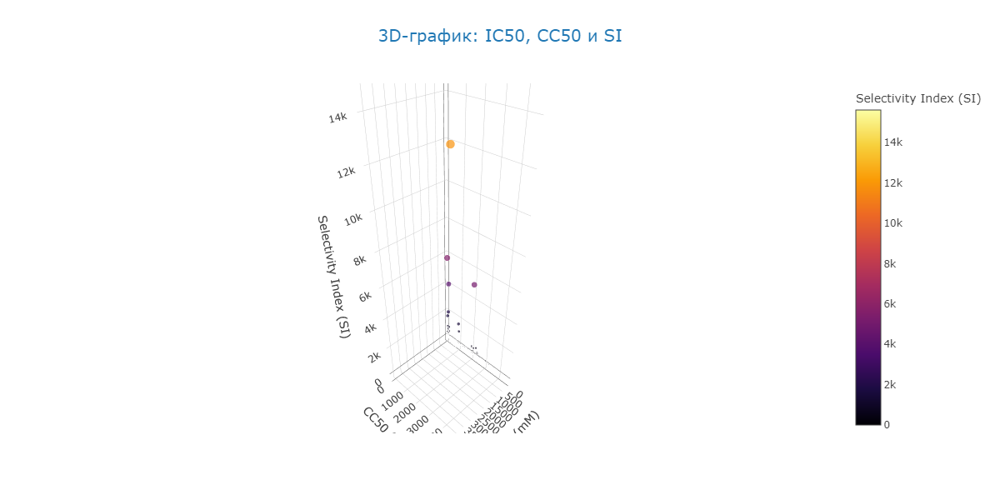

------------------------------------------------------------------------------------------------------------------------------------------------------


In [26]:
# Создаём заголовок для графика
print('\nГрафик трёхмерного пространства признаков:')
print('-' * 150)



# Интерактивный 3D scatter plot
fig = px.scatter_3d(
    molecule_df,
    x = 'IC50, mM',
    y = 'CC50, mM',
    z = 'SI',
    color = 'SI',
    color_continuous_scale = 'inferno',
    size = 'SI',
    hover_name = molecule_df.index,
    opacity = 0.7,
    title = '3D-график: IC50, CC50 и SI',
    
    labels = {
        'IC50, mM': 'IC50 (mM)',
        'CC50, mM': 'CC50 (mM)',
        'SI': 'Selectivity Index (SI)'
    }
)


# Настройка осей
fig.update_layout(
    
    width = 1200,
    height = 600,
    
    scene = dict(
        xaxis_title = 'IC50 (mM)',
        yaxis_title = 'CC50 (mM)',
        zaxis_title = 'Selectivity Index (SI)',
        camera_eye = dict(x = 1.5, y = 1.5, z = 1.5)
    )
)

# Отображение графика
fig.show('png')
print('-' * 150)

#### $3.6$

**Столбчатые гистограммы.**

Сравним распределения дескрипторов (возьмём следующие: `fr_NH0`, `fr_NH1`, `fr_NH2`, `fr_Nhpyrrole`) для всех уровней групп `SI`:



График распределения "fr_NH0" по категориям "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


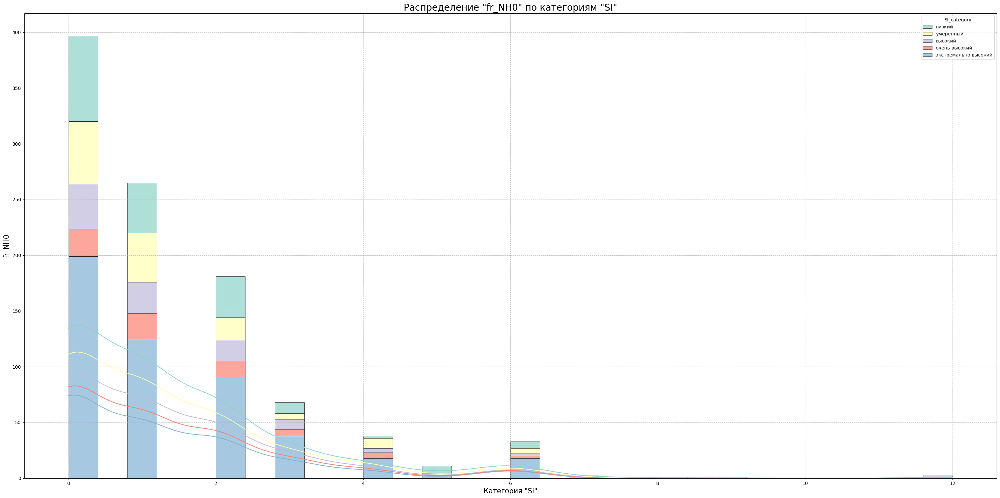



График распределения "fr_NH1" по категориям "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


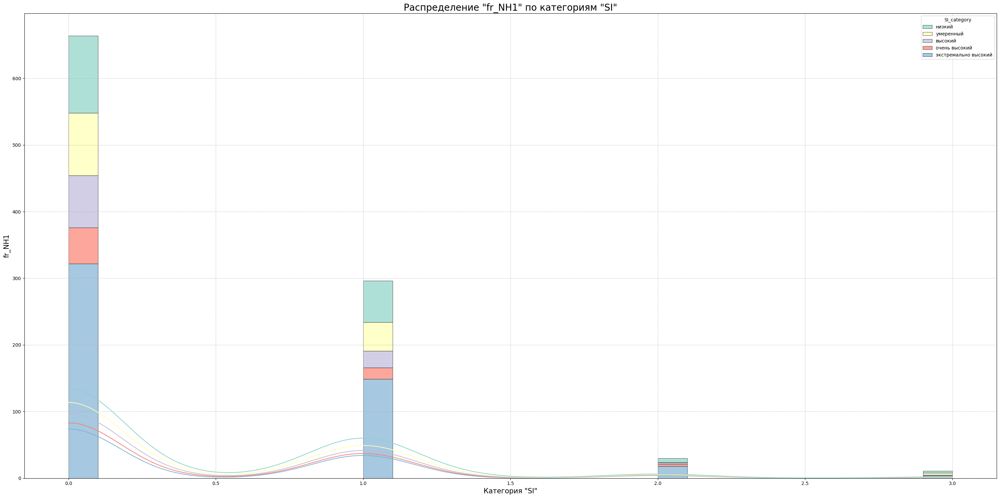



График распределения "fr_NH2" по категориям "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


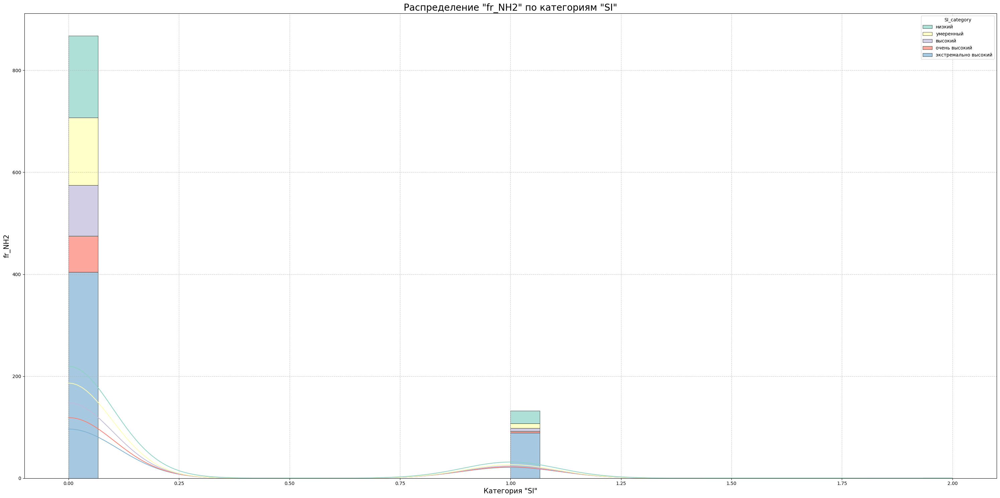



График распределения "fr_Nhpyrrole" по категориям "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


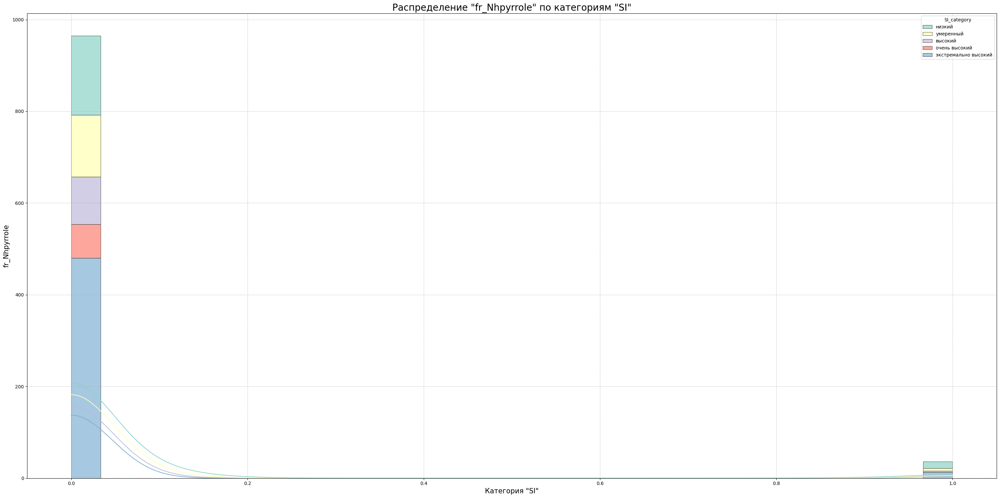

------------------------------------------------------------------------------------------------------------------------------------------------------


In [27]:
# Создаем бинарную категорию по SI 
molecule_df['SI_category'] = pd.cut(
    molecule_df['SI'],
    bins = [0, 1, 2, 3, 4, np.inf],
    labels = ['низкий', 'умеренный', 'высокий', 'очень высокий', 'экстремально высокий']
)

# Создаём список признаков для визуализации
descriptors_list = ['fr_NH0', 'fr_NH1', 'fr_NH2', 'fr_Nhpyrrole']



# Создаём график для каждого признака из списка
for descriptor in descriptors_list:
    
    print('\n')
    
    # Задаём заглавие для графиков
    print(f'График распределения "{descriptor}" по категориям "SI":')
    print('-' * 150)
    
    # Задаём размер графиков
    plt.figure(figsize = (30, 15))
    
    # Строим график распределения
    sns.histplot(
        data = molecule_df,
        x = descriptor,
        hue = 'SI_category',
        multiple = 'stack',
        bins = 30,
        palette = 'Set3',
        alpha = 0.7,
        edgecolor = 'black',
        linewidth = 0.5,
        kde = True
    )
    
    # Задаём параметры графика
    plt.title(f'Распределение "{descriptor}" по категориям "SI"', fontsize = 20)
    plt.xlabel('Категория "SI"', fontsize = 15)
    plt.ylabel(descriptor, fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    
    # Убираем лишние пробелы в названиях столбцов
    plt.tight_layout()
    
    # Выводим график
    plt.show()
    
print('-' * 150)

**Вывод:**

Признак `fr_*` имеет ограниченное влияние на селективность (`SI`), но может быть полезен в комбинации с другими дескрипторами для моделирования. Данные подтверждают гетерогенность набора, с акцентом на низкую селективность большинства соединений.

#### $3.7$

**Скрипичный график.**

Сравним распределения дескрипторов (возьмём следующие: `fr_aldehyde`, `fr_amide`, `fr_aniline`, `fr_amidine`) для всех уровней групп `SI`:



График распределения "fr_aldehyde" по категориям "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


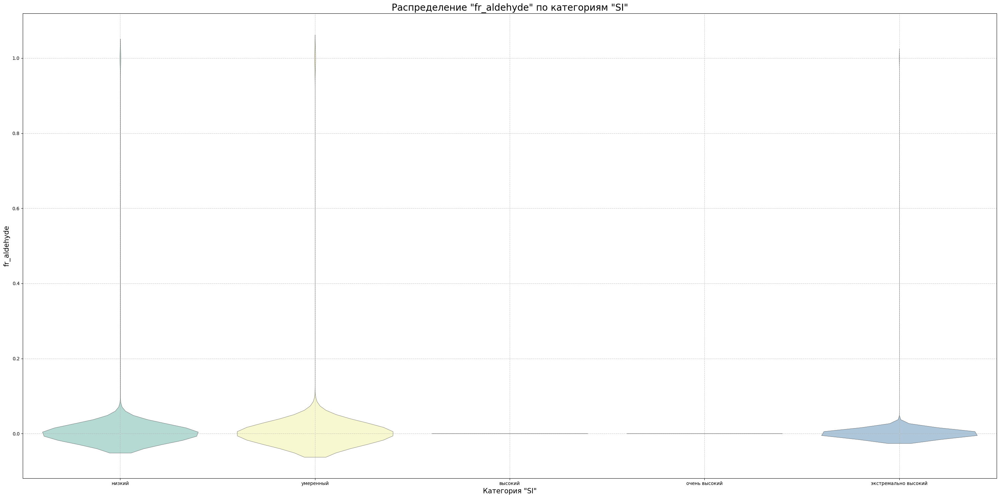



График распределения "fr_amide" по категориям "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


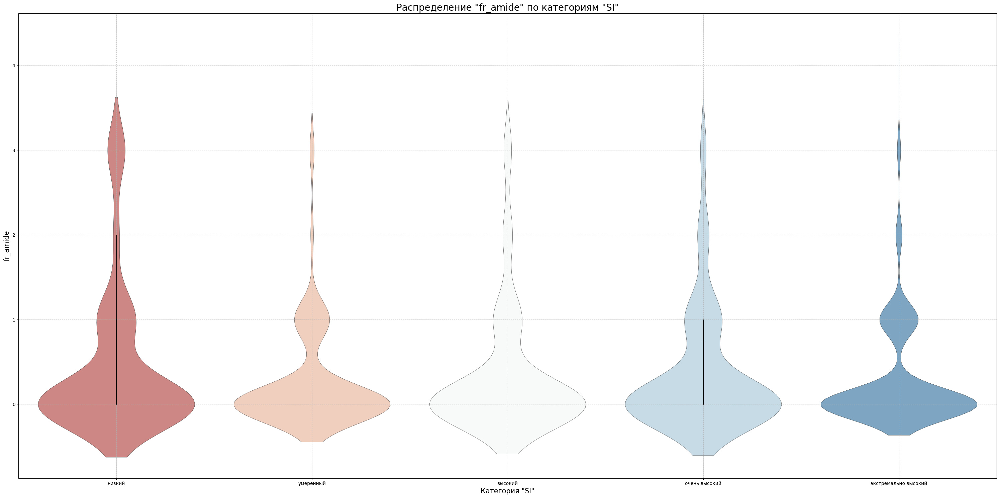



График распределения "fr_aniline" по категориям "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


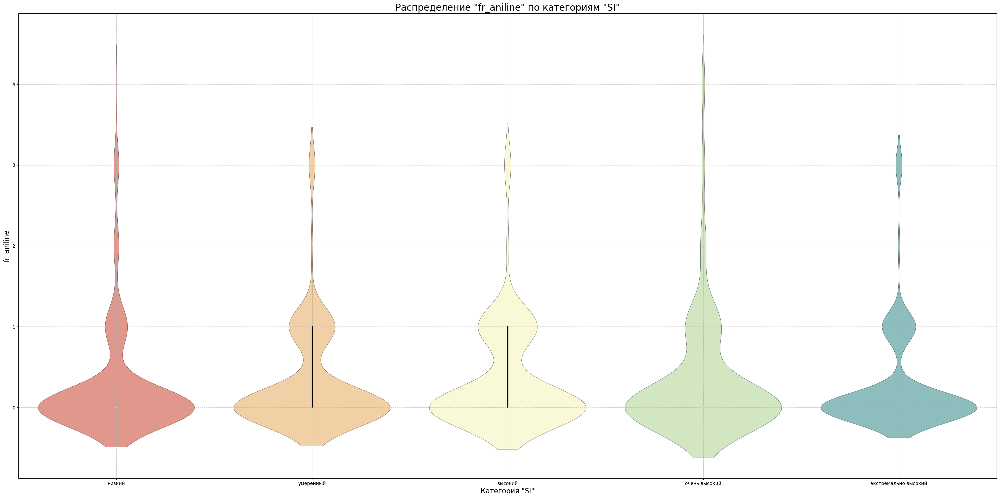



График распределения "fr_amidine" по категориям "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


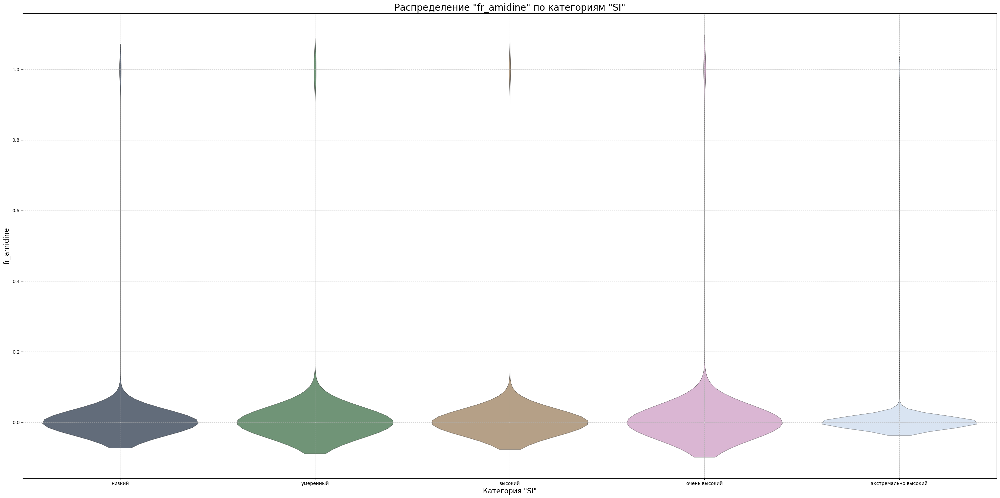

------------------------------------------------------------------------------------------------------------------------------------------------------


In [28]:
# Создаём список признаков для визуализации
descriptors_list = ['fr_aldehyde', 'fr_amide', 'fr_aniline', 'fr_amidine']

# Создаём список цветовых палитр
colors_list = ['Set3', 'RdBu', 'Spectral', 'cubehelix']



# Создаём график для каждого признака из списка
for descriptor, colors in zip(descriptors_list, colors_list):
    
    print('\n')
    
    # Задаём заглавие для графиков
    print(f'График распределения "{descriptor}" по категориям "SI":')
    print('-' * 150)
    
    # Задаём размер графиков
    plt.figure(figsize = (30, 15))
    
    # Строим график распределения
    sns.violinplot(
        data = molecule_df,
        x = 'SI_category',
        y = descriptor,
        hue = 'SI_category',
        palette = colors,
        alpha = 0.7,
        edgecolor = 'black',
        linewidth = 0.5
    )
    
    # Задаём параметры графика
    plt.title(f'Распределение "{descriptor}" по категориям "SI"', fontsize = 20)
    plt.xlabel('Категория "SI"', fontsize = 15)
    plt.ylabel(descriptor, fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    
    # Убираем лишние пробелы в названиях столбцов
    plt.tight_layout()
    
    # Выводим график
    plt.show()
    
print('-' * 150)

**Вывод:**

Признаки `fr_*` имеет ограниченное влияние на `SI`, но умеренное количество амидных групп может быть связано с улучшением селективности.

#### $3.8$

**Пузырьковая диаграмма.**

Визуализируем взаимосвязь между двумя дескрипторами (возьмём: `MaxAbsEStateIndex` и `MolWt`) с размером пузырьков по `IC50, mM` и цветом по `SI`:


Диаграмма рассеяния для признаков "MaxAbsEStateIndex", "MolWt":
------------------------------------------------------------------------------------------------------------------------------------------------------


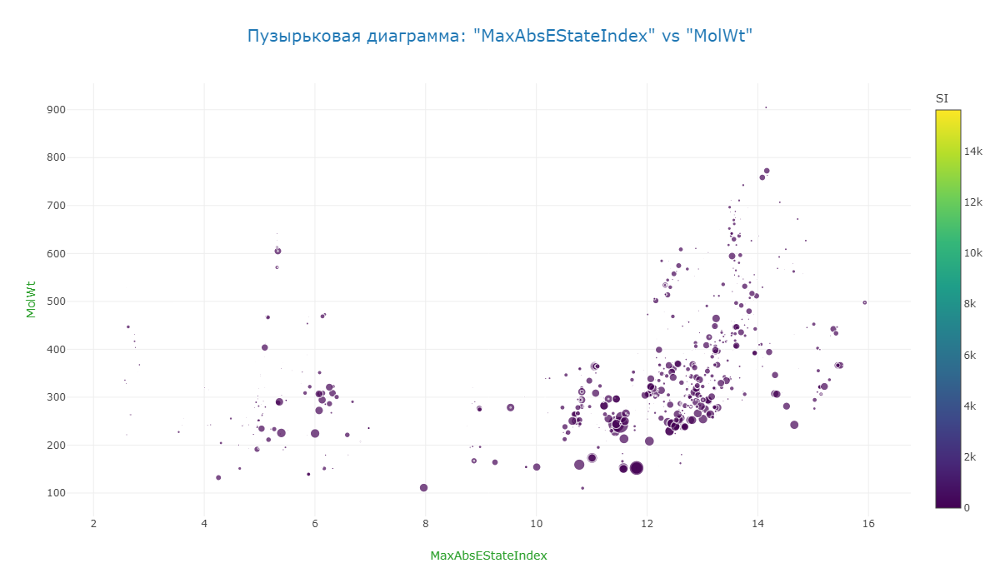

------------------------------------------------------------------------------------------------------------------------------------------------------


In [29]:
# Создаём заголовок для графика
print('\nДиаграмма рассеяния для признаков "MaxAbsEStateIndex", "MolWt":')
print('-' * 150)



# Строим график рассеяния
fig = px.scatter(
    molecule_df,
    x = 'MaxAbsEStateIndex',
    y = 'MolWt',
    color = 'SI',
    size = 'IC50, mM',
    hover_name = molecule_df.index,
    title = 'Пузырьковая диаграмма: "MaxAbsEStateIndex" vs "MolWt"',
    
    labels = {
        'MaxAbsEStateIndex': 'MaxAbsEStateIndex',
        'MolWt': 'MolWt'
    }
)


# Настройка осей
fig.update_layout(
    
    width = 1200,
    height = 700,
    
    scene = dict(
        xaxis_title = 'MaxAbsEStateIndex',
        yaxis_title = 'MolWt',
        zaxis_title = 'IC50, mM',
        camera_eye = dict(x = 1.5, y = 1.5, z = 1.5)
    )
)


# Отображение графика
fig.show('png')
print('-' * 150)

**Вывод:**

Молекулы с большей массой и более выраженным `MaxAbsEStateIndex` могут быть более селективными, но такие случаи, как следует из графика, немногочислены.

#### $3.9$

**Диаграмма рассеяния с гексагональными бинами.**

Визуализируем плотность данных:


Гексогональная диаграмма для признаков "IC50" и "CC50":
------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\User\AppData\Local\Temp\ipykernel_18808\4158686954.py:29: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



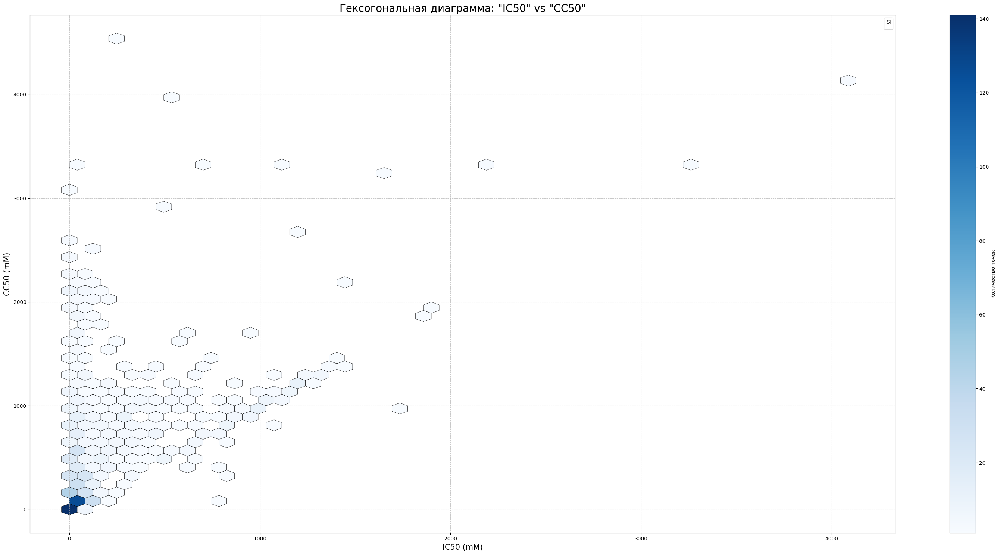

------------------------------------------------------------------------------------------------------------------------------------------------------


In [30]:
# Создаём заглавие для графика
print('\nГексогональная диаграмма для признаков "IC50" и "CC50":')
print('-' * 150)



# Задаём размер графика
plt.figure(figsize = (30, 15))

# Строим гексогональную диаграмму
plt.hexbin(
    molecule_df['IC50, mM'],
    molecule_df['CC50, mM'],
    gridsize = 50,
    cmap = 'Blues',
    mincnt = 1,
    linewidths = 0.5,
    edgecolors = 'black'
)

# Задаём параметры графика
plt.title('Гексогональная диаграмма: "IC50" vs "CC50"', fontsize = 20)
plt.xlabel('IC50 (mM)', fontsize = 15)
plt.ylabel('CC50 (mM)', fontsize = 15)
plt.colorbar(label = 'Количество точек')
plt.xticks(fontsize = 10)                          # размер шрифта для подписей по оси X
plt.yticks(fontsize = 10)                          # размер шрифта для подписей по оси Y
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend(title = 'SI', fontsize = 10)            # легенда

# Убираем лишние пробелы в названиях столбцов
plt.tight_layout()

# Выводим график
plt.show()
print('-' * 150)

**Вывод:**

Большинство молекул в наборе данных имеют низкие или умеренные значения `IC50` и `CC50`, что может быть связано с их потенциальной безопасностью или ограниченной эффективностью.

#### $3.10$

**Столбчатая и круговая диаграммы.**

Сравниваем средние значения `IC50, mM` и `CC50, mM` для двух групп соединений: с амидной группой (`fr_amide` > $0$) и без нее (`fr_amide` == $0$):


Столбчатая диаграмма: Средние "IC50" и "CC50" в зависимости от наличия "fr_amide":
------------------------------------------------------------------------------------------------------------------------------------------------------


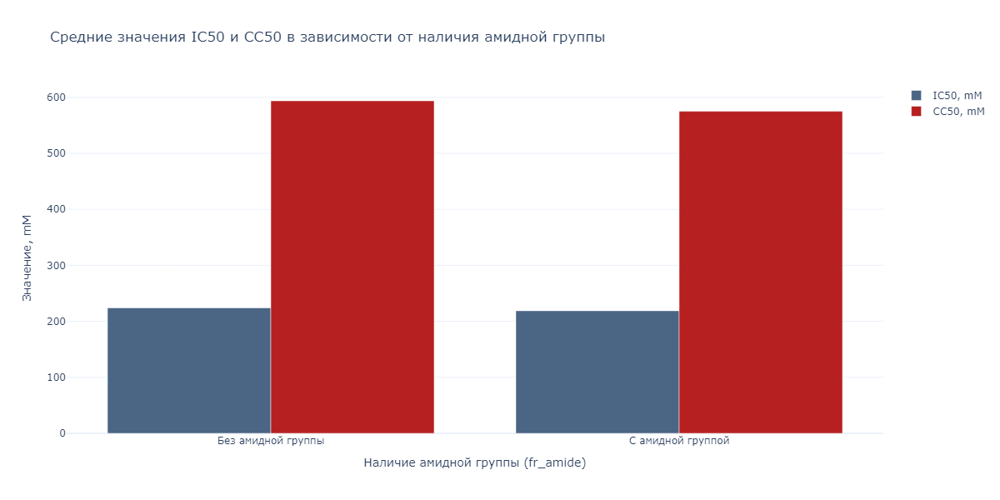

------------------------------------------------------------------------------------------------------------------------------------------------------

Круговая диаграмма: Доля ненулевых значений в "fr_*" признаках:


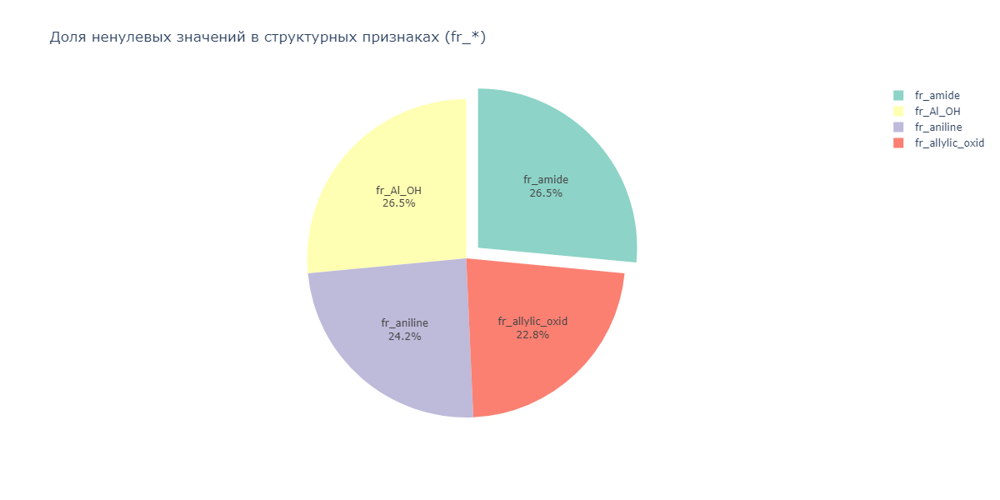

------------------------------------------------------------------------------------------------------------------------------------------------------


In [31]:
# Задаём заглавие для графика
print('\nСтолбчатая диаграмма: Средние "IC50" и "CC50" в зависимости от наличия "fr_amide":')
print('-' * 150)


# Создаем категорию: наличие/отсутствие fr_amide
molecule_df['fr_amide_presence'] = (molecule_df['fr_amide'] > 0).map({True: 'С амидной группой', False: 'Без амидной группы'})

# Группируем данные по наличию fr_amide и вычисляем средние значения IC50 и CC50
grouped_data = molecule_df.groupby('fr_amide_presence')[['IC50, mM', 'CC50, mM']].mean().reset_index()

# Создаем столбчатую диаграмму
fig1 = go.Figure()

# Добавляем столбцы для IC50
fig1.add_trace(go.Bar(
    x = grouped_data['fr_amide_presence'],
    y = grouped_data['IC50, mM'],
    name = 'IC50, mM',
    marker_color = '#4b6584'
))

# Добавляем столбцы для CC50
fig1.add_trace(go.Bar(
    x = grouped_data['fr_amide_presence'],
    y = grouped_data['CC50, mM'],
    name = 'CC50, mM',
    marker_color = "#b72020"
))

# Настраиваем оформление
fig1.update_layout(
    height = 600,
    width = 1200,
    title = 'Средние значения IC50 и CC50 в зависимости от наличия амидной группы',
    xaxis_title = 'Наличие амидной группы (fr_amide)',
    yaxis_title = 'Значение, mM',
    barmode = 'group',
    template = 'plotly_white'
)

# Показываем график
fig1.show('png')




# Задаём заглавие для графика
print('-' * 150)
print('\nКруговая диаграмма: Доля ненулевых значений в "fr_*" признаках:')


# Выбираем несколько fr_* признаков
fr_cols = ['fr_amide', 'fr_Al_OH', 'fr_aniline', 'fr_allylic_oxid']
fr_nonzero = (molecule_df[fr_cols] > 0).sum()

# Создаем круговую диаграмму
fig2 = px.pie(
    values = fr_nonzero.values,
    names = fr_nonzero.index,
    title = 'Доля ненулевых значений в структурных признаках (fr_*)',
    color_discrete_sequence = px.colors.qualitative.Set3
)

# Настраиваем оформление
fig2.update_traces(textinfo='percent+label', pull=[0.1, 0, 0, 0])  # Выделяем первый сектор
fig2.update_layout(
    height = 600,
    width = 1200,
    title = 'Доля ненулевых значений в структурных признаках (fr_*)',
    template = 'plotly_white'
)

# Показываем график
fig2.show('png')

print('-' * 150)

**Вывод:**



Проведём такой же анализ для следующих групп: `fr_aldehyde`, `fr_aniline`, `fr_amidine`:



Столбчатая и круговая диаграммы: Средние "IC50" и "CC50" в зависимости от наличия "fr_aldehyde":
------------------------------------------------------------------------------------------------------------------------------------------------------


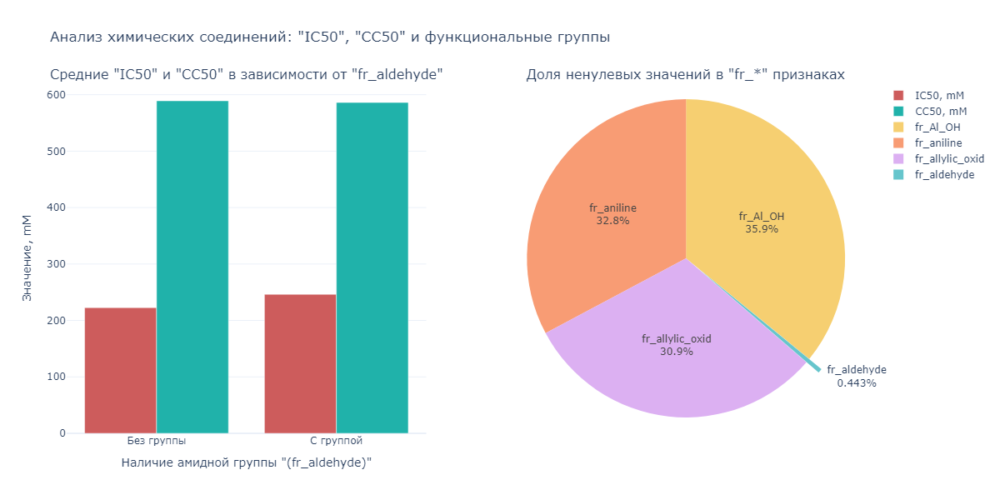



Столбчатая и круговая диаграммы: Средние "IC50" и "CC50" в зависимости от наличия "fr_aniline":
------------------------------------------------------------------------------------------------------------------------------------------------------


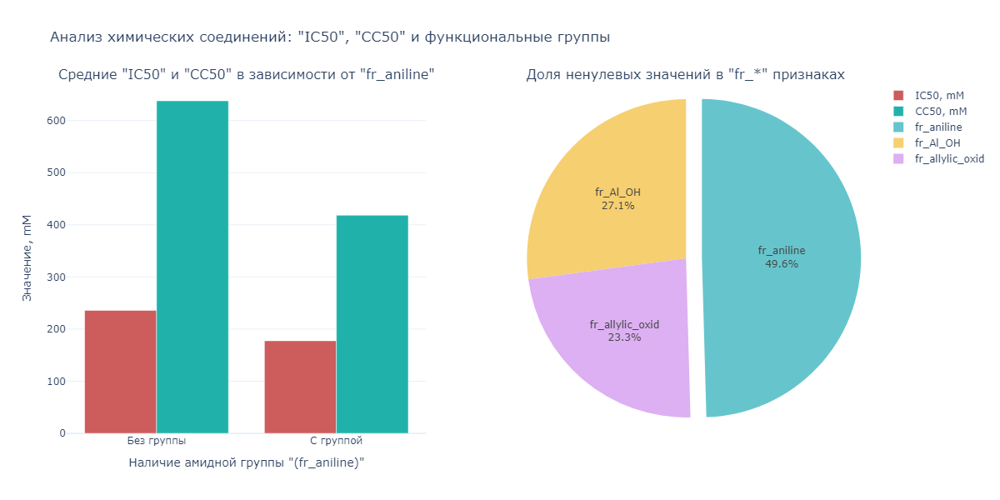



Столбчатая и круговая диаграммы: Средние "IC50" и "CC50" в зависимости от наличия "fr_amidine":
------------------------------------------------------------------------------------------------------------------------------------------------------


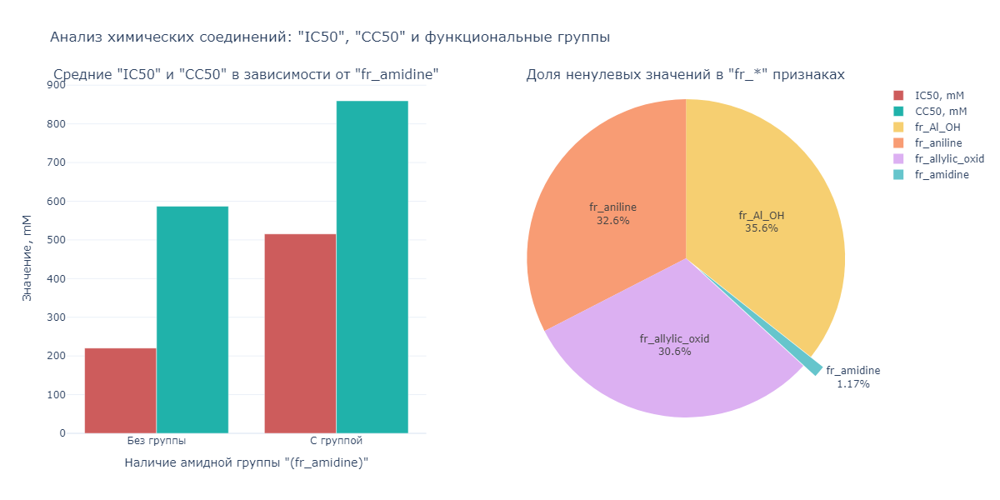

------------------------------------------------------------------------------------------------------------------------------------------------------


In [32]:
# Создаём список признаков для визуализации
groups_list = ['fr_aldehyde', 'fr_aniline', 'fr_amidine']



# Создаём график для каждого признака из списка
for group in groups_list:
    
    print('\n')
    
    # Задаём заглавие для графика
    print(f'Столбчатая и круговая диаграммы: Средние "IC50" и "CC50" в зависимости от наличия "{group}":')
    print('-' * 150)
    
    
    # Подготовка данных для столбчатой диаграммы
    # Создаем категорию: наличие/отсутствие group
    molecule_df[f'{group}_presence'] = (molecule_df[group] > 0).map({True: 'С группой', False: 'Без группы'})
    grouped_data = molecule_df.groupby(f'{group}_presence')[['IC50, mM', 'CC50, mM']].mean().reset_index()
    
    # Подготовка данных для круговой диаграммы
    fr_cols = [group, 'fr_Al_OH', 'fr_aniline', 'fr_allylic_oxid']
    fr_nonzero = (molecule_df[fr_cols] > 0).sum()
    
    # Создаем фигуру с подграфиками (1 строка, 2 столбца)
    fig = subplots.make_subplots(
        rows = 1, cols = 2,
        specs = [[{'type': 'bar'}, {'type': 'pie'}]],
        subplot_titles = (f'Средние "IC50" и "CC50" в зависимости от "{group}"', 'Доля ненулевых значений в "fr_*" признаках')
    )
    
    
    # Добавляем столбчатую диаграмму (левый подграфик)
    fig.add_trace(
        go.Bar(
            x = grouped_data[f'{group}_presence'],
            y = grouped_data['IC50, mM'],
            name = 'IC50, mM',
            marker_color = 'indianred'
        ),
        
        row = 1, col = 1
    )
    
    fig.add_trace(
        go.Bar(
            x = grouped_data[f'{group}_presence'],
            y = grouped_data['CC50, mM'],
            name = 'CC50, mM',
            marker_color = 'lightseagreen'
        ),
        
        row = 1, col = 1
    )
    
    
    # Добавляем круговую диаграмму (правый подграфик)
    fig.add_trace(
        go.Pie(
            labels = fr_nonzero.index,
            values = fr_nonzero.values,
            name = 'fr_* признаки',
            textinfo = 'percent+label',
            pull = [0.1, 0, 0, 0],                                 # Выделяем первый сектор
            marker = dict(colors = px.colors.qualitative.Pastel)
        ),
    
        row = 1, col = 2
    )
    
    # Настраиваем оформление всей фигуры
    fig.update_layout(
        title_text = 'Анализ химических соединений: "IC50", "CC50" и функциональные группы',
        template = 'plotly_white',
        showlegend = True,
        height = 600,   # Высота фигуры
        width = 1200    # Ширина фигуры
    )
    
    # Настраиваем оси для столбчатой диаграммы
    fig.update_xaxes(title_text = f'Наличие амидной группы "({group})"', row = 1, col = 1)
    fig.update_yaxes(title_text = 'Значение, mM', row = 1, col = 1)

    # Показываем объединенную фигуру
    fig.show('png')
    
print('-' * 150)

**Вывод:**

Наличие амидной группы связано с повышением средних значений `IC50` и `CC50`, что может указывать на более выраженную биологическую активность, но и потенциальный риск токсичности.

#### $3.11$

**QQ-график (квантиль-квантиль).**

Проверим, соответствует ли распределения `IC50, mM`, `CC50, mM` и `SI` нормальному:



QQ-график для "IC50, mM":
------------------------------------------------------------------------------------------------------------------------------------------------------


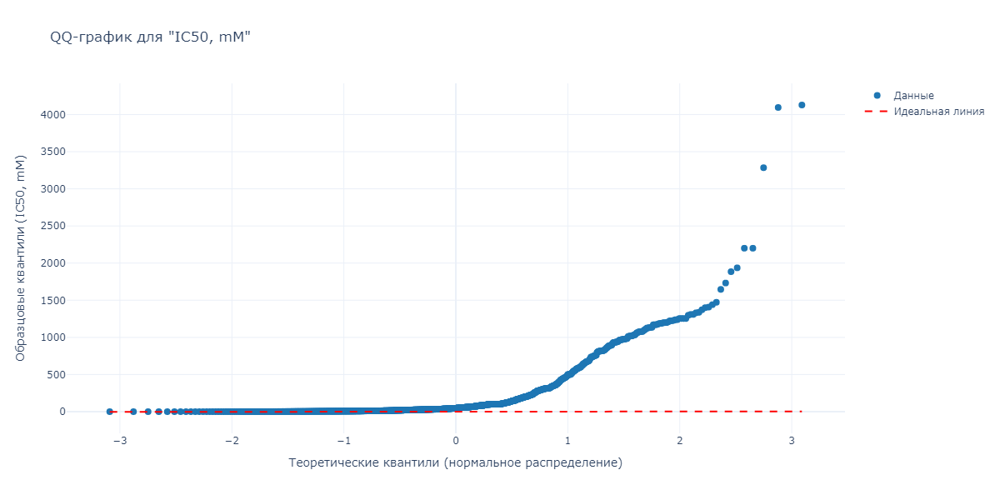



QQ-график для "CC50, mM":
------------------------------------------------------------------------------------------------------------------------------------------------------


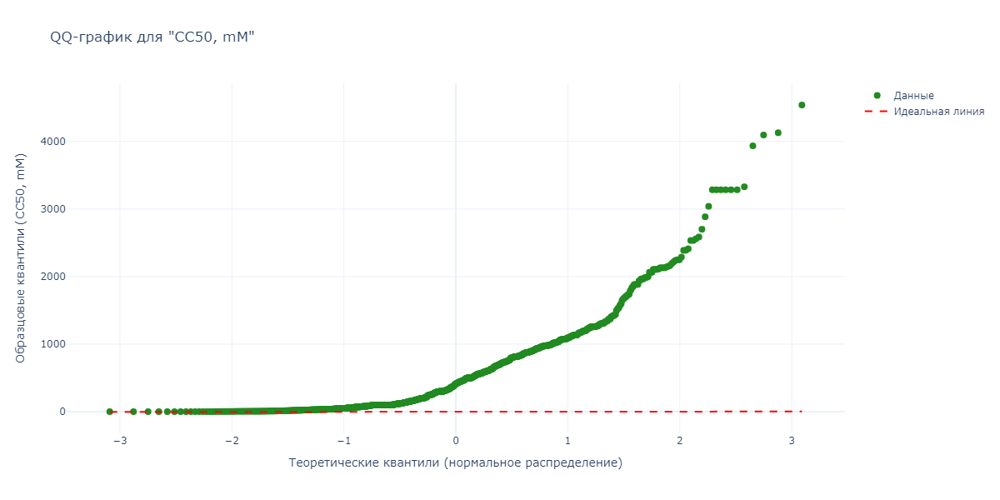



QQ-график для "SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


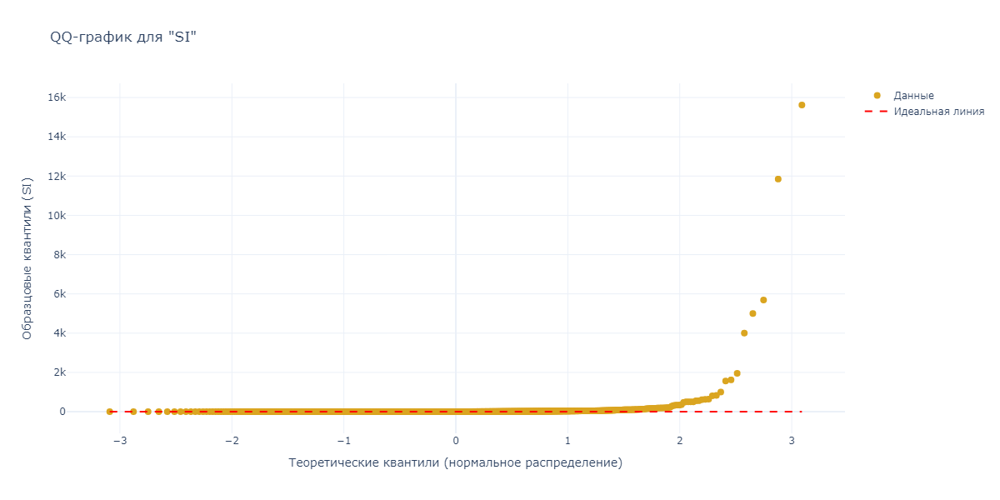

------------------------------------------------------------------------------------------------------------------------------------------------------


In [33]:
# Удаляем NA значения для анализа
ic50_data = molecule_df['IC50, mM'].dropna()
cc50_data = molecule_df['CC50, mM'].dropna()
si_data = molecule_df['SI'].dropna()

# Создаём списоки признаков для визуализации и цветовой палитры
colors = ['#1f77b4', 'forestgreen', 'goldenrod']
qqplot_data = [ic50_data, cc50_data, si_data]



# Создаём график для каждого признака из списка
for element, color in zip(qqplot_data, colors):
    
    print('\n')
    
    # Задаём заглавие для графиков
    print(f'QQ-график для "{element.name}":')
    print('-' * 150)
    
    # Создаем QQ-график с statsmodels (временный график для получения данных)
    fig_temp, ax = plt.subplots()
    qqplot(element, line = 's', ax = ax)
    plt.close() 

    # Извлекаем данные из временного графика
    theoretical_quantiles = ax.lines[0].get_xdata()
    sample_quantiles = ax.lines[0].get_ydata()

    # Создаем интерактивный QQ-график с Plotly
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x = theoretical_quantiles,
        y = sample_quantiles,
        mode = 'markers',
        name = 'Данные',
        marker = dict(color = color, size = 8)
    ))

    # Добавляем линию идеального соответствия (y=x)
    fig.add_trace(go.Scatter(
        x = [min(theoretical_quantiles), max(theoretical_quantiles)],
        y = [min(theoretical_quantiles), max(theoretical_quantiles)],
        mode = 'lines',
        name = 'Идеальная линия',
        line = dict(color = 'red', dash = 'dash')
    ))

    # Настраиваем оформление 
    fig.update_layout(
        title = f'QQ-график для "{element.name}"',
        xaxis_title = 'Теоретические квантили (нормальное распределение)',
        yaxis_title = f'Образцовые квантили ({element.name})',
        template = 'plotly_white',
        height = 600,
        width = 1200,
        showlegend = True
    )

    fig.show('png')
    
print('-' * 150)

**Вывод:**

Распределения `IC50`, `CC50` и `SI` не являются нормальными, с выраженной правосторонней асимметрией и потенциальными выбросами.

#### $3.12$

**Сравнение `IC50, mM` и `CC50, mM` по наличию `fr_amide`.**

Построим коробчатую диаграмму, которая покажет распределение `IC50` и `CC50` для соединений с амидной группой (`fr_amide` > $0$) и без нее:


Коробчатая диаграмма для "IC50" и "CC50" в зависимости от наличия амидной группы:
------------------------------------------------------------------------------------------------------------------------------------------------------


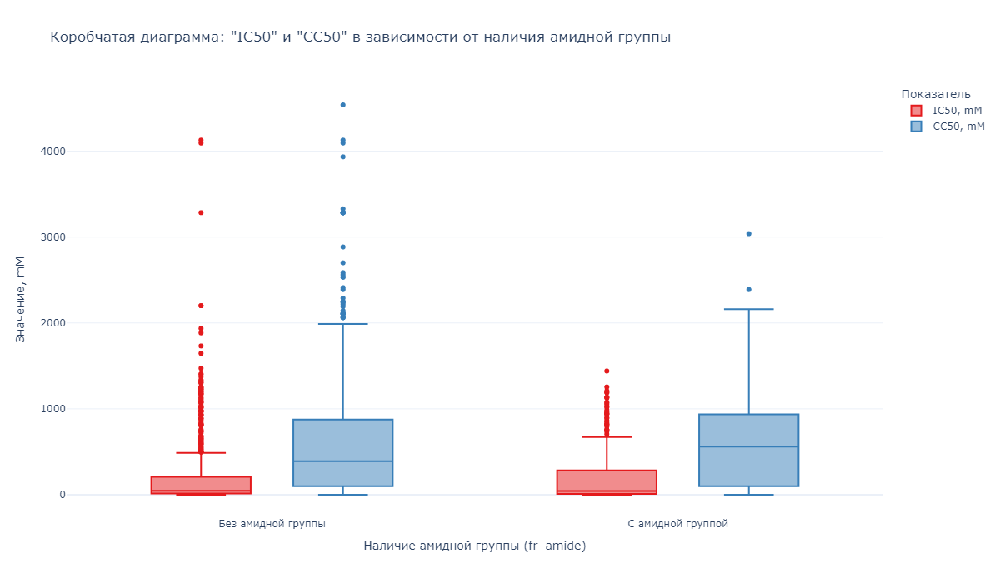

------------------------------------------------------------------------------------------------------------------------------------------------------


In [34]:
# Создаём заглавие для графика
print('\nКоробчатая диаграмма для "IC50" и "CC50" в зависимости от наличия амидной группы:')
print('-' * 150)



# Строим график
fig = px.box(
    molecule_df,
    x = 'fr_amide_presence',
    y = ['IC50, mM', 'CC50, mM'],
    color = 'variable',
    title = 'Распределение IC50 и CC50 по наличию амидной группы',
    
    labels = {
        'value': 'Значение, mM',
        'variable': 'Показатель'
    },
    
    color_discrete_sequence = px.colors.qualitative.Set1
)


# Настраиваем оформление
fig.update_layout(
    height = 700,
    width = 1200,
    title = 'Коробчатая диаграмма: "IC50" и "CC50" в зависимости от наличия амидной группы',
    xaxis_title = 'Наличие амидной группы (fr_amide)',
    yaxis_title = 'Значение, mM',
    boxmode = 'group',
    template = 'plotly_white'
)

# Показываем график
fig.show('png')
print('-' * 150)

**Вывод:**

Амидная группа оказывает заметное влияние на `IC50` и `CC50`, увеличивая их средние значения и вариабельность.

#### $3.13$

**Коробчатая диаграмма для `SI` по дескрипторам.**

Сравним распределение `SI` для соединений с разным количеством `fr_amide`:


Коробчатая диаграмма распределения "SI" по наличию "fr_amide":
------------------------------------------------------------------------------------------------------------------------------------------------------


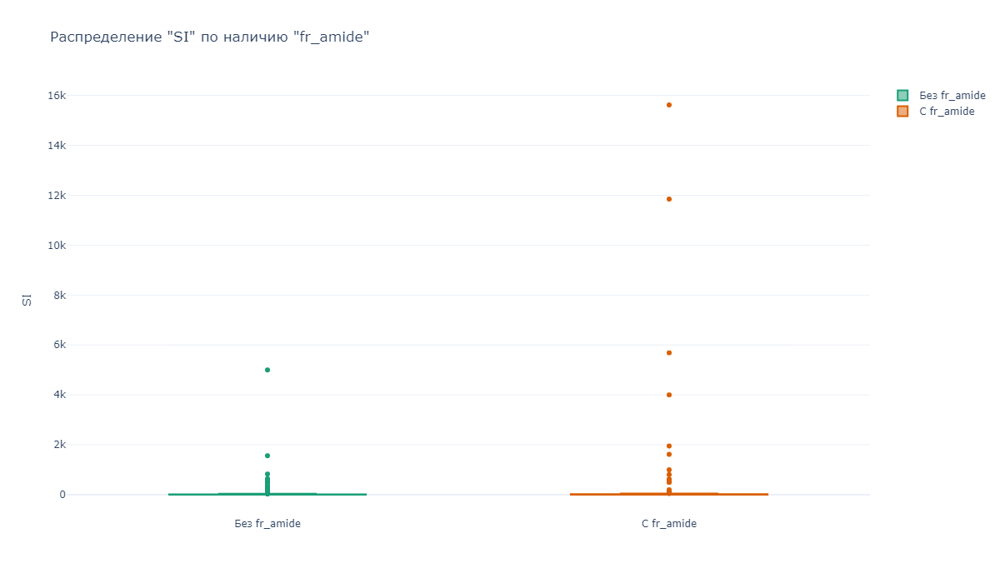

------------------------------------------------------------------------------------------------------------------------------------------------------


In [35]:
# Группируем по количеству fr_amide (0 или >0)
df_amide_group = (molecule_df['fr_amide'] > 0).astype(str)



# Создаём заглавие для графика
print('\nКоробчатая диаграмма распределения "SI" по наличию "fr_amide":')
print('-' * 150)



# Создаём коробчатую диаграмму
fig = go.Figure()

fig.add_trace(go.Box(
    y = molecule_df[df_amide_group == 'False']['SI'],
    name = 'Без fr_amide',
    marker_color = '#1b9e77'
))

fig.add_trace(go.Box(
    y = molecule_df[df_amide_group == 'True']['SI'],
    name = 'С fr_amide',
    marker_color = '#d95f02'
))

fig.update_layout(
    title = 'Распределение "SI" по наличию "fr_amide"',
    yaxis_title = 'SI',
    height = 700,
    width = 1200,
    template = 'plotly_white'
)


# Выводим график
fig.show('png')
print('-' * 150)

**Вывод:**

Амидная группа оказывает ограниченное, но заметное влияние на `SI`, преимущественно увеличивая потенциал селективности у небольшого подмножества молекул.

=============================================================================================================================================

## <CENTER> **`4.` Feature engineering (Создание новых признаков)**

На данном этапе преобразуем некоторые из признаков и создадим новые.

#### $4.1$

**Анализ распределения целевых переменных.**

Для начала проведём анализ распределения целевых переменных. Для этого используем **тест Шапиро-Уилка**:

In [36]:
# Создадим список целевых переменных
target_cols = ['IC50, mM', 'CC50, mM', 'SI']

# Задаём уровень значимости
alpha = 0.05



# Создаём цикл по списку целевых переменных
for target in target_cols:
    
    # Выводим заголовок для текущей переменной
    print()
    print(f'Тестирование нормальности распределения для "{target}":')
    print()
    
    # Выполняем тест Шапиро-Уилка
    stat, p_value = stats.shapiro(molecule_df[target].dropna())
    
    # Выводим результаты теста
    print(f'Статистика: {stat:.4f}, p-значение: {p_value:.4f}')
    
    # Проверяем гипотезу
    if p_value > alpha:
        print(f'Распределение признака "{target}" нормально (не отвергаем гипотезу H0)')
    else:
        print(f'Распределение признака "{target}" не нормально (отвергаем гипотезу H0)')
    
    print('-' * 70)
    print('\n') 


Тестирование нормальности распределения для "IC50, mM":

Статистика: 0.5811, p-значение: 0.0000
Распределение признака "IC50, mM" не нормально (отвергаем гипотезу H0)
----------------------------------------------------------------------



Тестирование нормальности распределения для "CC50, mM":

Статистика: 0.8067, p-значение: 0.0000
Распределение признака "CC50, mM" не нормально (отвергаем гипотезу H0)
----------------------------------------------------------------------



Тестирование нормальности распределения для "SI":

Статистика: 0.0700, p-значение: 0.0000
Распределение признака "SI" не нормально (отвергаем гипотезу H0)
----------------------------------------------------------------------




Результаты тестов показывают, что ни один из признаков не имеет нормальное распределение. Чтобы убедитьсяв этом, построим столбчатые гистограммы распределения каждого признака.

Создадим функцию для визуализации распределения целевых переменных:

In [37]:
# Создаём функцию 'features_distribution_hist' для построения распределения признаков
def features_distribution_hist(data, column, count_str, count_col, col_num, color):
    
    # Вычисляем значения выбросов
    outliers = len(data[(data[column] < data[column].quantile(0.25) - 1.5*(data[column].quantile(0.75) - data[column].quantile(0.25))) | (data[column] > data[column].quantile(0.75) + 1.5*(data[column].quantile(0.75) - data[column].quantile(0.25)))][column])
    
    # Создаём количество графиков
    plt.subplot(count_str, count_col, col_num)
    
    # Строим графики распределения
    sns.histplot(
        data = data[column],
        kde = True,
        bins = 30,
        color = color,
        edgecolor = 'black',
        alpha = 0.7,
        linewidth = 0.5
    )
    
    # Задаём параметры графика
    plt.title(f'Распределение {column} (выбросов: {outliers})', fontsize = 20)
    plt.xlabel(f'{column}', fontsize = 15)
    plt.ylabel('Частота', fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()
    
    # Выводим график
    plt.show

Обернём созданную функцию ещё в одну, чтобы сделать код графика более компактным:

In [38]:
# Создаём функцию 'target_distribution_hist'           
def target_distribution_hist(data, target_cols, colors_list, col_num_list, title, figsize):
    
    # Задаём заглавие для графика
    print(title)
    print('-' * 150)




    # Задаём размер графика
    plt.figure(figsize = figsize)

    # Создаём цикл по строкам, столбцам и номеру графика
    for target, colors, num in zip(target_cols, colors_list, col_num_list):
    
        # Применяем функцию для построения графика
        features_distribution_hist(
            data = data,
            column = target,
            count_str = 1,
            count_col = 3, 
            col_num = num,
            color = colors
        )

Построим графики распределения целевых переменных:

Распределение целевых переменных с учетом выбросов:
------------------------------------------------------------------------------------------------------------------------------------------------------


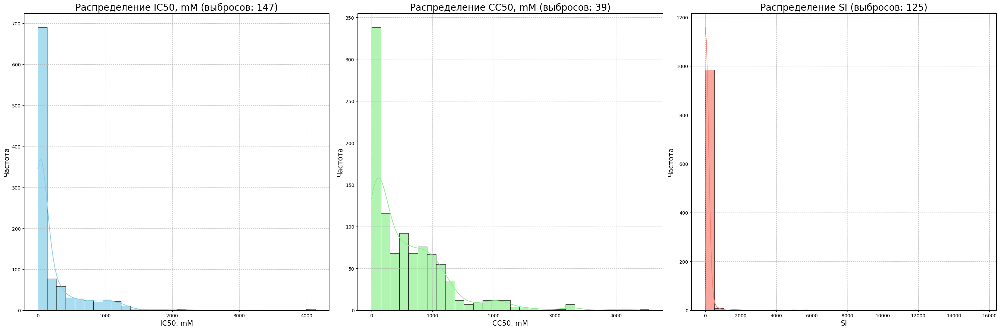

In [39]:
# Применяем функцию 'target_distribution_hist'
target_distribution_hist(
    data = molecule_df,
    target_cols = ['IC50, mM', 'CC50, mM', 'SI'],
    colors_list = ['skyblue', 'lightgreen', 'salmon'],
    col_num_list = [1, 2, 3],
    title = 'Распределение целевых переменных с учетом выбросов:',
    figsize = (30, 10)
)

Графики подтверждают результаты тестов о ненормальности распределения. Так же по графику видно, что в каждом целевом признаке присутствуют выбросы, причём самое большое количество содержит столбец `IC50, mM` в количестве $147$.

Прологорифмируем целевые переменные для нормализации их распределения, также построим график распределения (при этом сохраним стандартные признаки):

Распределение целевых переменных после логорифмирования:
------------------------------------------------------------------------------------------------------------------------------------------------------


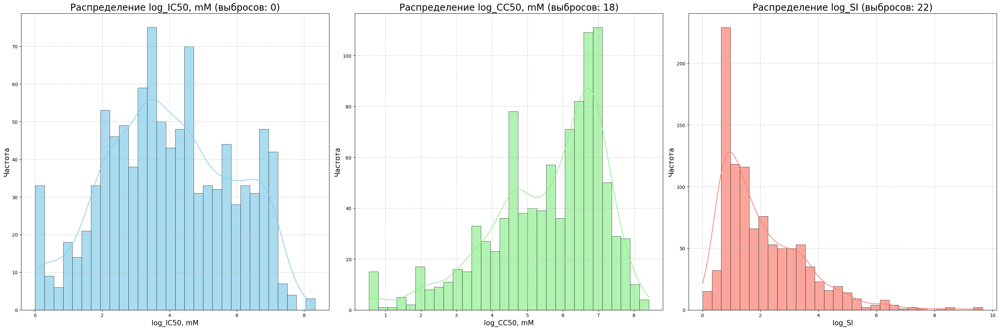

In [40]:
# Логарифмирование целевых переменных
molecule_df['log_IC50, mM'] = np.log1p(molecule_df['IC50, mM'])
molecule_df['log_CC50, mM'] = np.log1p(molecule_df['CC50, mM'])
molecule_df['log_SI'] = np.log1p(molecule_df['SI'])



# Применяем функцию 'target_distribution_hist'
target_distribution_hist(
    data = molecule_df,
    target_cols = ['log_IC50, mM', 'log_CC50, mM', 'log_SI'],
    colors_list = ['skyblue', 'lightgreen', 'salmon'],
    col_num_list = [1, 2, 3],
    title = 'Распределение целевых переменных после логорифмирования:',
    figsize = (30, 10)
)

Логарифмирование полностью исправило только признак `IC50, mM`, при этом выбросы сохранились в переменных `CC50, mM` ($18$ выбросов) и `SI` ($22$ выброса). 

Вычислим значения скошенности и эксцесса:

In [41]:
# Вычисление скошенности 
print('Значения скошенности (skewness):\n')
print('{}: {:.3f}'.format('log_IC50, mM', stats.skew(molecule_df['log_IC50, mM'].dropna())))
print('{}: {:.3f}'.format('log_CC50, mM', stats.skew(molecule_df['log_CC50, mM'].dropna())))
print('{}: {:.3f}'.format('log_SI', stats.skew(molecule_df['log_SI'].dropna())))
print('-' * 25)
print('\n')


# Вычисление эксцесса
print('Значения эксцесса (kurtosis):\n')
print('{}: {:.3f}'.format('log_IC50, mM', stats.kurtosis(molecule_df['log_IC50, mM'].dropna())))
print('{}: {:.3f}'.format('log_CC50, mM', stats.kurtosis(molecule_df['log_CC50, mM'].dropna())))
print('{}: {:.3f}'.format('log_SI', stats.kurtosis(molecule_df['log_SI'].dropna())))
print('-' * 25)

Значения скошенности (skewness):

log_IC50, mM: -0.029
log_CC50, mM: -0.906
log_SI: 1.430
-------------------------


Значения эксцесса (kurtosis):

log_IC50, mM: -0.731
log_CC50, mM: 0.426
log_SI: 2.656
-------------------------


Значения признака `log_IC50` находятся в допустимых пределах, при этом график `log_CC50` демонстрирует левостороннюю скошенность, а `log_SI` - правостороннюю. Обрежим оставшиеся выбросы с помощью межквартильного размаха.

Произведём обработку выбросов:

Распределение целевых переменных после логорифмирования:
------------------------------------------------------------------------------------------------------------------------------------------------------


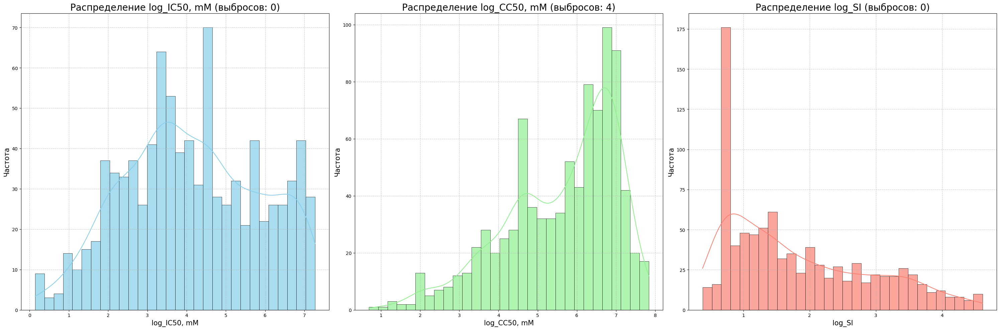

In [42]:
# Обрезаем выбросы в признаке 'log_IC50, mM'
q_low_ic50 = molecule_df['log_IC50, mM'].quantile(0.01)
q_high_ic50 = molecule_df['log_IC50, mM'].quantile(0.99)
molecule_df = molecule_df[(molecule_df['log_IC50, mM'] >= q_low_ic50) & (molecule_df['log_IC50, mM'] <= q_high_ic50)]

# Обрезаем выбросы в признаке 'log_CC50, mM'
q_low_cc50 = molecule_df['log_CC50, mM'].quantile(0.01)
q_high_cc50 = molecule_df['log_CC50, mM'].quantile(0.99)
molecule_df = molecule_df[(molecule_df['log_CC50, mM'] >= q_low_cc50) & (molecule_df['log_CC50, mM'] <= q_high_cc50)]

# Обрезаем выбросы в признаке 'log_SI'
q_low_si = molecule_df['log_SI'].quantile(0.01)
q_high_si = molecule_df['log_SI'].quantile(0.95) 
molecule_df = molecule_df[(molecule_df['log_SI'] >= q_low_si) & (molecule_df['log_SI'] <= q_high_si)]



# Применяем функцию 'target_distribution_hist'
target_distribution_hist(
    data = molecule_df,
    target_cols = ['log_IC50, mM', 'log_CC50, mM', 'log_SI'],
    colors_list = ['skyblue', 'lightgreen', 'salmon'],
    col_num_list = [1, 2, 3],
    title = 'Распределение целевых переменных после логорифмирования:',
    figsize = (30, 10)
)

Количество выбросов сократилось, но при этом скошенности сохранились, возможно это связано с химическими особенностями веществ `CC50` и `SI`.

#### $4.2$

**Комбинации молекулярных свойств.**

Реализуем класс, который создаст признаки, описывающие взаимодействия таких характеристик, как масса, размер и полярность:

In [43]:
# Создаём класс 'MolecularProperties' для описания различных характеристик
class MolecularProperties(base.BaseEstimator, base.TransformerMixin):
    
    # Задаём необходимые параметры
    def __init__(self):
        pass
    
    # Обучаем трансформер на данных
    def fit(self, X, y = None):
        return self
    
    
    # Преобразовываем данные
    def transform(self, X):
        
        X_transformed = X.copy()                                                                                    # создаём копию данных
        new_features = pd.DataFrame(index = X.index)                                                                # создаем DataFrame только с новыми признаками
        new_features['MolWt_TPSA'] = X_transformed['MolWt'] * X_transformed['TPSA']                                 # произведение молекулярной массы и полярной площади поверхности
        new_features['MolWt_per_Heteroatoms'] = X_transformed['MolWt'] / (X_transformed['NumHeteroatoms'] + 1e-5)   # соотношение молекулярной массы к числу гетероатомов
        new_features['TPSA_per_MolLogP'] = X_transformed['TPSA'] / (X_transformed['MolLogP'] + 1e-10)               # соотношение полярной площади к гидрофобности
        
        # Выведем информацию по созданным признакам
        check_data_inf(
            data = new_features,
            data_name = 'Molecular properties features',
            length1 = 40,
            length2 = 60
        )
        
        print('\n\n\n')
        
        
        return new_features
    
    
    # Преобразовываем данные
    def fit_transform(self, X, y = None):
        return self.fit(X, y).transform(X)

#### $4.3$

**Комбинации функциональных групп (fr_*).**

Реализуем класс, который создаст признаки на основе групп `fr_*` для выявления химическия взаимодействий:

In [44]:
# Создаём класс 'FunctionalGroups'
class FunctionalGroups(base.BaseEstimator, base.TransformerMixin):
    
    # Задаём необходимые параметры
    def __init__(self):
        pass
    
    # Обучаем трансформер на данных
    def fit(self, X, y = None):
        return self
    
    
    # Преобразовываем данные
    def transform(self, X):
        
        X_transformed = X.copy()                                                                                   # создаём копию данных
        functional_groups = [col for col in X_transformed.columns if col.startswith('fr_')]                        # создаём список функциональных групп
        
        # Обработка столбцов *_presence
        presence_cols = [col for col in functional_groups if col.endswith('_presence')]
        for col in presence_cols:
            X_transformed[col] = X_transformed[col].map({
                'Без группы': 0, 'С группой': 1,
                'Без амидной группы': 0, 'С амидной группой': 1,
                1: 1, 0: 0
            }).fillna(0).astype(int)
            
        new_features = pd.DataFrame(index = X.index)                                                              # создаем DataFrame только с новыми признаками
        new_features['total_functional_groups'] = X_transformed[functional_groups].sum(axis = 1)                  # общая мера "сложности" молекулы
        new_features['fr_amide_plus_ester'] = X_transformed['fr_amide'] + X_transformed['fr_ester']               # cумма амидных и эфирных групп
        new_features['fr_benzene_times_nitro'] = X_transformed['fr_benzene'] * X_transformed['fr_nitro']          # произведение числа бензольных колец и нитрогрупп
        new_features['fr_Al_OH_per_benzene'] = X_transformed['fr_Al_OH'] / (X_transformed['fr_benzene'] + 1e-10)  # соотношение алифатических гидроксильных групп к бензольным кольцам
        
        # Добавляем преобразованные столбцы presence_cols в new_features
        for col in presence_cols:
            new_features[col] = X_transformed[col]
        
        # Выведем информацию по созданным признакам
        check_data_inf(
            data = new_features,
            data_name = 'Functional groups features',
            length1 = 40,
            length2 = 90
        )
        
        print('\n\n\n')
        
        return new_features
    
    
    # Преобразовываем данные
    def fit_transform(self, X, y = None):
        return self.fit(X, y).transform(X)

#### $4.4$

**Комбинации топологических и поверхностных дескрипторов.**

Создадим комбинации следующих дескрипторов: `PEOE_VSA*`,` SMR_VSA*` и `Chi0`:

In [45]:
# Создаём класс 'TopologicalDescriptors'
class TopologicalDescriptors(base.BaseEstimator, base.TransformerMixin):
    
    # Задаём необходимые параметры
    def __init__(self):
        pass

    # Обучаем трансформер на данных
    def fit(self, X, y = None):
        return self


    # Преобразовываем данные
    def transform(self, X):
        
        X_transformed = X.copy()                                                                                                             # создаём копию данных
        new_features = pd.DataFrame(index = X.index)                                                                                         # создаем DataFrame только с новыми признаками
        new_features['PEOE_VSA_total'] = X_transformed[[col for col in X_transformed.columns if col.startswith('PEOE_VSA')]].sum(axis = 1)   # сумма всех PEOE_VSA* (общая мера заряженной поверхности)
        new_features['SMR_VSA_ratio'] = X_transformed['SMR_VSA1'] / (X_transformed['SMR_VSA9'] + 1e-10)                                      # cоотношение двух поверхностных дескрипторов                        
        new_features['Chi0_times_Kappa1'] = X_transformed['Chi0'] * X_transformed['Kappa1']                                                  # произведение индекса связности и индекса формы                                         
        new_features['TPSA_times_FractionCSP3'] = X_transformed['TPSA'] * X_transformed['FractionCSP3']                                      # произведение полярной площади и доли sp³-углеродов
        
        # Выведем информацию по созданным признакам
        check_data_inf(
            data = new_features,
            data_name = 'Topological descriptors features',
            length1 = 40,
            length2 = 80
        )
        
        print('\n\n\n')
        
        return new_features


    # Преобразовываем данные
    def fit_transform(self, X, y = None):
        return self.fit(X, y).transform(X)

#### $4.5$

**Логарифмические и полиномиальные трансформации.**

Трансформируем дескрипторы с выбросами и широким диапазоном:

In [46]:
# Создаём класс 'Transformations'
class Transformations(base.BaseEstimator, base.TransformerMixin):
    
    # Задаём необходимые параметры
    def __init__(self):
        pass

    # Обучаем трансформер на данных 
    def fit(self, X, y = None):
        return self


    # Преобразовываем данные
    def transform(self, X):
        
        X_transformed = X.copy()                                                               # создаём копию данных
        new_features = pd.DataFrame(index = X.index)                                           # создаем DataFrame только с новыми признаками
        new_features['log_MolWt'] = np.log1p(X_transformed['MolWt'])                           # логарифм молекулярной массы
        new_features['MolLogP_squared'] = X_transformed['MolLogP'] ** 2                        # квадрат гидрофобности
        new_features['NumRotatableBonds_squared'] = X_transformed['NumRotatableBonds'] ** 2    # квадрат числа вращаемых связей
        
        # Выведем информацию по созданным признакам
        check_data_inf(
            data = new_features,
            data_name = 'Transformations features',
            length1 = 40,
            length2 = 70
        )
        
        print('\n\n\n')
        
        return new_features


    # Преобразовываем данные
    def fit_transform(self, X, y = None):
        return self.fit(X, y).transform(X)

#### $4.6$

Комбинируем созданные трансформеры с помощью `FeatureUnion` и добавим его в `Pipeline`:

In [47]:
# Создаем 'FeatureUnion' с созданными трансформерами
feature_union = pipeline.FeatureUnion(
    [
        ('molecular_properties', MolecularProperties()),
        ('functional_groups', FunctionalGroups()),
        ('topological_descriptors', TopologicalDescriptors()),
        ('transformations', Transformations())
    ]
)



# Создаём Добавляем 'preprocessing_pipeline' 
# и добавляем в него 'FeatureUnion' 
preprocessing_pipeline = pipeline.Pipeline(
    [
        ('feature_union', feature_union)
    ]
)

#### $4.7$

**Разделяем данные.**

Разделим данные на матрицу наблюдений `X` и вектор правильных ответов `y` для того, чтобы на этих данных провести корреляционный анализ созданных признаков: 

In [48]:
# Разделяем данные на матрицу наблюдений 'X' и вектор правильных ответов 'y'     
X = molecule_df.drop(columns = ['IC50, mM', 'CC50, mM', 'SI', 'log_IC50, mM', 'log_CC50, mM', 'log_SI'])
y = molecule_df[['log_IC50, mM', 'log_CC50, mM', 'log_SI']]


# Выведем информацию по 'X'
check_data_inf(
    data = X,
    data_name = 'X',
    length1 = 40, 
    length2 = 150
)

Данные таблицы "X" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 216.
----------------------------------------


,Unnamed: 0,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,SI_category,fr_amide_presence,fr_aldehyde_presence,fr_aniline_presence,fr_amidine_presence
0,0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,...,0,0,0,3,0,экстремально высокий,Без амидной группы,Без группы,Без группы,Без группы
1,1,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,...,0,0,0,3,0,экстремально высокий,Без амидной группы,Без группы,Без группы,Без группы
2,2,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,...,0,0,0,3,0,низкий,Без амидной группы,Без группы,Без группы,Без группы
3,3,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,...,0,0,0,4,0,экстремально высокий,Без амидной группы,Без группы,Без группы,Без группы
4,4,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,...,0,0,0,0,0,умеренный,Без амидной группы,Без группы,Без группы,Без группы
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,996,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,414.542,380.270,414.240624,...,0,0,0,0,0,умеренный,Без амидной группы,Без группы,Без группы,Без группы
997,997,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,485.621,446.309,485.277738,...,0,0,0,0,0,умеренный,С амидной группой,Без группы,Без группы,Без группы
998,998,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,545.742,502.398,545.281109,...,0,0,0,0,0,умеренный,С амидной группой,Без группы,Без группы,Без группы
999,999,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,522.635,480.299,522.282883,...,0,0,0,0,0,умеренный,Без амидной группы,Без группы,Без группы,Без группы


------------------------------------------------------------------------------------------------------------------------------------------------------


#### $4.8$

Создаём новые признаки при помощи созданного `Pipeline`:

In [49]:
# Применяем pipeline к данным
X_transformed = preprocessing_pipeline.fit_transform(X)


# Создадим массив в названиями созданных столбцов
feature_names = (
    ['MolWt_TPSA', 'MolWt_per_Heteroatoms', 'TPSA_per_MolLogP'] +
    
    ['total_functional_groups', 'fr_amide_plus_ester', 'fr_benzene_times_nitro', 
     'fr_Al_OH_per_benzene', 'fr_amide_presence', 'fr_aldehyde_presence', 
     'fr_aniline_presence', 'fr_amidine_presence'] +
    
    ['PEOE_VSA_total', 'SMR_VSA_ratio', 'Chi0_times_Kappa1', 'TPSA_times_FractionCSP3'] +
    ['log_MolWt', 'MolLogP_squared', 'NumRotatableBonds_squared']
)


# Преобразуем результат обратно в DataFrame
X_transformed_df = pd.DataFrame(
    X_transformed,
    columns = feature_names,
    index = X.index
)


# Создаём DataFrame только с новыми признаками для анализа корреляции с целевыми переменными
df_transformed = pd.concat(
    [X_transformed_df, y],
    axis = 1
)


# Создаём полный DataFrame без целевых переменных для преобразований
df_transformed_full = pd.concat(
    [X, X_transformed_df],
    axis = 1
)

# Удалим созданный столбец 'Unnnamed: 0'
df_transformed_full.drop(
    columns = ['Unnamed: 0'],
    axis = 1,
    inplace = True
)

# Удалим категориальные признаки
df_transformed_full.drop(
    columns = df_transformed_full.select_dtypes(include = ['object', 'category']).columns,
    axis = 1,
    inplace = True
)

Данные таблицы "Molecular properties features" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 3.
----------------------------------------


,MolWt_TPSA,MolWt_per_Heteroatoms,TPSA_per_MolLogP
0,9508.59744,192.325038,3.471325
1,9351.73704,194.341028,3.908636
2,0.00000,223.402883,0.000000
3,9855.34488,199.338503,3.291041
4,11537.14536,233.355333,2.712073
...,...,...,...
996,28881.14114,82.908234,16.201572
997,47964.78617,69.374329,25.958632
998,53902.93734,68.217665,21.764615
999,63902.58145,58.070491,36.336890


------------------------------------------------------------




Данные таблицы "Functional groups features" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 8.
----------------------------------------


,total_functional_groups,fr_amide_plus_ester,fr_benzene_times_nitro,fr_Al_OH_per_benzene,fr_amide_presence,fr_aldehyde_presence,fr_aniline_presence,fr_amidine_presence
0,11,0,0,0.0,0,0,0,0
1,9,0,0,0.0,0,0,0,0
2,11,0,0,0.0,0,0,0,0
3,12,0,0,0.0,0,0,0,0
4,10,0,0,0.0,0,0,0,0
...,...,...,...,...,...,...,...,...
996,17,3,0,0.0,0,0,0,0
997,22,4,0,0.0,1,0,0,0
998,23,4,0,0.0,1,0,0,0
999,27,4,0,0.0,0,0,0,0


------------------------------------------------------------------------------------------




Данные таблицы "Topological descriptors features" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 4.
----------------------------------------


,PEOE_VSA_total,SMR_VSA_ratio,Chi0_times_Kappa1,TPSA_times_FractionCSP3
0,173.744106,0.000000e+00,416.429500,22.818462
1,175.053185,0.000000e+00,427.690047,24.060000
2,201.576358,8.966062e+10,595.488387,0.000000
3,180.164927,0.000000e+00,451.104930,22.888889
4,212.424740,0.000000e+00,571.513888,14.232727
...,...,...,...,...
996,178.496462,2.385734e+11,438.455485,55.736000
997,207.480545,2.865187e+11,625.027498,77.605000
998,230.748137,2.865187e+11,765.812684,79.016000
999,218.992080,4.292014e+11,812.837308,100.436071


--------------------------------------------------------------------------------




Данные таблицы "Transformations features" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 3.
----------------------------------------


,log_MolWt,MolLogP_squared,NumRotatableBonds_squared
0,5.954935,50.711489,49
1,5.965336,37.891411,81
2,6.104365,50.825493,81
3,5.990662,56.419628,64
4,6.147855,83.079579,16
...,...,...,...
996,6.029584,18.491720,4
997,6.187486,14.477264,16
998,6.303977,20.594352,49
999,6.260795,11.322552,36


----------------------------------------------------------------------






Выведем информацию по созданному `DataFrame`:

In [50]:
# Выведем информацию по 'df_transformed'       
check_data_inf(
    data = df_transformed,
    data_name = 'df_transformed',
    length1 = 40,
    length2 = 150
)

print('\n\n\n')


# Выведем информацию по 'df_transformed_full'
check_data_inf(
    data = df_transformed_full,
    data_name = 'df_transformed_full',
    length1 = 40,
    length2 = 150
)    

Данные таблицы "df_transformed" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 21.
----------------------------------------


,MolWt_TPSA,MolWt_per_Heteroatoms,TPSA_per_MolLogP,total_functional_groups,fr_amide_plus_ester,fr_benzene_times_nitro,fr_Al_OH_per_benzene,fr_amide_presence,fr_aldehyde_presence,fr_aniline_presence,...,PEOE_VSA_total,SMR_VSA_ratio,Chi0_times_Kappa1,TPSA_times_FractionCSP3,log_MolWt,MolLogP_squared,NumRotatableBonds_squared,"log_IC50, mM","log_CC50, mM",log_SI
0,9508.59744,192.325038,3.471325,11.0,0.0,0.0,0.0,0.0,0.0,0.0,...,173.744106,0.000000e+00,416.429500,22.818462,5.954935,50.711489,49.0,1.979535,5.173221,3.371597
1,9351.73704,194.341028,3.908636,9.0,0.0,0.0,0.0,0.0,0.0,0.0,...,175.053185,0.000000e+00,427.690047,24.060000,5.965336,37.891411,81.0,0.572014,1.856738,2.079442
2,0.00000,223.402883,0.000000,11.0,0.0,0.0,0.0,0.0,0.0,0.0,...,201.576358,8.966062e+10,595.488387,0.000000,6.104365,50.825493,81.0,5.415250,5.088474,0.542324
3,9855.34488,199.338503,3.291041,12.0,0.0,0.0,0.0,0.0,0.0,0.0,...,180.164927,0.000000e+00,451.104930,22.888889,5.990662,56.419628,64.0,0.995333,4.690023,4.162553
4,11537.14536,233.355333,2.712073,10.0,0.0,0.0,0.0,0.0,0.0,0.0,...,212.424740,0.000000e+00,571.513888,14.232727,6.147855,83.079579,16.0,4.683348,4.943576,0.832909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,28881.14114,82.908234,16.201572,17.0,3.0,0.0,0.0,0.0,0.0,0.0,...,178.496462,2.385734e+11,438.455485,55.736000,6.029584,18.491720,4.0,3.465739,3.583509,0.755660
997,47964.78617,69.374329,25.958632,22.0,4.0,0.0,0.0,1.0,0.0,0.0,...,207.480545,2.865187e+11,625.027498,77.605000,6.187486,14.477264,16.0,3.496506,3.555331,0.723911
998,53902.93734,68.217665,21.764615,23.0,4.0,0.0,0.0,1.0,0.0,0.0,...,230.748137,2.865187e+11,765.812684,79.016000,6.303977,20.594352,49.0,3.465732,3.555333,0.740394
999,63902.58145,58.070491,36.336890,27.0,4.0,0.0,0.0,0.0,0.0,0.0,...,218.992080,4.292014e+11,812.837308,100.436071,6.260795,11.322552,36.0,3.496476,3.526350,0.708662


------------------------------------------------------------------------------------------------------------------------------------------------------




Данные таблицы "df_transformed_full" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 224.
----------------------------------------


,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_amide_plus_ester,fr_benzene_times_nitro,fr_Al_OH_per_benzene,PEOE_VSA_total,SMR_VSA_ratio,Chi0_times_Kappa1,TPSA_times_FractionCSP3,log_MolWt,MolLogP_squared,NumRotatableBonds_squared
0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,158,...,0.0,0.0,0.0,173.744106,0.000000e+00,416.429500,22.818462,5.954935,50.711489,49.0
1,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,162,...,0.0,0.0,0.0,175.053185,0.000000e+00,427.690047,24.060000,5.965336,37.891411,81.0
2,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,186,...,0.0,0.0,0.0,201.576358,8.966062e+10,595.488387,0.000000,6.104365,50.825493,81.0
3,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,164,...,0.0,0.0,0.0,180.164927,0.000000e+00,451.104930,22.888889,5.990662,56.419628,64.0
4,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,184,...,0.0,0.0,0.0,212.424740,0.000000e+00,571.513888,14.232727,6.147855,83.079579,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,12.934891,12.934891,0.048029,-0.476142,0.382752,49.133333,414.542,380.270,414.240624,164,...,3.0,0.0,0.0,178.496462,2.385734e+11,438.455485,55.736000,6.029584,18.491720,4.0
997,13.635345,13.635345,0.030329,-0.699355,0.369425,44.542857,485.621,446.309,485.277738,192,...,4.0,0.0,0.0,207.480545,2.865187e+11,625.027498,77.605000,6.187486,14.477264,16.0
998,13.991690,13.991690,0.026535,-0.650790,0.284923,41.973684,545.742,502.398,545.281109,210,...,4.0,0.0,0.0,230.748137,2.865187e+11,765.812684,79.016000,6.303977,20.594352,49.0
999,13.830180,13.830180,0.146522,-1.408652,0.381559,39.000000,522.635,480.299,522.282883,208,...,4.0,0.0,0.0,218.992080,4.292014e+11,812.837308,100.436071,6.260795,11.322552,36.0


------------------------------------------------------------------------------------------------------------------------------------------------------


=============================================================================================================================================

## <CENTER> **`5.` Отбор признаков**

На данном этапе проведём корреляционный анализмежду признаками, по необходимости избавимся от мультиколлинеарности, проведём нормализацию и отберём только самые информативные признаки для дальнейшего исследования.

#### $5.1$

**Анализ связи признаков с целевой переменной.**

Воспользуемся методом `mutual_info_regression` для оценки нелинейных зависимостей между признаками и целевой переменной:

In [60]:
# Вычисление взаимной информации
mir_scores = feature_selection.mutual_info_regression(df_transformed_full, y['log_SI'], random_state = 42)

# Сортировка и создание Series для удобного отображения
mir_scores = pd.Series(
    mir_scores, 
    index = df_transformed_full.columns
).sort_values(ascending = False)

# Вывод результатов
print('\nВзаимная информация с "log_SI":\n')
mir_scores.head(20).to_frame('Mutual Information').style.format('{:.4f}').background_gradient(cmap = 'YlGnBu').set_properties(**{'font-size': '16px'})


Взаимная информация с "log_SI":



,Mutual Information
BCUT2D_LOGPHI,0.2504
MaxAbsPartialCharge,0.2141
BCUT2D_CHGLO,0.2056
SMR_VSA4,0.2017
BCUT2D_MWLOW,0.2016
BCUT2D_LOGPLOW,0.2008
MaxPartialCharge,0.1917
BCUT2D_MRLOW,0.1832
AvgIpc,0.1831
SlogP_VSA5,0.1750


Построим визуализации:


Топ-20 признаков с наибольшей взаимной информацией с "log_SI":
------------------------------------------------------------




Тепловая карта корреляции признаков с наибольшей взаимной информацией с "log_SI":
------------------------------------------------------------------------------------------------------------------------------------------------------


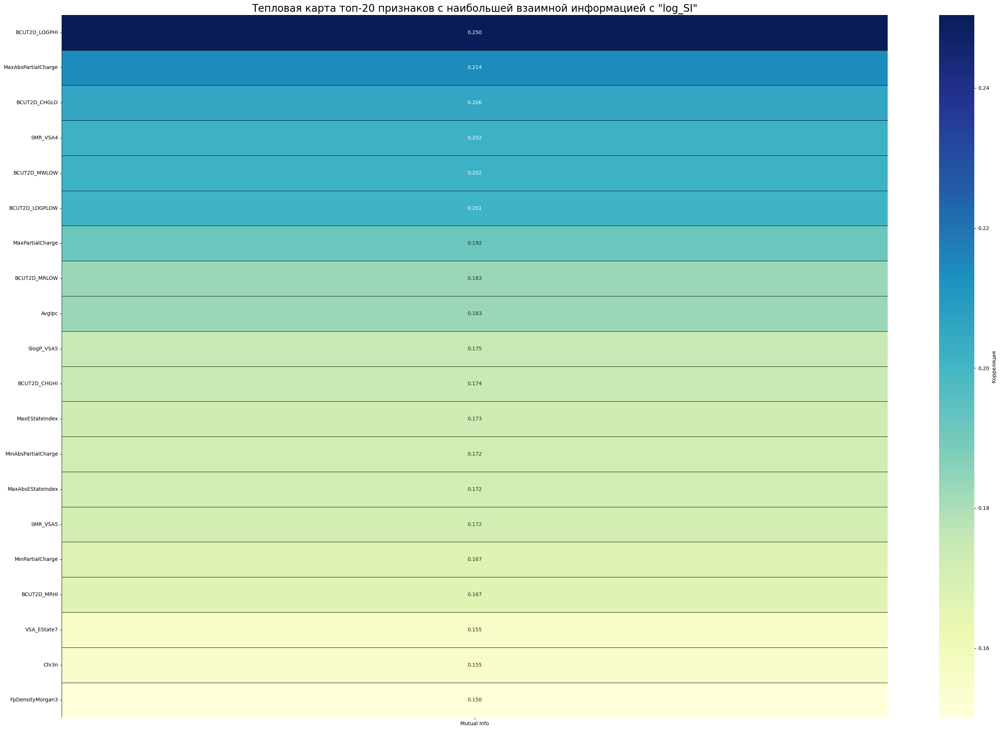

------------------------------------------------------------------------------------------------------------------------------------------------------


Сравнение важности признаков: Barplot vs Treemap
------------------------------------------------------------------------------------------------------------------------------------------------------


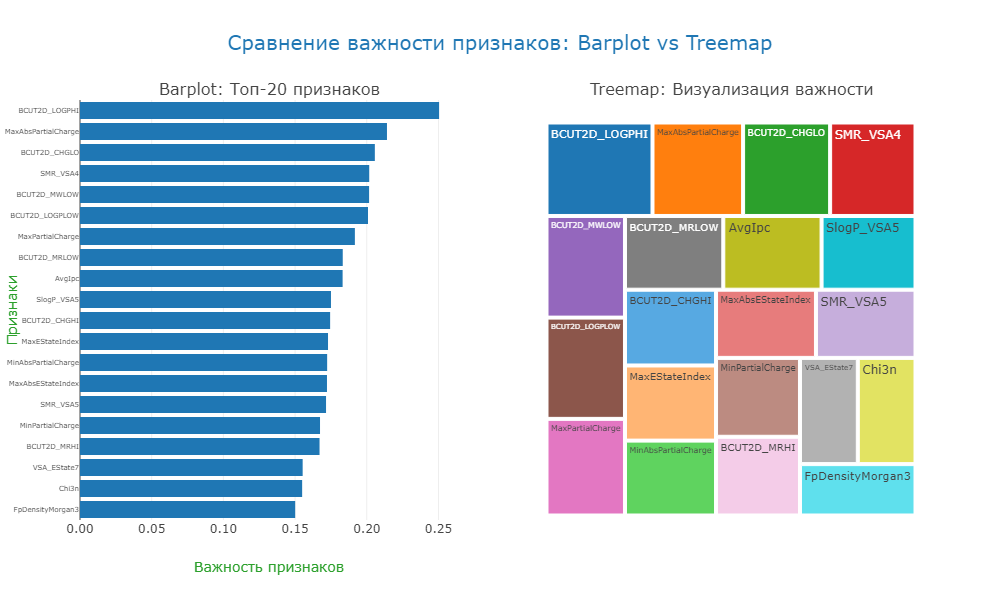

------------------------------------------------------------------------------------------------------------------------------------------------------


In [ ]:
# Выделяем топ-20 признаков с наибольшей взаимной информацией
top_20 = mir_scores.head(20)
print('\nТоп-20 признаков с наибольшей взаимной информацией с "log_SI":')
print('-' * 60)
print('\n\n')




# Создаём заглавие для графика
print('\nТепловая карта корреляции признаков с наибольшей взаимной информацией с "log_SI":')
print('-' * 150)



# Задаём размер графика
plt.figure(figsize = (30, 20))

# Строим тепловую карту корреляции признаков с наибольшей взаимной информацией с 'log_SI'
sns.heatmap(
    top_20.values.reshape(-1, 1),
    annot = True,
    fmt = '.3f',
    cmap = 'YlGnBu',
    linewidths = 0.5,
    linecolor = 'black',
    yticklabels = top_20.index,
    xticklabels = ['Mutual Info'],
    cbar = True,
    cbar_kws = {'label': 'Корреляция'}
)

# Настраиваем оформление графика
plt.title('Тепловая карта топ-20 признаков с наибольшей взаимной информацией с "log_SI"', fontsize = 20)
plt.tight_layout()
plt.show()
print('-' * 150)
print()








# Создаём заглавие для графика
print('\nСравнение важности признаков: Barplot vs Treemap')
print('-' * 150)



# Создание подграфиков
fig = subplots.make_subplots(
    rows = 1, cols = 2,
    column_widths = [0.5, 0.5],
    subplot_titles = ('Barplot: Топ-20 признаков', 'Treemap: Визуализация важности'),
    specs = [[{'type': 'bar'}, {'type': 'treemap'}]]
)

# Строим Barplot (по убыванию)
fig.add_trace(
    go.Bar(
        x = top_20.values[::-1],
        y = top_20.index[::-1],
        orientation = 'h',
        #marker=dict(color=top_20.values[::-1], colorscale='Viridis',colorbar=dict(title='Важность')),
        name = 'Barplot'
    ),
    row = 1, col = 1
)

# Настройка осей для Barplot
fig.update_xaxes(
    title_text='Важность признаков',
    row = 1, col = 1,
    tickformat = '.2f'
)

fig.update_yaxes(
    title_text = 'Признаки',
    row = 1, col = 1,
    tickfont = dict(size = 7)
)



# Строим Treemap
fig.add_trace(
    
    go.Treemap(
        labels = top_20.index,
        values = top_20.values,
        parents=[''] * len(top_20),
        name = 'Treemap'
    ),
    row = 1, col = 2
)

# Общий стиль
fig.update_layout(
    height = 600,
    width = 1000,
    title_text = 'Сравнение важности признаков: Barplot vs Treemap',
    showlegend = False
)


# Показываем объединенный график
fig.show('png')
print('-' * 150)

Теперь посмотрим на самые коррелирующие с целевой переменной признаки. 

Для этого воспользуемся **корреляцией Пирсона**:

In [94]:
# Вычисляем корреляцию Пирсона между признаками и целевой переменной
correlation_matrix = df_transformed.corr(method = 'pearson')

# Сортируем корреляцию по абсолютному значению с 'log_SI'
correlation_with_si = correlation_matrix['log_SI'].abs().sort_values(ascending = False)

# Выводим топ-20 признаков по корреляции с 'log_SI'
print('\nТоп-20 признаков по корреляции с "log_SI":\n')
correlation_with_si.head(20).to_frame('Pearson correlation').style.format('{:.4f}').background_gradient(cmap = 'magma').set_properties(**{'font-size': '16px'})


Топ-20 признаков по корреляции с "log_SI":



,Pearson correlation
log_SI,1.0000
"log_IC50, mM",0.6155
"log_CC50, mM",0.1279
log_MolWt,0.0915
fr_Al_OH_per_benzene,0.0821
MolWt_TPSA,0.0820
total_functional_groups,0.0767
NumRotatableBonds_squared,0.0742
PEOE_VSA_total,0.0635
Chi0_times_Kappa1,0.0513


Построим визуализации:


Топ-20 признаков по корреляции с "log_SI":
--------------------------------------------------




Горизонтальная столбчатая диаграмма: Топ-20 признаков по корреляции с "log_SI"
------------------------------------------------------------------------------------------------------------------------------------------------------


C:\Users\User\AppData\Local\Temp\ipykernel_18808\1234242462.py:23: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




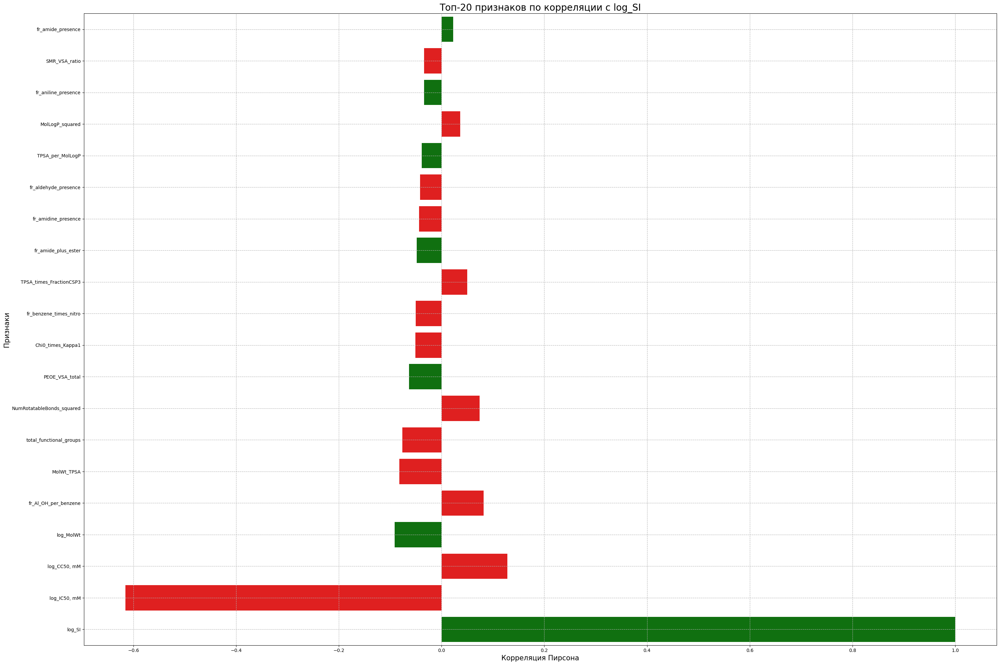

------------------------------------------------------------------------------------------------------------------------------------------------------




Линейный график: Корреляция признаков с "log_SI"
------------------------------------------------------------------------------------------------------------------------------------------------------


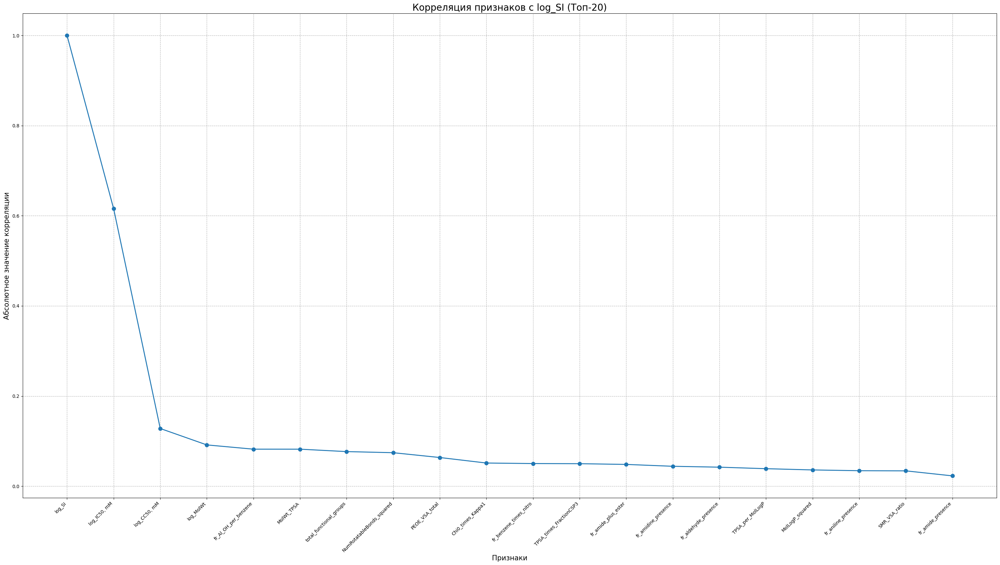

------------------------------------------------------------------------------------------------------------------------------------------------------


In [120]:
# Выделяем топ-20 признаков по корреляции с 'log_SI'
top_20_corr = correlation_with_si.head(20)
print('\nТоп-20 признаков по корреляции с "log_SI":')
print('-' * 50)
print('\n\n')





# Создаём заглавие для графика
print('\nГоризонтальная столбчатая диаграмма: Топ-20 признаков по корреляции с "log_SI"')
print('-' * 150)

# Определяем знаки корреляции
signs = correlation_matrix.loc[top_20_corr.index, 'log_SI'].apply(lambda x: 'positive' if x > 0 else 'negative')

# Создаём горизонтальную столбчатую диаграмму

plt.figure(figsize=(30, 20))
colors = ['green' if s == 'positive' else 'red' for s in signs]

sns.barplot(
    x = correlation_matrix.loc[top_20_corr.index, 'log_SI'][::-1], 
    y = top_20_corr.index[::-1], 
    palette = colors
)

# Настраиваем оформление графика
plt.title('Топ-20 признаков по корреляции с log_SI', fontsize = 20)
plt.xlabel('Корреляция Пирсона', fontsize = 15)
plt.ylabel('Признаки', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 1.0)
plt.tight_layout()

# Показываем график
plt.show()
print('-' * 150)
print('\n\n')





# Создаём заглавие для графика
print('\nЛинейный график: Корреляция признаков с "log_SI"')
print('-' * 150)

# Строим линейный график корреляции признаков с 'log_SI'
plt.figure(figsize=(30, 17))

plt.plot(
    correlation_with_si.values[:20], 
    marker = 'o', 
    linestyle = '-',
    linewidth = 2,
    markersize = 8
)

# Настраиваем оформление графика
plt.title('Корреляция признаков с log_SI (Топ-20)', fontsize = 20)
plt.xlabel('Признаки', fontsize = 15)
plt.ylabel('Абсолютное значение корреляции', fontsize = 15)
plt.xticks(ticks=range(20), labels=correlation_with_si.index[:20], rotation=45, ha='right')
plt.grid(True, linestyle = '--', alpha = 1.0)
plt.tight_layout()

# Показываем график
plt.show()
print('-' * 150)

#### $5.2$

**Тесты значимости.**

Проверим, различаются ли средние значения целевых переменных между группами `fr_`.

Для этого создадим функцию для проведения **Т-теста** (функция будет содержать рассчёт теста и коробчатую диаграмму):

In [59]:
# Создаём функцию 'ttest_checking'
def ttest_checking(data, fr_feature, target, colors):
    
    
    # Выводим заголовок для текущей переменной
    print(f'Тестирование различия средних значений "{target}" между группами "{fr_feature}":')
    print()
    
    
    # Задаём уровень значимости
    alpha = 0.05
    
    # Выделяем группы
    group0 = data[data[fr_feature] == 0.0][target]
    group1 = data[data[fr_feature] == 1.0][target]
    
    # Вычисляем результаты Т-теста
    stat, p_value = stats.ttest_ind(group0, group1, nan_policy = 'omit')
    
    
    # Выводим результаты теста
    print(f'Статистика: {stat:.4f}, p-значение: {p_value:.4f}')
    
    # Проверяем гипотезу
    if p_value > alpha:
        print(f'Различие в "{target}" между группами незначимо (не отвергаем гипотезу H0)')
    else:
        print(f'Различие в "{target}" между группами значимо (отвергаем гипотезу H0)')
    
    print('-' * 75)
    print('\n') 
    
    
    
    
    # Создаём заглавие для графика
    print(f'Коробчатая диаграмма распределения "{target}" по группам "{fr_feature}":')
    print('-' * 150)

    fig = px.box(
        df_transformed, 
        x = fr_feature, 
        y = target, 
        color = fr_feature,
        title = f'Распределение "{target}" по группам "{fr_feature}"',
        
        labels = {
            fr_feature: 'Наличие амидной группы (0/1)', 
            target: target
        },
    
        points = 'all', 
        category_orders = {fr_feature: [0.0, 1.1]},
        color_discrete_sequence = colors
    )


    # Настраиваем оформление
    fig.update_layout(
        height = 700,
        width = 1200,
        xaxis_title = 'Наличие амидной группы',
        yaxis_title = target,
        showlegend = False
    )

    # Показать график
    fig.show('png')
    print('-' * 150)

Задаим параметры для проведения тестов а так же для построения графиков:

In [60]:
# Создаём список функциональных групп
fr_groups_list = ['fr_amide_presence', 'fr_amidine_presence', 'fr_aniline_presence']


# Создаём список цветовых палитр
colors_list = [
    px.colors.qualitative.Pastel,
    px.colors.qualitative.Dark2_r,
    px.colors.qualitative.Dark24_r
]




# Определяем кастомный шаблон для графиков
pio.templates['custom_template'] = go.layout.Template(
    layout = dict(
        
        title = dict(
            font = dict(size = 20, color = '#1f77b4')         # заголовок — синий
        ),
        
        xaxis = dict(
            titlefont = dict(size = 14, color = '#8c564b'),   # заголовок оси X
            linecolor = '#CCCCCC',                            # цвет оси
            gridcolor = '#EEEEEE'                             # цвет сетки
        ),
        
        yaxis = dict(
            titlefont = dict(size = 14, color = '#8c564b'),   # заголовок оси Y
            linecolor = "#CCCCCC",
            gridcolor = '#EEEEEE'
        ),
        
        plot_bgcolor = 'white',                                 # фон области построения
        paper_bgcolor = 'white'                                 # общий фон
    )
)

# Устанавливаем кастомный шаблон по умолчанию
pio.templates.default = 'custom_template'

Проводим **Т-тест** для `log_SI`:

Тестирование различия средних значений "log_SI" между группами "fr_amide_presence":

Статистика: -0.6850, p-значение: 0.4935
Различие в "log_SI" между группами незначимо (не отвергаем гипотезу H0)
---------------------------------------------------------------------------


Коробчатая диаграмма распределения "log_SI" по группам "fr_amide_presence":
------------------------------------------------------------------------------------------------------------------------------------------------------


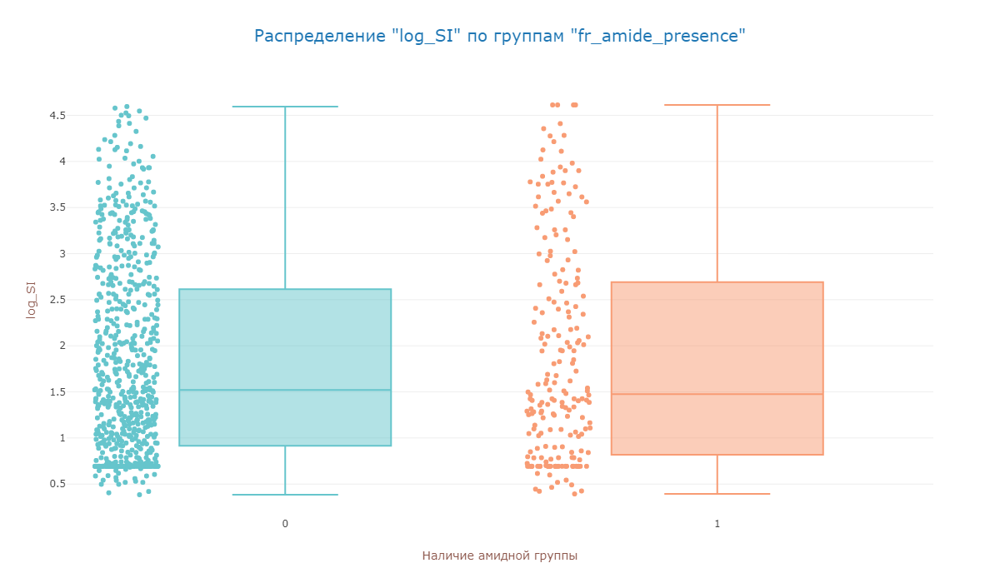

------------------------------------------------------------------------------------------------------------------------------------------------------




Тестирование различия средних значений "log_SI" между группами "fr_amidine_presence":

Статистика: 1.3246, p-значение: 0.1856
Различие в "log_SI" между группами незначимо (не отвергаем гипотезу H0)
---------------------------------------------------------------------------


Коробчатая диаграмма распределения "log_SI" по группам "fr_amidine_presence":
------------------------------------------------------------------------------------------------------------------------------------------------------


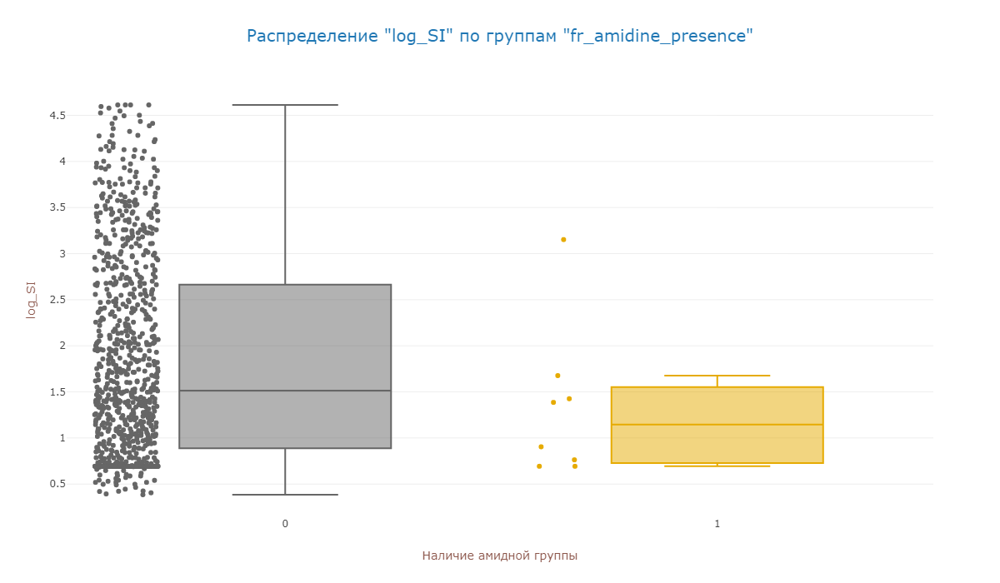

------------------------------------------------------------------------------------------------------------------------------------------------------




Тестирование различия средних значений "log_SI" между группами "fr_aniline_presence":

Статистика: 1.0292, p-значение: 0.3037
Различие в "log_SI" между группами незначимо (не отвергаем гипотезу H0)
---------------------------------------------------------------------------


Коробчатая диаграмма распределения "log_SI" по группам "fr_aniline_presence":
------------------------------------------------------------------------------------------------------------------------------------------------------


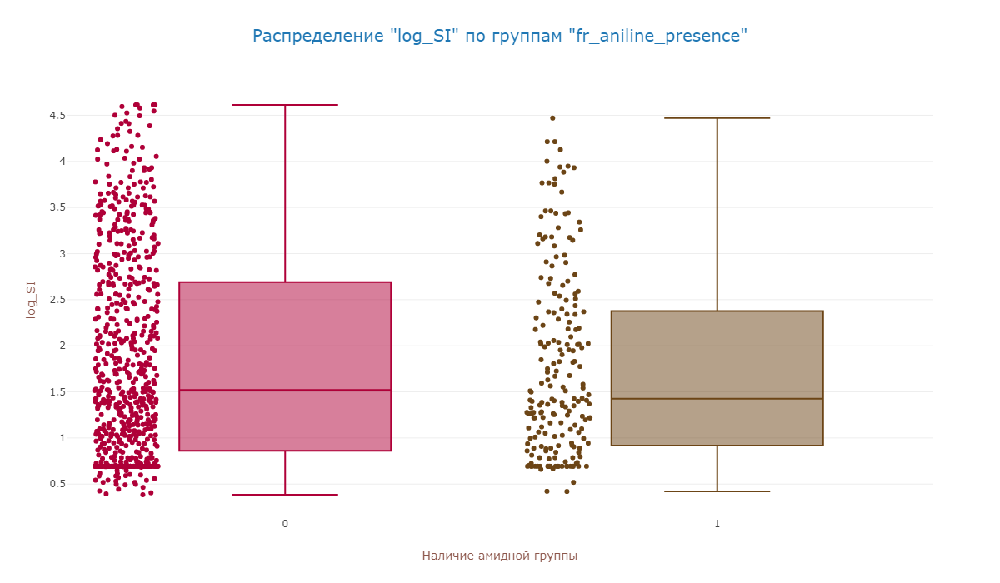

------------------------------------------------------------------------------------------------------------------------------------------------------






In [61]:
# Создаём цикл по созданным спискам функциональных групп и цветовых палитр
for feature, color in zip(fr_groups_list, colors_list):
    
    # Производим рассчёт Т-теста и строим график
    ttest_checking(
        data = df_transformed,
        fr_feature = feature,
        target = 'log_SI',
        colors = color
    )
    
    # Разделим результаты тестов для удобства
    print('\n\n\n')

**Вывод:**


Проводим **Т-тест** для `log_IC50, mM`:

Тестирование различия средних значений "log_IC50, mM" между группами "fr_amide_presence":

Статистика: -0.9132, p-значение: 0.3614
Различие в "log_IC50, mM" между группами незначимо (не отвергаем гипотезу H0)
---------------------------------------------------------------------------


Коробчатая диаграмма распределения "log_IC50, mM" по группам "fr_amide_presence":
------------------------------------------------------------------------------------------------------------------------------------------------------


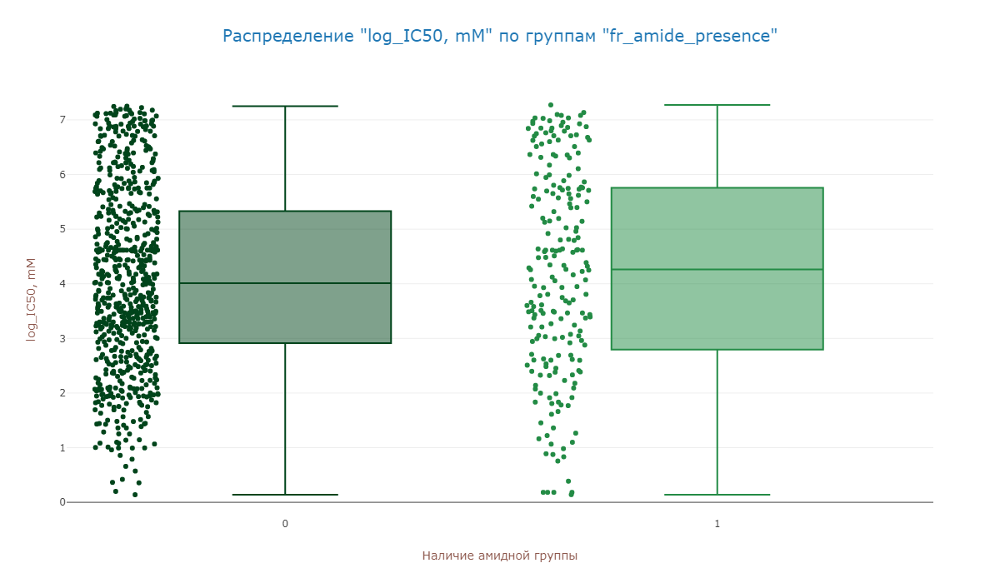

------------------------------------------------------------------------------------------------------------------------------------------------------




Тестирование различия средних значений "log_IC50, mM" между группами "fr_amidine_presence":

Статистика: -2.3982, p-значение: 0.0167
Различие в "log_IC50, mM" между группами значимо (отвергаем гипотезу H0)
---------------------------------------------------------------------------


Коробчатая диаграмма распределения "log_IC50, mM" по группам "fr_amidine_presence":
------------------------------------------------------------------------------------------------------------------------------------------------------


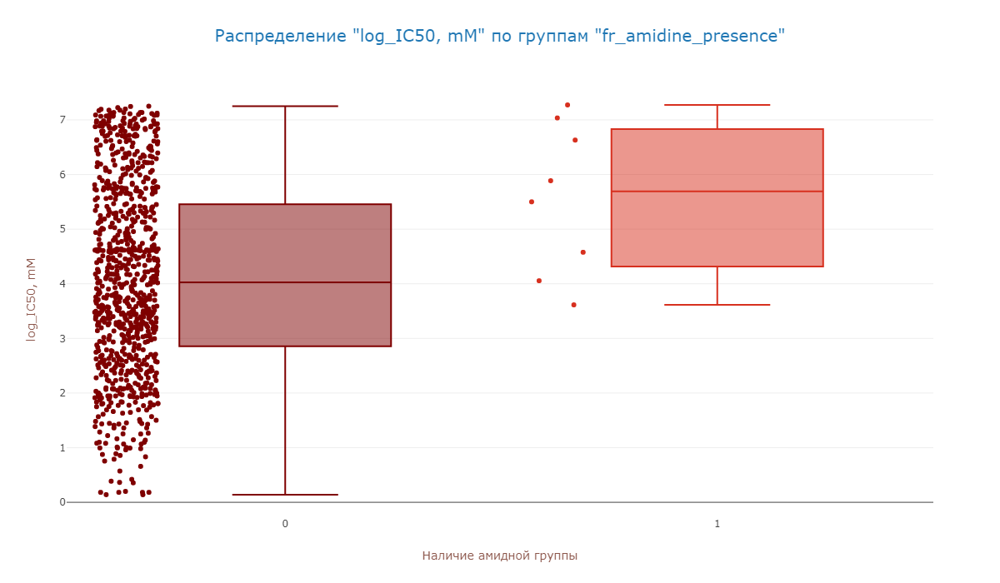

------------------------------------------------------------------------------------------------------------------------------------------------------




Тестирование различия средних значений "log_IC50, mM" между группами "fr_aniline_presence":

Статистика: 0.6010, p-значение: 0.5480
Различие в "log_IC50, mM" между группами незначимо (не отвергаем гипотезу H0)
---------------------------------------------------------------------------


Коробчатая диаграмма распределения "log_IC50, mM" по группам "fr_aniline_presence":
------------------------------------------------------------------------------------------------------------------------------------------------------


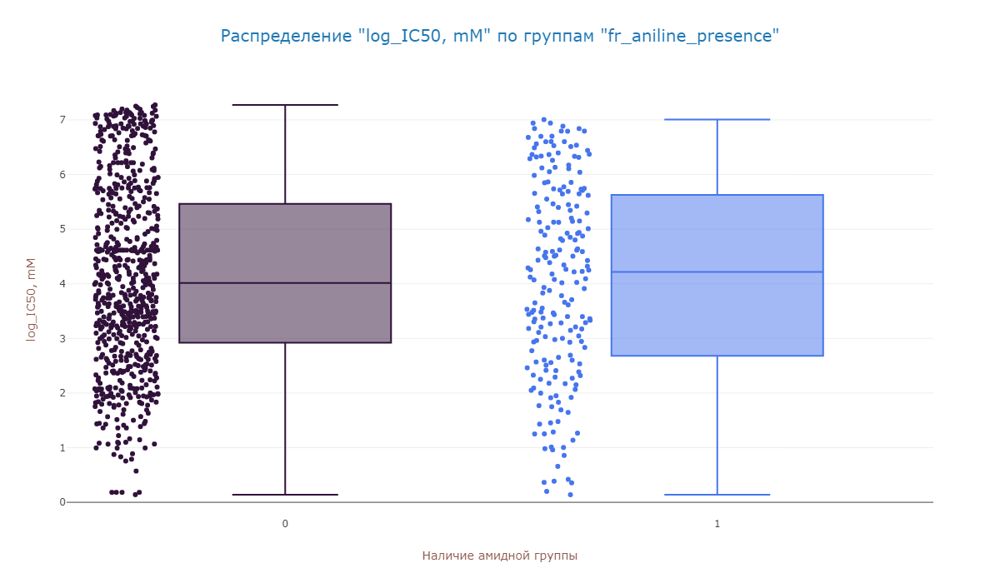

------------------------------------------------------------------------------------------------------------------------------------------------------






In [62]:
# Создаём список цветовых палитр
colors_list = [
    px.colors.sequential.Greens_r,
    px.colors.sequential.OrRd_r,
    px.colors.sequential.Turbo
]



# Создаём цикл по созданным спискам функциональных групп и цветовых палитр
for feature, color in zip(fr_groups_list, colors_list):
    
    # Производим рассчёт Т-теста и строим график
    ttest_checking(
        data = df_transformed,
        fr_feature = feature,
        target = 'log_IC50, mM',
        colors = color
    )
    
    # Разделим результаты тестов для удобства
    print('\n\n\n')

**Вывод:**



Проводим **Т-тест** для `log_CC50, mM`:

Тестирование различия средних значений "log_CC50, mM" между группами "fr_amide_presence":

Статистика: -1.2288, p-значение: 0.2195
Различие в "log_CC50, mM" между группами незначимо (не отвергаем гипотезу H0)
---------------------------------------------------------------------------


Коробчатая диаграмма распределения "log_CC50, mM" по группам "fr_amide_presence":
------------------------------------------------------------------------------------------------------------------------------------------------------


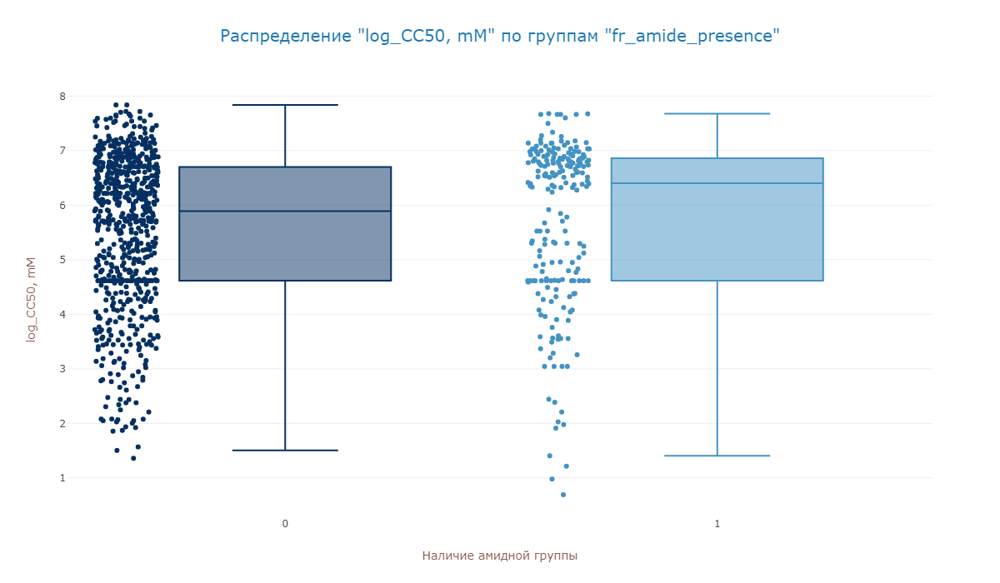

------------------------------------------------------------------------------------------------------------------------------------------------------




Тестирование различия средних значений "log_CC50, mM" между группами "fr_amidine_presence":

Статистика: -1.7743, p-значение: 0.0764
Различие в "log_CC50, mM" между группами незначимо (не отвергаем гипотезу H0)
---------------------------------------------------------------------------


Коробчатая диаграмма распределения "log_CC50, mM" по группам "fr_amidine_presence":
------------------------------------------------------------------------------------------------------------------------------------------------------


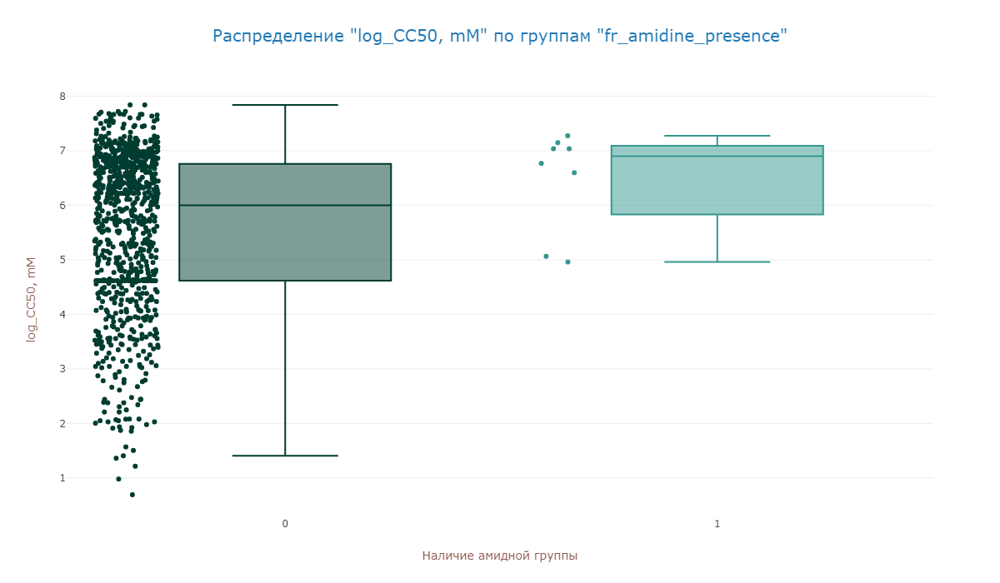

------------------------------------------------------------------------------------------------------------------------------------------------------




Тестирование различия средних значений "log_CC50, mM" между группами "fr_aniline_presence":

Статистика: 1.7582, p-значение: 0.0790
Различие в "log_CC50, mM" между группами незначимо (не отвергаем гипотезу H0)
---------------------------------------------------------------------------


Коробчатая диаграмма распределения "log_CC50, mM" по группам "fr_aniline_presence":
------------------------------------------------------------------------------------------------------------------------------------------------------


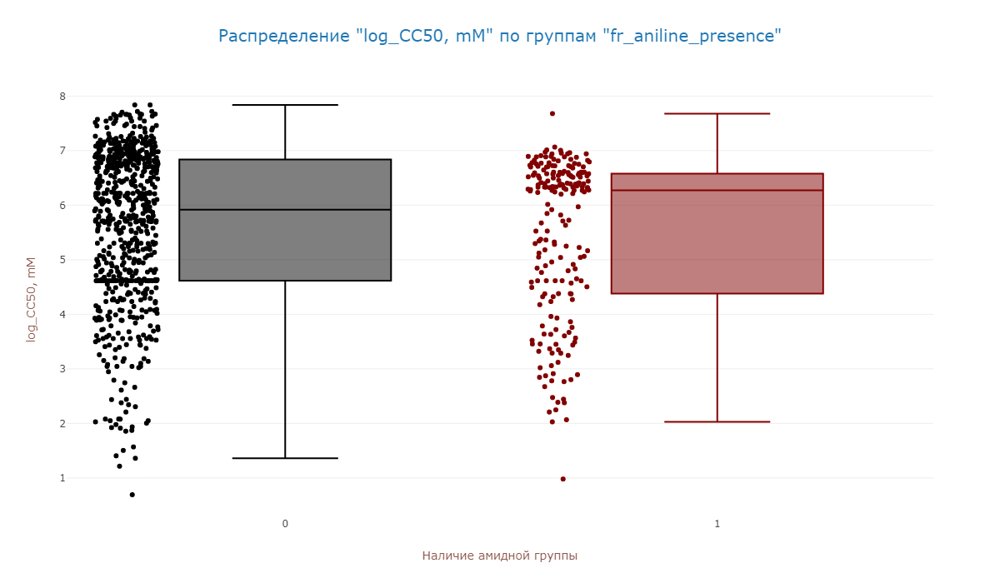

------------------------------------------------------------------------------------------------------------------------------------------------------






In [63]:
# Создаём список цветовых палитр
colors_list = [
    px.colors.diverging.RdBu_r,
    px.colors.diverging.BrBG_r,
    px.colors.cyclical.IceFire_r
]



# Создаём цикл по созданным спискам функциональных групп и цветовых палитр
for feature, color in zip(fr_groups_list, colors_list):
    
    # Производим рассчёт Т-теста и строим график
    ttest_checking(
        data = df_transformed,
        fr_feature = feature,
        target = 'log_CC50, mM',
        colors = color
    )
    
    # Разделим результаты тестов для удобства
    print('\n\n\n')

#### $5.3$

**Корреляционный анализ.** 

Создаём функцию для построения тепловой карты корреляции признаков:

In [64]:
# Создаём функцию 'heatmap_corr()' для построения тепловой карты корреляции
def heatmap_corr(data, title = None, figsize = None, cmap = None):
    
    
    """
    Функция для построения тепловой карты корреляции.
    
    Параметры:
    data (DataFrame): Данные для анализа.
    title (str): Заголовок графика.
    figsize (tuple): Размер графика.
    
    """
    
    
    # Создаём заголовок для графика
    print('Тепловая карта корреляции признаков:')
    print('-' * 150)
    
    
    # Задаём размер полотна
    plt.rcParams['figure.figsize'] = figsize
    
    # Строим тепловую карту
    sns.heatmap(
        data.corr(),
        mask = np.triu(np.ones_like(data.corr(), dtype = bool)),
        annot = True,
        fmt = '.2f',
        cmap = cmap,
        vmin = -1, 
        vmax = 1, 
        center = 0,
        square = True,
        cbar_kws = {'shrink': .8},
        linewidths = 0.5,
        linecolor = 'black',
        annot_kws = {'size': 10, 'weight': 'bold', 'color': 'black'},
        cbar = True
    )
    
    # Настраиваем параметры
    plt.title(title, fontsize = 20)
    plt.tight_layout()
    
    # Выводим график
    plt.show()
    print('-' * 150)

Пока проверим корреляцию созданных признаков:

Тепловая карта корреляции признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


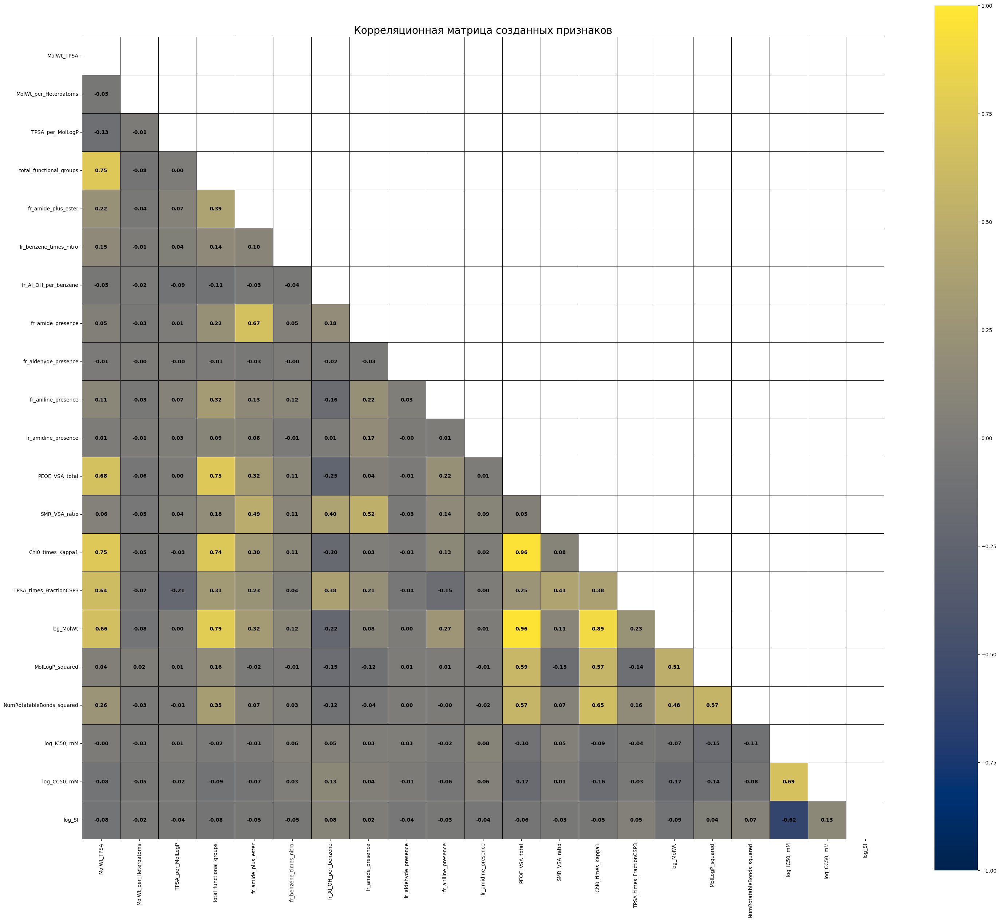

------------------------------------------------------------------------------------------------------------------------------------------------------


In [65]:
# Применяем функцию 'heatmap_corr()' для построения тепловой карты корреляции
heatmap_corr(
    data = df_transformed,
    title = 'Корреляционная матрица созданных признаков',
    figsize = (30, 30),
    cmap = 'cividis'
)

**Вывод:**

По полученной тепловой карте можно заметить, что высокая корреляция (<$0.8$) наблюдается между признаками `PEOE_VSA_total`, `Chi0_times_Kappa1` и `log_MolWt`, причём их корреляция с целевыми переменными примерно одинаковая. Среди данных признаков самая высокая корреляция с целевыми переменными видна у признака `Chi0_times_Kappa1`, следовательно его мы и сохраним, а остальные $2$ признака удалим.

Удаляем выбранные признаки:

Тепловая карта корреляции признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


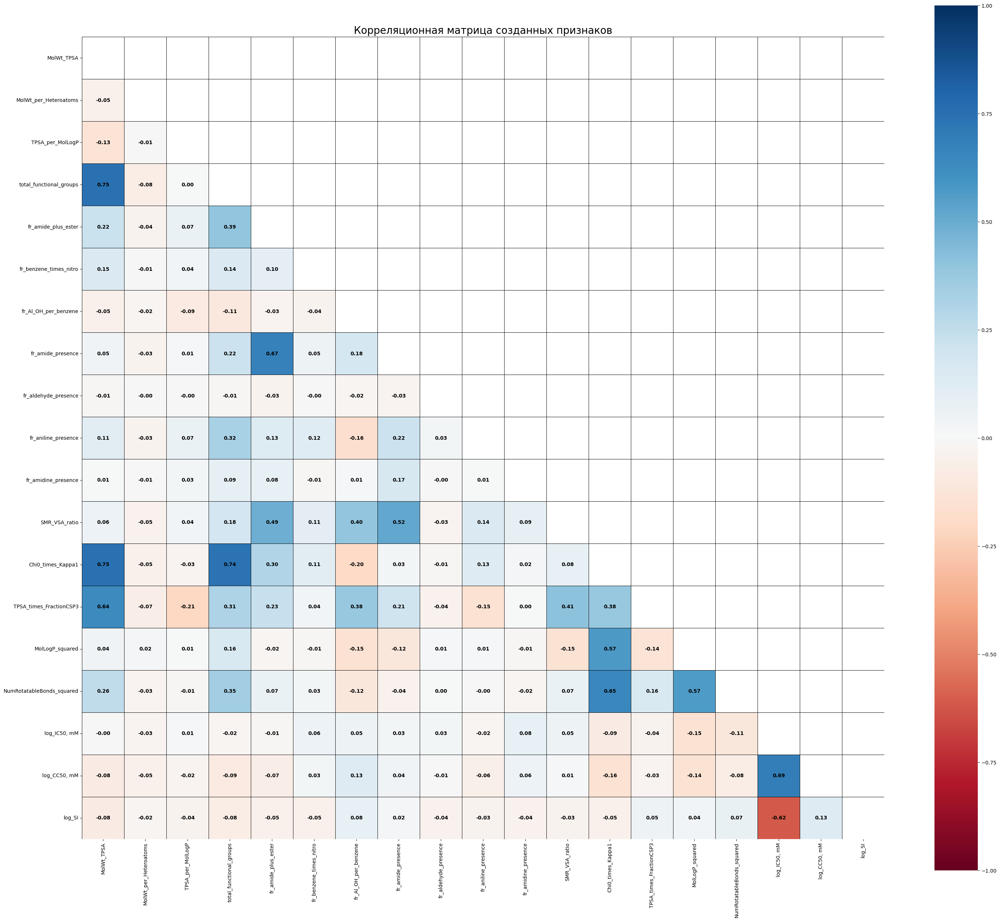

------------------------------------------------------------------------------------------------------------------------------------------------------


In [66]:
# Удаляем указанные признаки из данных
df_transformed.drop(
    columns = ['PEOE_VSA_total', 'log_MolWt'],
    axis = 1,
    inplace = True
)


df_transformed_full.drop(
    columns = ['PEOE_VSA_total', 'log_MolWt'],
    axis = 1,
    inplace = True
)




# Повторно построим тепловую карту
heatmap_corr(
    data = df_transformed,
    title = 'Корреляционная матрица созданных признаков',
    figsize = (30, 30),
    cmap = 'RdBu'
)

Создадим функцию для вывода высококоррелированных связей в **DataFrame**:

In [70]:
# Создадим функцию для выявления высококоррелированных связей в данных
def high_correlation_features(data):
    
    # Задаём порог корреляции
    threshold = 0.8

    # Создаём корреляционную матрицу
    corr_matrix = data.corr().abs()

    # Значения верхнего треугольника без диагонали
    upper_triangle = corr_matrix.where(~np.tril(np.ones(corr_matrix.shape)).astype(bool))



    # Выводим результат
    print('\nВысококоррелированные пары признаков:')
    print('-' * 40)
    print('\n\n\n')
    
    for column in upper_triangle.columns:
        for row in upper_triangle.index:
            corr_value = upper_triangle.loc[row, column]
            
            if pd.notnull(corr_value) and corr_value > threshold:
                print(f'"{row}" vs "{column}": {corr_value:.3f}')
                print('-' * 60)
                print()

Теперь выведем высококоррелированные связи в основном *DataFrame*:

In [71]:
# Применяем функцию 'high_correlation_features'          
high_correlation_features(data = df_transformed_full)


Высококоррелированные пары признаков:
----------------------------------------




"MaxAbsEStateIndex" vs "MaxEStateIndex": 1.000
------------------------------------------------------------

"MolWt" vs "HeavyAtomMolWt": 0.997
------------------------------------------------------------

"MolWt" vs "ExactMolWt": 1.000
------------------------------------------------------------

"HeavyAtomMolWt" vs "ExactMolWt": 0.997
------------------------------------------------------------

"MolWt" vs "NumValenceElectrons": 0.980
------------------------------------------------------------

"HeavyAtomMolWt" vs "NumValenceElectrons": 0.965
------------------------------------------------------------

"ExactMolWt" vs "NumValenceElectrons": 0.981
------------------------------------------------------------

"MinPartialCharge" vs "MaxAbsPartialCharge": 0.923
------------------------------------------------------------

"MaxPartialCharge" vs "MinAbsPartialCharge": 0.975
-------------------------------

Результат показывает очень большое количество высококоллинеарных пар. 

Из каждой пары выделим по одному признаку для удаления:

In [72]:
# Создаём корреляционную матрицу
corr_matrix = df_transformed_full.corr().abs()

# Создаём список признаков для удаления 
features_to_drop = []



# Проходимся циклом по каждой паре
for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        
        # Если порог корреляции выше чем 0.8, добавляем в список
        if corr_matrix.iloc[i, j] > 0.8:
            colname = corr_matrix.columns[j]
            features_to_drop.append(colname)
            
            
            
# Создаём отдельный список с целевыми признаками, чтобы их случайно не удалить
target_features = ['IC50, mM', 'CC50, mM', 'SI', 'log_IC50, mM', 'log_CC50, mM', 'log_SI']

# Отделяем целевые признаки от списка удаляемых столбцов
features_to_drop = [i for i in features_to_drop if i not in target_features]

# Выведем признаки для удаления
print(f'Удаляемые признаки:\n\n{features_to_drop}')

Удаляемые признаки:

['MaxEStateIndex', 'fr_alkyl_halide', 'FractionCSP3', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Kappa1', 'Kappa2', 'LabuteASA', 'HeavyAtomCount', 'MolMR', 'Chi0_times_Kappa1', 'ExactMolWt', 'NumValenceElectrons', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Kappa1', 'Kappa2', 'LabuteASA', 'HeavyAtomCount', 'MolMR', 'total_functional_groups', 'Chi0_times_Kappa1', 'NumValenceElectrons', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Kappa1', 'Kappa2', 'LabuteASA', 'HeavyAtomCount', 'MolMR', 'Chi0_times_Kappa1', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Kappa1', 'Kappa2', 'LabuteASA', 'HeavyAtomCount', 'MolMR', 'Chi0_times_Kappa1', 'MinAbsPartialCharge', 'MaxAbsPartialCharge', 'FpDensityMorgan2', 'FpDensityMorgan3', 'FpDensityMorgan3', 'BCUT2D_MRHI', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW', 'Chi0', 'Chi1', 'HallKierAlpha', 

Удаляем выбранные признаки:

In [73]:
# Удаляем признаки
df_reduced = df_transformed_full.drop(columns = features_to_drop, axis = 1)

# Проверим результат
high_correlation_features(data = df_reduced)


Высококоррелированные пары признаков:
----------------------------------------






#### $5.4$

Выявим признаки с низкой дисперсией (<$0.02$):

In [74]:
# Рассчёт дисперсии
variances = df_reduced.var()

# Создаём DataFrame
var_df = variances.reset_index()
var_df.columns = ['feature', 'variance']

# Порог отсечения и топ-N признаков для отображения
threshold = 0.01
top_n = 15

# Создаём список признаков с низкой дисперсией
low_variance_features = var_df[var_df['variance'] < threshold]




# Выводим дисперсии
print(f'Дисперсии всех признаков:\n\n{variances.sort_values()}')
print('-' * 50)
print('\n')

# Выводим признаки
print(f'Обнаружено признаков с дисперсией < {threshold}: {len(low_variance_features)}')
print('-' * 50)
print()

print('Примеры: {} ...'.format(low_variance_features['feature'].tolist()[:5]))
print('-' * 95)
print('\n\n')

Дисперсии всех признаков:

fr_nitroso               0.000000e+00
fr_isothiocyan           0.000000e+00
fr_thiocyan              0.000000e+00
fr_prisulfonamd          0.000000e+00
fr_lactam                0.000000e+00
                             ...     
MolWt                    1.613037e+04
MolWt_per_Heteroatoms    1.382819e+12
fr_Al_OH_per_benzene     2.998657e+19
SMR_VSA_ratio            8.694360e+21
Ipc                      1.746576e+24
Length: 143, dtype: float64
--------------------------------------------------


Обнаружено признаков с дисперсией < 0.01: 35
--------------------------------------------------

Примеры: ['NumRadicalElectrons', 'MinPartialCharge', 'SMR_VSA8', 'SlogP_VSA9', 'fr_Ar_COO'] ...
-----------------------------------------------------------------------------------------------





Построим визуализацию:


Гистограмма признаков с низкой дисперсией:
------------------------------------------------------------------------------------------------------------------------------------------------------


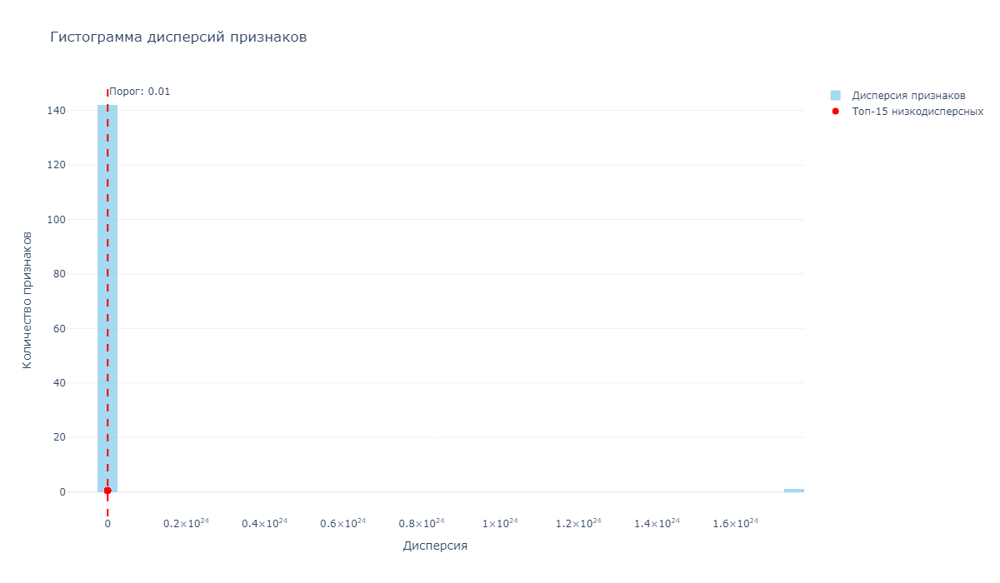

------------------------------------------------------------------------------------------------------------------------------------------------------


In [76]:
# Отбор признаков с низкой дисперсией
low_variance_topN = low_variance_features.nsmallest(top_n, 'variance')

# Задаём заголовок графика
print('\nГистограмма признаков с низкой дисперсией:')
print('-' * 150)



# Построение интерактивной гистограммы
fig = go.Figure()

# Гистограмма всех признаков
fig.add_trace(go.Histogram(
    x = var_df['variance'],
    nbinsx = 50,
    marker_color = 'skyblue',
    opacity = 0.75,
    name = 'Дисперсия признаков'
))

# Вертикальная линия (порог)
fig.add_vline(
    x = threshold,
    line_dash = 'dash',
    line_color = 'red',
    annotation_text = f'Порог: {threshold}',
    annotation_position = 'top right'
)

# Красные точки для топ-N низкодисперсных признаков
fig.add_trace(go.Scatter(
    x = low_variance_topN['variance'],
    y = [0.5] * len(low_variance_topN),
    mode = 'markers',
    marker = dict(color='red', size = 8),
    name = f'Топ-{top_n} низкодисперсных',
    text = low_variance_topN['feature'],
    hovertemplate = 'Признак: %{text}<br>Дисперсия: %{x:.4e}<extra></extra>'
))


# Настраиваем оформление
fig.update_layout(
    title = 'Гистограмма дисперсий признаков',
    xaxis_title = 'Дисперсия',
    yaxis_title = 'Количество признаков',
    template = 'plotly_white',
    height = 700,
    width = 1200
)


# Отображаем график
fig.show('png')
print('-' * 150)

**Вывод:**

Большинство признаков в наборе данных имеют низкую дисперсию, что может указывать на их стабильность или однородность. Признаки с дисперсией выше порога могут быть менее информативными или содержать больше шума.

Удалим данные признаки:

In [77]:
# Удаление признаков с дисперсией ниже порога
features_to_drop = low_variance_features['feature'].tolist()
df_reduced = df_reduced.drop(columns = features_to_drop)


# Выводим информацию по DataFrame
check_data_inf(
    data = df_reduced,
    data_name = 'df_reduced',
    length1 = 40,
    length2 = 150
)

Данные таблицы "df_reduced" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 108.
----------------------------------------


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,MaxPartialCharge,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_MWLOW,...,fr_quatN,fr_sulfide,fr_thiazole,fr_thiophene,fr_unbrch_alkane,MolWt_per_Heteroatoms,TPSA_per_MolLogP,fr_Al_OH_per_benzene,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,0.038844,0.642857,14.822266,9.700470,...,0,0,0,0,3,192.325038,3.471325,0.0,0.000000e+00,22.818462
1,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,0.012887,0.607143,14.975110,9.689226,...,0,0,0,0,3,194.341028,3.908636,0.0,0.000000e+00,24.060000
2,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,0.094802,0.562500,15.353938,9.681293,...,2,0,0,0,3,223.402883,0.000000,0.0,8.966062e+10,0.000000
3,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,0.038844,0.620690,14.821216,9.700497,...,0,0,0,0,4,199.338503,3.291041,0.0,0.000000e+00,22.888889
4,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,0.062897,0.600000,14.831112,9.700386,...,0,0,0,0,0,233.355333,2.712073,0.0,0.000000e+00,14.232727


------------------------------------------------------------------------------------------------------------------------------------------------------


#### $5.5$

**Распределение признаков.**

Проверим распределение признаков после удаления нерелевантных столбцов. 

Для этого сперва, как и с анализом целевых переменных, используем **тест Шапиро-Уилка** чтобы провести анализ распределения всех признаков:

In [78]:
# Задаём уровень значимости
alpha = 0.05



# Создаём цикл по всем признакам
for column in df_reduced.columns:
    
    # Выводим заголовок для текущей переменной
    print()
    print(f'Тестирование нормальности распределения для "{column}":')
    print()
    
    # Выполняем тест Шапиро-Уилка
    stat, p_value = stats.shapiro(df_reduced[column].dropna())
    
    # Выводим результаты теста
    print(f'Статистика: {stat:.4f}, p-значение: {p_value:.4f}')
    
    # Проверяем гипотезу
    if p_value > alpha:
        print(f'Распределение признака "{column}" нормально (не отвергаем гипотезу H0)')
    else:
        print(f'Распределение признака "{column}" не нормально (отвергаем гипотезу H0)')
        
    print('-' * 80)
    print('\n\n')


Тестирование нормальности распределения для "MaxAbsEStateIndex":

Статистика: 0.8381, p-значение: 0.0000
Распределение признака "MaxAbsEStateIndex" не нормально (отвергаем гипотезу H0)
--------------------------------------------------------------------------------




Тестирование нормальности распределения для "MinAbsEStateIndex":

Статистика: 0.8634, p-значение: 0.0000
Распределение признака "MinAbsEStateIndex" не нормально (отвергаем гипотезу H0)
--------------------------------------------------------------------------------




Тестирование нормальности распределения для "MinEStateIndex":

Статистика: 0.7901, p-значение: 0.0000
Распределение признака "MinEStateIndex" не нормально (отвергаем гипотезу H0)
--------------------------------------------------------------------------------




Тестирование нормальности распределения для "qed":

Статистика: 0.9292, p-значение: 0.0000
Распределение признака "qed" не нормально (отвергаем гипотезу H0)
--------------------------------------

Из полученных результатов можно заключить, что практически ни один признак не имеет нормального распределения. Теперь, для подтверждения результатов, визуализируем наше распределение.

Для этого создадим функцию для построения графика распределения признаков:

In [80]:
# Создаём функцию 'features_distribution_plot()' для построения графика распределения признаков
def features_distribution_plot(data, title = None, figsize = None):
    
    
    # Создаём заголовок для графика
    print('\nГрафик распределения признаков:')
    print('-' * 150)
    
    
    """
    Функция для построения графиков распределения признаков.
    
    Параметры:
    - data: pandas DataFrame с данными.
    - features: список признаков для анализа.
    - title: заголовок графика.
    - figsize: размер графика.
    
    """
    
    
    # Задаём размер графика
    fig, ax = plt.subplots(figsize = figsize)

    # Построение плотностей распределения
    for column in data.columns:
    
        sns.kdeplot(
            data[column], 
            label = column, 
            ax = ax
        )



    # Настройка легенды: выносим за пределы графика
    plt.legend(
        bbox_to_anchor = (1.05, 1),
        loc = 'upper left',
        fontsize = 10
    )

    # Настройка графика
    plt.title(title, fontsize = 20)
    plt.xlabel('Значение', fontsize = 15)
    plt.ylabel('Плотность', fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()  
    
    
    
    # Выводим график
    plt.show()
    print('-' * 150)

Построим график распределения признаков:


График распределения признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


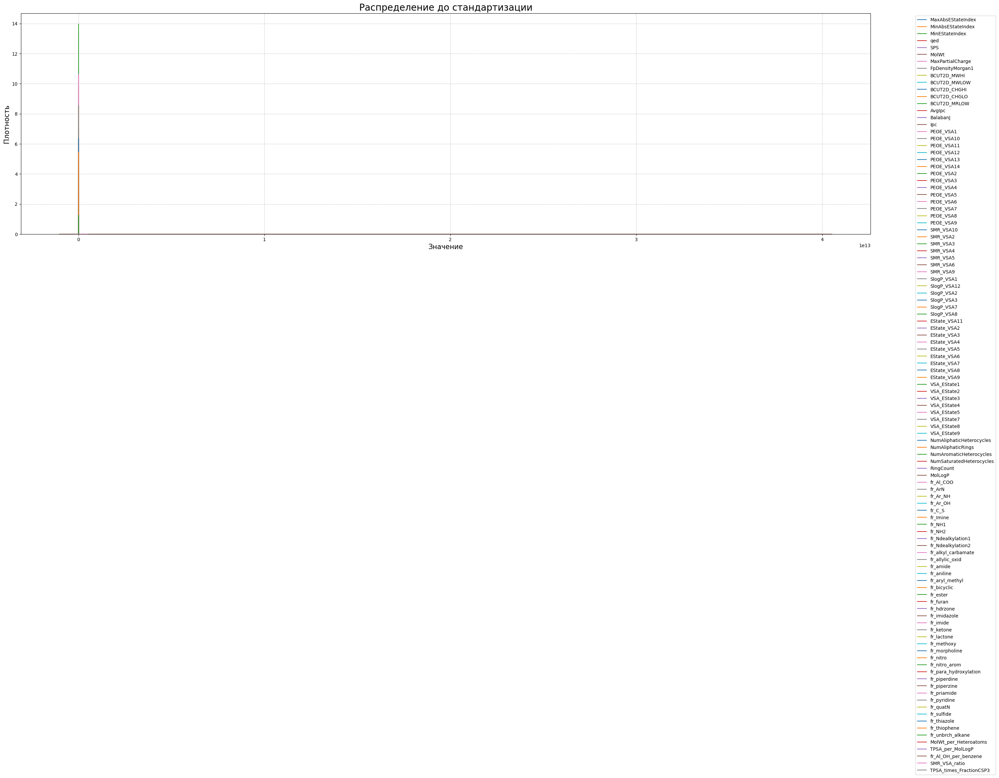

------------------------------------------------------------------------------------------------------------------------------------------------------


In [81]:
# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков
features_distribution_plot(
    data = df_reduced,
    title = 'Распределение до стандартизации',
    figsize = (30, 17)
)

По графику видно, что распределение имеет правостороннюю ассиметрию. Для более корректной работы модели необходимо провести преобразование признаков. Для этого можно воспользоваться методом `StandardScaler()`:

In [82]:
# Глобально инициализируем StandardScaler
s_scaler = preprocessing.StandardScaler()

# Обучаем MinMaxScaler на X_train
s_scaler.fit(df_reduced)




# Создаём функцию для нормализации признаков 
def STD_preprocessing(data):
    
    """
    Применяет StandardScaler к числовым признакам данных.
    s_scaler уже обучен на df_reduced.
    numeric_columns так же определён заранее.
    
    """
    
    # Применяем MinMaxScaler (только transform)
    data_scaled = pd.DataFrame(
        s_scaler.transform(data),
        columns  = data.columns,
        index = data.index
    )

    # Выводим количество числовых признаков
    print('Количество числовых признаков после "MinMaxScaler": {}'.format(data_scaled.shape[1]))

    return data_scaled

Применяем полученную функцию к таблице `df_reduced`:

Количество числовых признаков после "MinMaxScaler": 108

График распределения признаков:
------------------------------------------------------------------------------------------------------------------------------------------------------


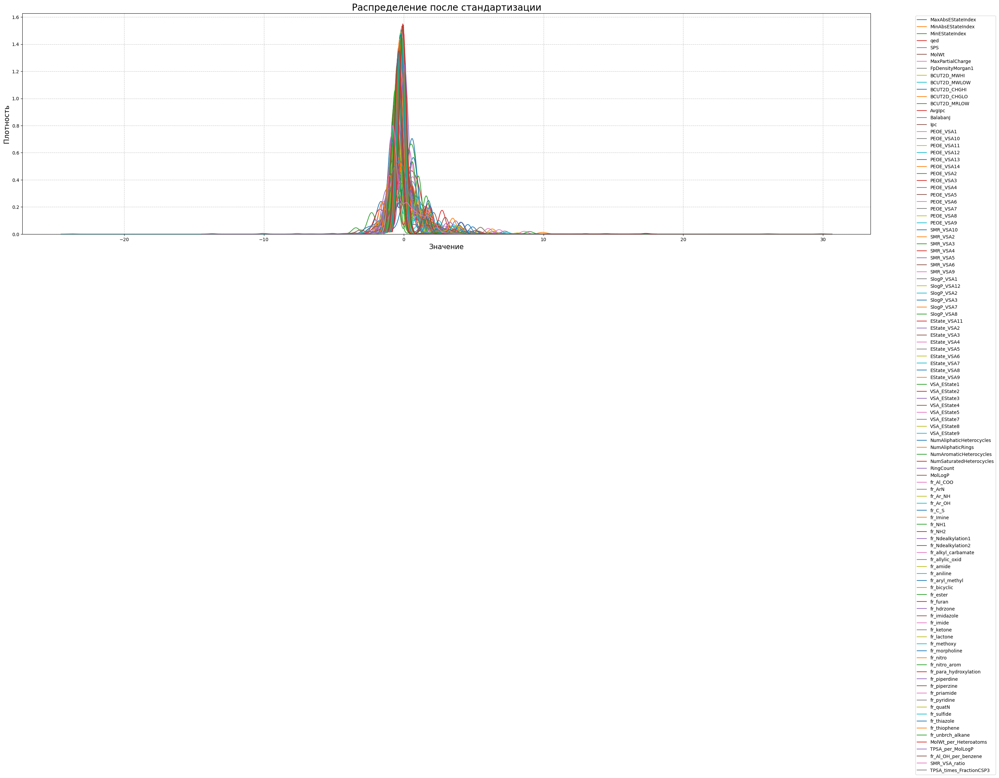

------------------------------------------------------------------------------------------------------------------------------------------------------


In [83]:
# Проводим преобразование
df_processed = STD_preprocessing(df_reduced)


# Повторно выводим график распределения
features_distribution_plot(
    data = df_processed,
    title = 'Распределение после стандартизации',
    figsize = (30, 17)
)

Теперь данные нормализованы и готовы к дальнейшему использованию.

#### $5.6$

**Создание итогового `Pipeline`.**

Создадим класс, в котором реализуем все этапы по удалению нерелевантных признаков:

In [84]:
# Создаём класс 'FeatureSelector' для удаления нерелевантных признаков
class FeatureSelector(base.BaseEstimator, base.TransformerMixin):
    
    
    
    # Задаём необходимые параметры
    def __init__(self, corr_threshold = 0.8, var_threshold = 0.02):
        
        self.corr_threshold = corr_threshold                                # порог корреляции
        self.var_threshold = var_threshold                                  # порог дисперсии
        self.to_drop_corr = []                                              # список с признаками для удаления (корреляция)            
        self.to_drop_var = []                                               # список с признаками для удаления (дисперсия)
        
        
        
    # Обучаем трансформер на данных
    def fit(self, X, y = None):
        
        # Преобразуем X в DataFrame, если это numpy массив
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X)
        if not isinstance(X, pd.DataFrame):
            raise ValueError('"X" должен быть "pandas DataFrame" или "numpy array"')
        
        # Удаление высококоррелирующих признаков
        X_num = X.select_dtypes(include = [np.number])
        corr_matrix = X_num.corr().abs()
        upper_triangle = corr_matrix.where(~np.tril(np.ones(corr_matrix.shape)).astype(bool))
        self.to_drop_corr = [column for column in upper_triangle.columns if any(upper_triangle[column] > self.corr_threshold)]
        
        # Удаление признаков с низкой дисперсией 
        # учтём только оставшиеся признаки после удаления корреляции
        X_temp = X_num.drop(columns = self.to_drop_corr, errors = 'ignore')
        variances = X_temp.var()
        self.to_drop_var = variances[variances < self.var_threshold].index.tolist()
        
        return self
    
    
    
    # Преобразовываем данные
    def transform(self, X):
        
        # Преобразуем X в DataFrame, если это numpy массив
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X)
        if not isinstance(X, pd.DataFrame):
            raise ValueError('"X" должен быть "pandas DataFrame" или "numpy array"')
        
        # Удаляем высококоррелирующие признаки и признаки с низкой дисперсией
        X_num = X.select_dtypes(include = [np.number])
        features_to_drop = list(set(self.to_drop_corr + self.to_drop_var))
        X_transformed = X_num.drop(columns = features_to_drop, errors = 'ignore')
        
        return X_transformed
    
    
    
    # Выполняем fit и transform одновременно
    def fit_transform(self, X, y = None):
        self.fit(X, y)
        return self.transform(X)
        
        
        
    # Выводим информацию о удалённых признаках
    def get_dropped_features(self):
        
        # Создаём словарь удалённых признаков
        dropped_features_dict = {
            'dropped_due_to_correlation': self.to_drop_corr,
            'dropped_due_to_variance': self.to_drop_var
        }
        
        return dropped_features_dict

Проверим работу класса:

In [85]:
# Создаём экземпляр класса 'FeatureSelector()'         
F_selector = FeatureSelector(
    corr_threshold = 0.8, 
    var_threshold = 0.02
)


# Обучаем наш класс 
F_selector.fit(df_transformed_full)

# Преобразовываем данные
X_filtered = F_selector.transform(df_transformed_full)



# Выводим результаты
dropped_features = F_selector.get_dropped_features()

print('Удаленные признаки:\n')
print('Из-за высокой корреляции: {}'.format(dropped_features['dropped_due_to_correlation']))
print('Из-за низкой дисперсии: {}'.format(dropped_features['dropped_due_to_variance']))
print('-' * 150)
print('\n')

print(f'Оригинальное количество признаков: {df_transformed_full.shape[1]}')
print(f'Количество признаков после трансформации: {X_filtered.shape[1]}')
print('-' * 50)
print('\n')

print('Оставшиеся признаки:\n')
print(X_filtered.columns.tolist())
print('-' * 150)
print('\n\n')


# Выводим информацию обновлённого 'DataFrame'       
check_data_inf(
    data = X_filtered,
    data_name = 'X_filtered',
    length1 = 40,
    length2 = 150
)

Удаленные признаки:

Из-за высокой корреляции: ['MaxEStateIndex', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'MaxAbsPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan2', 'FpDensityMorgan3', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n', 'Chi4v', 'HallKierAlpha', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'SMR_VSA1', 'SMR_VSA7', 'SlogP_VSA10', 'SlogP_VSA11', 'SlogP_VSA4', 'SlogP_VSA5', 'SlogP_VSA6', 'TPSA', 'EState_VSA1', 'EState_VSA10', 'VSA_EState10', 'VSA_EState6', 'FractionCSP3', 'HeavyAtomCount', 'NHOHCount', 'NOCount', 'NumAliphaticCarbocycles', 'NumAromaticCarbocycles', 'NumAromaticRings', 'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumRotatableBonds', 'NumSaturatedCarbocycles', 'NumSaturatedRings', 'MolMR', 'fr_Al_OH', 'fr_Al_OH_noTert', 'fr_Ar_N', 'fr_COO', 'fr_COO2', 'fr_C_O', 'fr_C_O_noCOO', 'fr_NH0', 'fr_Nhpyrrole', 'fr_alkyl_halide', 'fr_benz

,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,...,fr_quatN,fr_sulfide,fr_thiazole,fr_thiophene,fr_unbrch_alkane,MolWt_per_Heteroatoms,TPSA_per_MolLogP,fr_Al_OH_per_benzene,SMR_VSA_ratio,TPSA_times_FractionCSP3
0,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,0.642857,14.822266,9.700470,2.600532,...,0,0,0,0,3,192.325038,3.471325,0.0,0.000000e+00,22.818462
1,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,0.607143,14.975110,9.689226,2.614066,...,0,0,0,0,3,194.341028,3.908636,0.0,0.000000e+00,24.060000
2,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,0.562500,15.353938,9.681293,2.665274,...,2,0,0,0,3,223.402883,0.000000,0.0,8.966062e+10,0.000000
3,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,0.620690,14.821216,9.700497,2.600529,...,0,0,0,0,4,199.338503,3.291041,0.0,0.000000e+00,22.888889
4,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,0.600000,14.831112,9.700386,2.602486,...,0,0,0,0,0,233.355333,2.712073,0.0,0.000000e+00,14.232727


------------------------------------------------------------------------------------------------------------------------------------------------------


Добавим созданный класс `FeatureSelector` и `StandardScaler` в `preprocessing_pipeline`:

In [86]:
# Добавляем 'FeatureSelector' в 'preprocessing_pipeline'
preprocessing_pipeline = pipeline.Pipeline(
    [
        ('feature_union', feature_union),
        ('feature_selector', FeatureSelector(corr_threshold = 0.8, var_threshold = 0.02)),
        ('S_scaler', preprocessing.StandardScaler())
    ]
)

#### $5.7$

**Сохранение результатов.**

Добавим целевые переменные к преобразованному датасету:

In [87]:
# Добавим к преобразованному датасету целевые признаки
molecule_final_df = pd.concat(
    [X_filtered, y],
    axis = 1
)


# Выводим результат
check_data_inf(
    data = molecule_final_df,
    data_name = 'molecule_final_df',
    length1 = 40,
    length2 = 150
)

Данные таблицы "molecule_final_df" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 107.
----------------------------------------


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,FpDensityMorgan1,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,...,fr_thiophene,fr_unbrch_alkane,MolWt_per_Heteroatoms,TPSA_per_MolLogP,fr_Al_OH_per_benzene,SMR_VSA_ratio,TPSA_times_FractionCSP3,"log_IC50, mM","log_CC50, mM",log_SI
0,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,0.642857,14.822266,9.700470,2.600532,...,0,3,192.325038,3.471325,0.0,0.000000e+00,22.818462,1.979535,5.173221,3.371597
1,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,0.607143,14.975110,9.689226,2.614066,...,0,3,194.341028,3.908636,0.0,0.000000e+00,24.060000,0.572014,1.856738,2.079442
2,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,0.562500,15.353938,9.681293,2.665274,...,0,3,223.402883,0.000000,0.0,8.966062e+10,0.000000,5.415250,5.088474,0.542324
3,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,0.620690,14.821216,9.700497,2.600529,...,0,4,199.338503,3.291041,0.0,0.000000e+00,22.888889,0.995333,4.690023,4.162553
4,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,0.600000,14.831112,9.700386,2.602486,...,0,0,233.355333,2.712073,0.0,0.000000e+00,14.232727,4.683348,4.943576,0.832909


------------------------------------------------------------------------------------------------------------------------------------------------------


In [88]:
# Добавим к преобразованному датасету целевые признаки
molecule_final_df = pd.concat(
    [df_transformed_full, y],
    axis = 1
)


# Выводим результат
check_data_inf(
    data = molecule_final_df,
    data_name = 'molecule_final_df',
    length1 = 40,
    length2 = 150
)

Данные таблицы "molecule_final_df" имеют следующую размерность:

Количество строк: 904;
Количество признаков (столбцов): 225.
----------------------------------------


,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_benzene_times_nitro,fr_Al_OH_per_benzene,SMR_VSA_ratio,Chi0_times_Kappa1,TPSA_times_FractionCSP3,MolLogP_squared,NumRotatableBonds_squared,"log_IC50, mM","log_CC50, mM",log_SI
0,5.094096,5.094096,0.387225,0.387225,0.417362,42.928571,384.652,340.300,384.350449,158,...,0.0,0.0,0.000000e+00,416.429500,22.818462,50.711489,49.0,1.979535,5.173221,3.371597
1,3.961417,3.961417,0.533868,0.533868,0.462473,45.214286,388.684,340.300,388.381750,162,...,0.0,0.0,0.000000e+00,427.690047,24.060000,37.891411,81.0,0.572014,1.856738,2.079442
2,2.627117,2.627117,0.543231,0.543231,0.260923,42.187500,446.808,388.344,446.458903,186,...,0.0,0.0,8.966062e+10,595.488387,0.000000,50.825493,81.0,5.415250,5.088474,0.542324
3,5.097360,5.097360,0.390603,0.390603,0.377846,41.862069,398.679,352.311,398.366099,164,...,0.0,0.0,0.000000e+00,451.104930,22.888889,56.419628,64.0,0.995333,4.690023,4.162553
4,5.150510,5.150510,0.270476,0.270476,0.429038,36.514286,466.713,424.377,466.334799,184,...,0.0,0.0,0.000000e+00,571.513888,14.232727,83.079579,16.0,4.683348,4.943576,0.832909


------------------------------------------------------------------------------------------------------------------------------------------------------


Теперь сохраним результаты:

In [89]:
# Сохранение DataFrame
molecule_df.to_csv('data/molecule_processed_df.csv', index = True)
print("DataFrame сохранен в 'df_reduced_processed.csv'")
print('-' * 50)
print()


# Сохранение пайплайна
joblib.dump(preprocessing_pipeline, 'data/preprocessing_pipeline.joblib')
print("Пайплайн сохранен в 'preprocessing_pipeline.joblib'")
print('-' * 50)

DataFrame сохранен в 'df_reduced_processed.csv'
--------------------------------------------------

Пайплайн сохранен в 'preprocessing_pipeline.joblib'
--------------------------------------------------


=============================================================================================================================================

## <CENTER> **`6.` Вывод по проделанной работе**

Подвидём итоги результатов раздела `EDA` данного проекта.

На данном этапе работы были проделаны следующие этапы:

- **Очистка данных.**
  * Вычисление и удаление пропусков;
  * Вычисление и удаление выбросов;
  * Прверка данных на дубликаты.

- **Разведывательный анализ данных (EDA).**
  * Вывявление зависимостей различных соединений;
  * Построение различный визуализаций, илюстрирующих зависимости;
  * Построение гипотез.

- **Создание новых признаков (Feature Engineering).**
  * Создание наиболее информативных признаков на базе существующих.

- **Отбор признаков.**
  * Выявление и удаление высококоррелирующих и наименее информативных признаков;
  * Выявление и удаление признаков с низкой дисперсией;
  * Построение гипотез.

=============================================================================================================================================